## Single generative script
IMP : This has to be merged with the previous one. Currently created to quickly generate all the different files.

NB : It was seen that running this with the previous code always crashes the kernel, but now it works.

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import copy
from scipy.ndimage import gaussian_filter1d
# Import custom modules
import src.core.data_loader as data_loader
import src.processor as processor

# Set matplotlib style
%matplotlib widget
%load_ext autoreload
%autoreload 2
plt.style.use('../anemotaxis.mplstyle')

In [2]:
def find_dates_in_base_path(base_path):
    """Find all date folders containing trx.mat files in the base path"""
    date_paths = []
    
    for root, dirs, files in os.walk(base_path):
        if "trx.mat" in files:
            date_str = os.path.basename(root)
            # Check if it's a date folder (format: YYYYMMDD_HHMMSS)
            if len(date_str) == 15 and date_str[8] == "_":
                date_paths.append({
                    'path': os.path.join(root, "trx.mat"),
                    'date_str': date_str
                })
    
    # Sort by date
    date_paths.sort(key=lambda x: x['date_str'])
    return date_paths

def process_single_date(trx_path, date_str):
    """Process a single date's tracking data"""
    print(f"Processing {date_str}...")
    
    # Process file
    date_str, extracted_data, metadata = data_loader.process_single_file(trx_path, show_progress=True)
    
    # Filter data
    filtered_data = processor.filter_larvae_by_duration(extracted_data, min_total_duration=300)
    filtered_data, stop_time_stats = processor.filter_larvae_by_excess_stop_time(
        filtered_data, max_stop_percentage=0.4
    )
    
    # Calculate behavior stats
    behavior_stats = processor.plot_behavior_duration_histograms(
        filtered_data, show_plot=False, using_frames=False
    )
    
    # Merge short stops
    merged_data, merge_summary = processor.merge_short_stop_sequences(
        filtered_data, behavior_stats,
        min_stop_duration_cast=3.0, min_stop_duration_run=3.0
    )
    
    print(f"  - {len(filtered_data)} larvae after filtering")
    print(f"  - {merge_summary['cast_stop_cast_count']} cast-stop-cast sequences merged")
    print(f"  - {merge_summary['run_stop_run_count']} run-stop-run sequences merged")
    
    return {
        'date_str': date_str,
        'raw_data': extracted_data,
        'filtered_data': filtered_data,
        'merged_data': merged_data,
        'behavior_stats': behavior_stats,
        'metadata': metadata
    }

def process_all_dates(base_path):
    """Process all date folders in the base path"""
    print(f"Finding date folders in {base_path}...")
    date_paths = find_dates_in_base_path(base_path)
    
    if not date_paths:
        print("No date folders with trx.mat found!")
        return None
    
    print(f"Found {len(date_paths)} dates with tracking data")
    
    # Process each date
    all_dates_data = {}
    for date_info in date_paths:
        date_str = date_info['date_str']
        trx_path = date_info['path']
        
        date_data = process_single_date(trx_path, date_str)
        all_dates_data[date_str] = date_data
    
    # Process all dates together
    print("\nProcessing all dates together...")
    all_data = data_loader.process_all_trx_files(base_path)
    
    # Filter and merge the combined data
    filtered_all_data = processor.filter_larvae_by_duration(all_data, min_total_duration=300)
    filtered_all_data, exp_stop_stats = processor.filter_larvae_by_excess_stop_time(
        filtered_all_data, max_stop_percentage=0.4
    )
    
    behavior_stats_all = processor.plot_behavior_duration_histograms(
        filtered_all_data, show_plot=False, using_frames=False
    )
    
    merged_all_data, merge_summary_all = processor.merge_short_stop_sequences(
        filtered_all_data, behavior_stats_all,
        min_stop_duration_cast=4.0, min_stop_duration_run=4.0
    )
    
    # Add combined data to the result
    all_dates_data['all_combined'] = {
        'date_str': 'All Combined',
        'raw_data': all_data,
        'filtered_data': filtered_all_data,
        'merged_data': merged_all_data,
        'behavior_stats': behavior_stats_all
    }
    
    return all_dates_data

def compute_orientation_tail_to_neck(x_tail, y_tail, x_neck, y_neck):
    """
    Compute orientation angle between tail-to-neck vector and negative x-axis.
    Returns angle in degrees, where 0° = facing -x (downstream), ±180° = +x (upstream).
    """
    v_x = x_neck - x_tail
    v_y = y_neck - y_tail
    angle_rad = np.arctan2(v_y, -v_x)  # -v_x for -x axis
    angle_deg = np.degrees(angle_rad)
    angle_deg = (angle_deg + 180) % 360 - 180
    return angle_deg

### Process data (filtering, cleaning)
The `process_all_dates` function implements the following :
* Filters tracks by total duration (default set in the previous cell as 300s for 600s long protocol) in `filter_larvae_by_duration`
* Filters tracks by minimum stop duration (default as rejecte the track if >50% is stop) in `filter_larvae_by_excess_stop_time`
* Merges two runs or casts separated by short stops as in `merge_short_stop_sequences` under processor

It also calculates and displays the numbers and durations of the different behavior classifications.

In [3]:
# Process all protocols in the base path
# Set the base path - change this to analyze different genotypes
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003"
genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_MB143B@UAS_TNT_2_0003"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/Gr43a-GAL4@20XUAS_CsChrimsom_mVenus"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/Or42a-GAL4_F48_1@20XUAS_CsChrimsom_mVenus"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/W1118@20XUAS_CsChrimsom_mVenus"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/Orco-GAL4_W11_17@20XUAS_CsChrimsom_mVenus"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/w1118@20XUAS_CsChrimsom_mVenus_t2"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/Orco-GAL4_W11_17@20XUAS_CsChrimsom_mVenus_t2"

# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS00864@UAS_TNT_2_0003"
# genotype_base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003"

# genotype_base_path = "/Users/sharbat/Desktop/Sharbat_DAN_data_June2025/FCF_attP2-40@UAS_TNT_2_0003" #june 2025 data new
# genotype_base_path = "/Users/sharbat/Desktop/Sharbat_DAN_data_June2025/GMR_00864@UAS_TNT_2_0003"

# Get genotype name for titles
genotype = os.path.basename(genotype_base_path)

# Find all protocol directories in the genotype path
protocol_dirs = []
if os.path.exists(genotype_base_path):
    for item in os.listdir(genotype_base_path):
        item_path = os.path.join(genotype_base_path, item)
        if os.path.isdir(item_path) and not item.startswith('.') and not item.startswith('2024') and not item.startswith('2025'):
            # Check if this directory contains tracking data (has subdirectories with dates)
            has_tracking_data = False
            for subitem in os.listdir(item_path):
                subitem_path = os.path.join(item_path, subitem)
                if os.path.isdir(subitem_path) and (subitem.startswith('2024') or subitem.startswith('2025') or subitem.startswith('2024') or subitem.startswith('2023') or subitem.startswith('2022')):
                    has_tracking_data = True
                    break
            if has_tracking_data:
                protocol_dirs.append(item)

print(f"Found {len(protocol_dirs)} protocol(s) for {genotype}: {protocol_dirs}")

# Process each protocol separately
all_protocols_data = {}

for protocol in protocol_dirs:
    base_path = os.path.join(genotype_base_path, protocol)
    print(f"\n{'='*60}")
    print(f"Processing protocol: {protocol}")
    print(f"Base path: {base_path}")
    print(f"{'='*60}")
    
    # Create output directory with protocol folder
    output_dir = f"../results/analysis/{genotype}/{protocol}"
    os.makedirs(output_dir, exist_ok=True)
    
    print(f"Analyzing data for {genotype} - {protocol}...")
    all_dates_data = process_all_dates(base_path)
    
    # Store data for this protocol
    all_protocols_data[protocol] = all_dates_data
    
    # Show summary of processed data
    print(f"\nProcessed data summary for {protocol}:")
    for date_key, date_data in all_dates_data.items():
        if date_key == 'all_combined':
            larvae_count = len(date_data['filtered_data']['data']) if 'data' in date_data['filtered_data'] else len(date_data['filtered_data'])
            print(f"  All combined: {larvae_count} larvae after filtering")
        else:
            larvae_count = len(date_data['filtered_data'])
            print(f"  {date_key}: {larvae_count} larvae after filtering")

Found 1 protocol(s) for FCF_attP2-40@UAS_TNT_2_0003: ['p_5gradient2_2s1x600s0s#n#n#n']

Processing protocol: p_5gradient2_2s1x600s0s#n#n#n
Base path: /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n
Analyzing data for FCF_attP2-40@UAS_TNT_2_0003 - p_5gradient2_2s1x600s0s#n#n#n...
Finding date folders in /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n...
Found 15 dates with tracking data
Processing 20240219_143334...

Processing file: /Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_143334/trx.mat
Number of larvae: 65


Processing larvae:   0%|          | 0/65 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 3 larvae with >40% time in stop state
  - 18 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 18
Total actions: 815

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      416   51.0%      1.14       0.80       1.07       153        208
        cast:      211   25.9%      0.90       0.42       1.21        69        105
        stop:       99   12.1%      0.38       0.37       0.10        44         49
       hunch:       10    1.2%      0.22       0.15       0.15         4          5
      backup:       79    9.7%      0.83       0.67       0.53        29         39

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 18
Total actions: 1247

    Behavior   Events  %Total       Mean     Medi

Processing larvae:   0%|          | 0/41 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 16 larvae with >40% time in stop state
  - 14 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 14
Total actions: 1080

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      562   52.0%      1.02       0.64       1.04       198        281
        cast:      247   22.9%      1.44       0.40       9.59        48        123
        stop:      197   18.2%      0.39       0.38       0.10        86         98
       hunch:       15    1.4%      0.41       0.36       0.18         6          7
      backup:       59    5.5%      0.82       0.69       0.39        26         29

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 14
Total actions: 1622

    Behavior   Events  %Total       Mean     Me

Processing larvae:   0%|          | 0/80 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 4 larvae with >40% time in stop state
  - 19 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 19
Total actions: 996

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      498   50.0%      1.13       0.71       1.13       175        249
        cast:      282   28.3%      1.05       0.52       1.21        95        141
        stop:      155   15.6%      1.51       0.36      13.66         3         76
       hunch:       22    2.2%      0.32       0.24       0.23         9         11
      backup:       39    3.9%      0.96       0.83       0.57        16         19

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 19
Total actions: 1525

    Behavior   Events  %Total       Mean     Medi

Processing larvae:   0%|          | 0/44 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 2 larvae with >40% time in stop state
  - 21 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 21
Total actions: 2584

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:     1112   43.0%      0.89       0.54       0.94       384        556
        cast:      607   23.5%      0.63       0.35       0.74       177        303
        stop:      612   23.7%      0.37       0.34       0.10       263        306
       hunch:       21    0.8%      0.20       0.17       0.17         8         10
      backup:      232    9.0%      0.75       0.67       0.41       101        116

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 21
Total actions: 3219

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/57 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 1 larvae with >40% time in stop state
  - 23 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 23
Total actions: 1140

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      495   43.4%      1.08       0.76       1.00       190        246
        cast:      337   29.6%      0.99       0.55       1.11       122        168
        stop:      215   18.9%      0.40       0.38       0.13        95        107
       hunch:       10    0.9%      0.43       0.48       0.17         6          5
      backup:       83    7.3%      0.83       0.78       0.48        38         41

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 23
Total actions: 2051

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/57 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 5 larvae with >40% time in stop state
  - 28 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 28
Total actions: 2256

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:     1012   44.9%      1.05       0.66       1.04       358        506
        cast:      602   26.7%      0.71       0.39       0.81       201        301
        stop:      495   21.9%      0.38       0.34       0.14       212        247
       hunch:       30    1.3%      0.22       0.17       0.16        12         15
      backup:      117    5.2%      0.59       0.50       0.32        48         58

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 28
Total actions: 3183

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/27 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 0 larvae with >40% time in stop state
  - 9 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 9
Total actions: 574

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      265   46.2%      1.30       0.88       1.22       106        132
        cast:      179   31.2%      0.71       0.40       0.83        56         89
        stop:      105   18.3%      0.37       0.35       0.07        44         52
       hunch:        4    0.7%      0.24       0.23       0.07         2          2
      backup:       21    3.7%      0.47       0.43       0.21         9         10

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 9
Total actions: 808

    Behavior   Events  %Total       Mean     Median  

Processing larvae:   0%|          | 0/10 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 1 larvae with >40% time in stop state
  - 7 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 7
Total actions: 350

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      158   45.1%      0.85       0.59       0.81        58         79
        cast:      136   38.9%      0.89       0.42       1.15        43         68
        stop:       30    8.6%      0.38       0.42       0.07        17         15
       hunch:        4    1.1%      0.18       0.10       0.16         1          2
      backup:       22    6.3%      0.55       0.55       0.19        11         11

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 7
Total actions: 506

    Behavior   Events  %Total       Mean     Median  

Processing larvae:   0%|          | 0/55 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 2 larvae with >40% time in stop state
  - 20 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 20
Total actions: 1021

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      518   50.7%      1.23       0.87       1.09       194        259
        cast:      291   28.5%      0.89       0.47       1.07        96        145
        stop:      128   12.5%      0.36       0.35       0.08        58         63
       hunch:       12    1.2%      0.25       0.26       0.16         6          6
      backup:       71    7.0%      7.73       0.50      59.85         1         35
        roll:        1    0.1%      1.24       1.24       0.00         0          0

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number

Processing larvae:   0%|          | 0/37 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 0 larvae with >40% time in stop state
  - 22 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 22
Total actions: 2041

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      857   42.0%      0.85       0.56       0.89       295        428
        cast:      551   27.0%      0.57       0.34       0.64       189        275
        stop:      468   22.9%      0.35       0.34       0.06       193        233
       hunch:       73    3.6%      0.19       0.17       0.12        30         36
      backup:       92    4.5%      0.39       0.39       0.16        47         46

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 22
Total actions: 2049

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/61 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 1 larvae with >40% time in stop state
  - 21 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 21
Total actions: 2999

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:     1269   42.3%      0.67       0.45       0.69       451        632
        cast:      833   27.8%      0.53       0.33       0.62       257        415
        stop:      574   19.1%      0.35       0.34       0.06       240        282
       hunch:      192    6.4%      0.18       0.17       0.12        79         96
      backup:      131    4.4%      0.40       0.39       0.21        51         65

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 21
Total actions: 2551

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/55 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 2 larvae with >40% time in stop state
  - 10 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 10
Total actions: 459

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      192   41.8%      0.81       0.59       0.78        72         96
        cast:      180   39.2%      0.80       0.42       1.03        50         90
        stop:       75   16.3%      0.35       0.34       0.07        33         37
       hunch:        1    0.2%      0.08       0.08       0.00         0          0
      backup:       11    2.4%      0.55       0.44       0.32         3          5

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 10
Total actions: 824

    Behavior   Events  %Total       Mean     Media

Processing larvae:   0%|          | 0/95 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 0 larvae with >40% time in stop state
  - 27 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 27
Total actions: 1132

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      578   51.1%      1.10       0.74       1.13       210        289
        cast:      342   30.2%      0.94       0.50       1.04       114        171
        stop:      136   12.0%      2.46       0.34      24.56         1         68
       hunch:       12    1.1%      0.23       0.20       0.13         5          6
      backup:       59    5.2%      0.49       0.42       0.26        26         29
        roll:        5    0.4%      0.60       0.53       0.30         2          2

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number

Processing larvae:   0%|          | 0/84 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 0 larvae with >40% time in stop state
  - 20 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 20
Total actions: 2131

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      876   41.1%      1.06       0.62       1.26       284        438
        cast:      621   29.1%      0.81       0.45       0.97       205        309
        stop:      581   27.3%      0.36       0.34       0.07       258        281
       hunch:       26    1.2%      0.18       0.16       0.10        11         12
      backup:       27    1.3%      0.39       0.39       0.20        10         13

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 20
Total actions: 2070

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/47 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 3 larvae with >40% time in stop state
  - 14 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 14
Total actions: 392

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      166   42.3%      0.95       0.67       0.96        57         83
        cast:      157   40.1%      1.34       0.84       1.36        61         78
        stop:       29    7.4%      0.34       0.33       0.07        11         14
       hunch:       12    3.1%      0.21       0.20       0.08         6          6
      backup:       27    6.9%      0.45       0.42       0.20        10         13
        roll:        1    0.3%      1.18       1.18       0.00         0          0

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number 

Processing trx files:   0%|          | 0/15 [00:00<?, ?it/s]


Processed 15 files
Total larvae: 815
Excess stop time filtering results (threshold: 40%):
  - Removed 40 larvae with >40% time in stop state
  - 273 larvae remaining

Large Behaviors duration analysis (seconds) for All Experiments
Number of larvae: 273
Total actions: 19970

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:     8974   44.9%      0.98       0.62       1.02      3107       4469
        cast:     5576   27.9%      0.79       0.41       2.22      1727       2788
        stop:     3899   19.5%      0.48       0.34       5.35       221       1947
       hunch:      444    2.2%      0.21       0.17       0.15       201        220
      backup:     1070    5.4%      1.10       0.50      15.52       128        532
        roll:        7    0.0%      0.77       0.62       0.38         3          3

Small Behaviors duration analysis (sec

In [4]:
all_dates_data_control = all_dates_data

In [16]:
def plot_global_behavior_matrix(trx_data, show_separate_totals=True, show_plot=True, ax=None):
    """
    Plot global behavior using the global state.
    
    This function visualizes behavioral states across time for all larvae.
    It processes both large_state (1-6) and small_large_state (0.5-5.5) values.
    
    Args:
        trx_data: Dictionary of larva data
        show_separate_totals: If True, show large, small, and total behaviors as separate rows
                             If False, show only a single row per larva
        show_plot: Whether to display the plot immediately
        ax: Optional matplotlib axes to plot on
    
    Returns:
        Behavior matrix or dict of processed data depending on mode
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.patches import Patch

    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(12, 8))
        created_fig = True
    else:
        created_fig = False
    
    # Define state value mapping (both integer and half-integer values)
    # Maps state values to behavior names and colors
    state_mapping = {
        # Large behaviors (integer values)
        1.0: {'name': 'large_run', 'base': 'run', 'color': [0.0, 0.0, 0.0]},      # Black
        2.0: {'name': 'large_cast', 'base': 'cast', 'color': [1.0, 0.0, 0.0]},     # Red
        3.0: {'name': 'large_stop', 'base': 'stop', 'color': [0.0, 0.5, 0.0]},     # Green
        4.0: {'name': 'large_hunch', 'base': 'hunch', 'color': [0.0, 0.0, 1.0]},    # Blue
        5.0: {'name': 'large_backup', 'base': 'backup', 'color': [0.0, 1.0, 1.0]},   # Cyan
        6.0: {'name': 'large_roll', 'base': 'roll', 'color': [0.5, 0.0, 0.5]},     # Purple
        
        # Small behaviors (half-integer values)
        0.5: {'name': 'small_run', 'base': 'run', 'color': [0.7, 0.7, 0.7]},      # Light gray
        1.5: {'name': 'small_cast', 'base': 'cast', 'color': [1.0, 0.7, 0.7]},     # Light red
        2.5: {'name': 'small_stop', 'base': 'stop', 'color': [0.7, 1.0, 0.7]},     # Light green
        3.5: {'name': 'small_hunch', 'base': 'hunch', 'color': [0.7, 0.7, 1.0]},    # Light blue
        4.5: {'name': 'small_backup', 'base': 'backup', 'color': [0.7, 1.0, 1.0]},   # Light cyan
        5.5: {'name': 'small_roll', 'base': 'roll', 'color': [0.8, 0.6, 0.8]}      # Light purple
    }
    
    # Define total behavior colors (medium shade between large and small)
    total_behavior_colors = {
        'run': [0.4, 0.4, 0.4],       # Medium gray
        'cast': [0.8, 0.3, 0.3],      # Medium red
        'stop': [0.3, 0.8, 0.3],      # Medium green
        'hunch': [0.3, 0.3, 0.8],     # Medium blue
        'backup': [0.3, 0.8, 0.8],    # Medium cyan
        'roll': [0.6, 0.3, 0.6]       # Medium purple
    }

    # Process larvae data
    if isinstance(trx_data, dict) and 'data' in trx_data:
        larvae_data = trx_data['data']
    else:
        larvae_data = trx_data
        
    larva_ids = sorted(larvae_data.keys())
    n_larvae = len(larva_ids)
    
    if n_larvae == 0:
        ax.text(0.5, 0.5, "No larva data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    # Get time range across all larvae
    tmins, tmaxs = [], []
    for lid in larva_ids:
        if 't' in larvae_data[lid] and len(larvae_data[lid]['t']) > 0:
            times = np.array(larvae_data[lid]['t']).flatten()
            tmins.append(np.min(times))
            tmaxs.append(np.max(times))
    
    if not tmins:
        ax.text(0.5, 0.5, "No time data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    t_min = min(tmins)
    t_max = max(tmaxs)
    
    # Use horizontal bar plot approach for single row per larva
    ytick_positions = []
    ytick_labels = []
    
    # Set row height to eliminate gaps between larvae
    row_height = 0.8  # Full height to eliminate gaps
    
    for i, larva_id in enumerate(larva_ids):
        if 'global_state_large_state' not in larvae_data[larva_id] or 't' not in larvae_data[larva_id]:
            continue  # Skip larvae without required data
        
        times = np.array(larvae_data[larva_id]['t']).flatten()
        states = np.array(larvae_data[larva_id]['global_state_large_state']).flatten()
        
        # Check if times are sorted
        if not np.all(np.diff(times) >= 0) and len(times) > 1:
            # Sort times and states
            sorted_indices = np.argsort(times)
            times = times[sorted_indices]
            states = states[sorted_indices]
        
        # Ensure both arrays have same length
        min_len = min(len(times), len(states))
        if min_len == 0:
            continue
            
        times = times[:min_len]
        states = states[:min_len]
        
        # Plot all behaviors as horizontal bars
        all_states = [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5]
        for state_val in all_states:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                mask = states == state_val
                if np.any(mask):
                    # Find continuous segments of this behavior
                    state_changes = np.diff(np.concatenate(([False], mask, [False])).astype(int))
                    starts = np.where(state_changes == 1)[0]
                    ends = np.where(state_changes == -1)[0]
                    
                    for start_idx, end_idx in zip(starts, ends):
                        if end_idx > start_idx:
                            start_time = times[start_idx]
                            end_time = times[end_idx - 1] if end_idx - 1 < len(times) else times[-1]
                            # Plot as horizontal bar spanning the duration
                            ax.barh(i, end_time - start_time, left=start_time, height=row_height, 
                                   color=info['color'], alpha=0.8, edgecolor='none')
        
        ytick_positions.append(i)
        ytick_labels.append(str(larva_id))
    
    # Set axis properties with no gaps
    ax.set_yticks(ytick_positions)
    ax.set_yticklabels(ytick_labels)
    ax.set_ylim(-0.5, len(ytick_positions) - 0.5)  # Tight limits to eliminate gaps
    
    # Add legend with all behavioral states
    legend_elements = []
    for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
        if state_val in state_mapping:
            info = state_mapping[state_val]
            legend_elements.append(
                Patch(facecolor=info['color'], 
                      label=f"{info['base']}")
            )
    
    ax.legend(handles=legend_elements, loc='upper right')
    
    # Set common axis properties
    ax.set_xlabel('Time (seconds)')
    ax.set_ylabel('Larva ID')
    ax.set_xlim(t_min, t_max)
    
    # Only show if we created our own figure and show_plot is True
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    # Return the processed data
    result_data = {}
    for larva_id in larva_ids:
        if 'global_state_large_state' in larvae_data[larva_id] and 't' in larvae_data[larva_id]:
            result_data[larva_id] = {
                'times': np.array(larvae_data[larva_id]['t']).flatten(),
                'states': np.array(larvae_data[larva_id]['global_state_large_state']).flatten()
            }
    
    return result_data

In [ ]:
def analyze_cast_orientations_all_true(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze cast probability vs. orientation using tail-to-neck orientation.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.ndimage import gaussian_filter1d

    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    all_orientations = []
    all_is_cast = []

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_cast = states == 2

            # Use tail-to-neck orientation if available
            if all(k in larva_data for k in ['x_tail', 'y_tail', 'x_neck', 'y_neck']):
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                x_neck = np.array(larva_data['x_neck']).flatten()
                y_neck = np.array(larva_data['y_neck']).flatten()
                min_len = min(len(x_tail), len(y_tail), len(x_neck), len(y_neck), len(states))
                x_tail = x_tail[:min_len]
                y_tail = y_tail[:min_len]
                x_neck = x_neck[:min_len]
                y_neck = y_neck[:min_len]
                is_cast = is_cast[:min_len]
                orientations = compute_orientation_tail_to_neck(x_tail, y_tail, x_neck, y_neck)
            # Fallback to head-tail if available
            elif all(k in larva_data for k in ['x_head', 'y_head', 'x_tail', 'y_tail']):
                x_head = np.array(larva_data['x_head']).flatten()
                y_head = np.array(larva_data['y_head']).flatten()
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                min_len = min(len(x_head), len(y_head), len(x_tail), len(y_tail), len(states))
                x_head = x_head[:min_len]
                y_head = y_head[:min_len]
                x_tail = x_tail[:min_len]
                y_tail = y_tail[:min_len]
                is_cast = is_cast[:min_len]
                dx = x_head - x_tail
                dy = y_head - y_tail
                orientations = np.degrees(np.arctan2(dy, -dx))
            else:
                continue

            all_orientations.extend(orientations)
            all_is_cast.extend(is_cast)
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_orientations:
        ax.text(0.5, 0.5, "No cast orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'cast_prob': np.array([]), 'bin_centers': np.array([])}

    orientations = np.array(all_orientations)
    is_cast = np.array(all_is_cast)

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    cast_prob = np.zeros_like(bin_centers, dtype=float)
    total_counts = np.zeros_like(bin_centers, dtype=int)

    for i in range(len(bin_centers)):
        bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
        if np.any(bin_mask):
            total_counts[i] = np.sum(bin_mask)
            cast_prob[i] = np.sum(is_cast[bin_mask]) / total_counts[i]

    smoothed_prob = gaussian_filter1d(cast_prob, sigma=sigma)

    ax.plot(bin_centers, smoothed_prob, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Cast Probability')
    ax.set_xlim(-185, 185)
    ax.set_ylim(0, 1.05)
    ax.grid(True, alpha=0.3)
    # Add axvlines at key orientations
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
    
    # Set x-axis ticks at key orientations
    ax.set_xticks([-180, -90, 0, 90, 180])

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'cast_prob': cast_prob,
        'smoothed_prob': smoothed_prob,
        'total_counts': total_counts
    }

def analyze_turn_rate_by_orientation_true(
    trx_data, bin_width=10, show_plot=True, ax=None, sigma=3, min_turn_amplitude=80, control = False
):
    """
    Analyze turn rate (turns/sec) vs orientation.
    A turn is defined as a cast (state==2 or state==1.5) that results in an orientation change >= min_turn_amplitude (deg).
    The orientation at which the turn occurs is the *initial* orientation at cast onset.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.ndimage import gaussian_filter1d

    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    turn_counts = np.zeros_like(bin_centers, dtype=float)
    total_time = np.zeros_like(bin_centers, dtype=float)

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data or 't' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            t = np.array(larva_data['t']).flatten()

            # Use tail-to-neck orientation if available
            if all(k in larva_data for k in ['x_tail', 'y_tail', 'x_neck', 'y_neck']):
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                x_neck = np.array(larva_data['x_neck']).flatten()
                y_neck = np.array(larva_data['y_neck']).flatten()
                min_len = min(len(x_tail), len(y_tail), len(x_neck), len(y_neck), len(states), len(t))
                x_tail = x_tail[:min_len]
                y_tail = y_tail[:min_len]
                x_neck = x_neck[:min_len]
                y_neck = y_neck[:min_len]
                states = states[:min_len]
                t = t[:min_len]
                orientations = compute_orientation_tail_to_neck(x_tail, y_tail, x_neck, y_neck)
            else:
                continue

            # Find all cast (state==2 or state==1.5) segments
            i = 0
            while i < len(states):
                if states[i] == 2 or states[i] == 1.5:
                    cast_start = i
                    while i < len(states) and (states[i] == 2 or states[i] == 1.5):
                        i += 1
                    cast_end = i - 1
                    # Only consider casts with at least 2 frames
                    if cast_end > cast_start:
                        orient_start = orientations[cast_start]
                        orient_end = orientations[cast_end]
                        # Compute orientation change (handle wraparound)
                        delta = np.angle(np.exp(1j * np.deg2rad(orient_end - orient_start)), deg=True)
                        if np.abs(delta) >= min_turn_amplitude:
                            # Bin by initial orientation
                            for j in range(len(bin_centers)):
                                if bins[j] <= orient_start < bins[j+1]:
                                    turn_counts[j] += 1
                                    break
                else:
                    i += 1

            # Bin total time spent in each orientation (all frames)
            for j in range(len(bin_centers)):
                bin_mask = (orientations >= bins[j]) & (orientations < bins[j+1])
                t_bin = t[bin_mask]
                if len(t_bin) > 1:
                    total_time[j] += np.sum(np.diff(t_bin))
                elif len(t_bin) == 1 and len(t) > 1:
                    dt = np.median(np.diff(t))
                    total_time[j] += dt

        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    # Compute turn rate per second
    turn_rate_per_sec = np.zeros_like(bin_centers, dtype=float)
    for j in range(len(bin_centers)):
        if total_time[j] > 0:
            turn_rate_per_sec[j] = turn_counts[j] / total_time[j]

    smoothed_rates = gaussian_filter1d(turn_rate_per_sec, sigma=sigma)

    if ax is not None:
        if control:
            ax.plot(bin_centers, smoothed_rates, color='purple', linewidth=2, linestyle='--')
        else:
            ax.plot(bin_centers, smoothed_rates, color='purple', linewidth=2)
        ax.set_xlabel('Orientation (°)')
        ax.set_ylabel('Turn Rate (turns/sec)')
        ax.set_xlim(-190, 190)
        ax.set_ylim(0.0003, 0.0007)
        ax.grid(True, alpha=0.3)
        
        # Add axvlines at key orientations
        ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
        ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
        ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
        ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
        ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
        
        # Set x-axis ticks at key orientations
        ax.set_xticks([-180, -90, 0, 90, 180])

        if created_fig and show_plot:
            plt.tight_layout()
            plt.show()

    return {
        'bin_centers': bin_centers,
        'turn_counts': turn_counts,
        'total_time': total_time,
        'turn_rate_per_sec': turn_rate_per_sec,
        'smoothed_rates': smoothed_rates
    }

def get_orientation_array(larva_data):
    """
    Always compute orientation as tail-to-neck relative to -x axis.
    Returns None if required keys are missing.
    """
    required_keys = ['x_tail', 'y_tail', 'x_neck', 'y_neck']
    if all(k in larva_data for k in required_keys):
        x_tail = np.array(larva_data['x_tail']).flatten()
        y_tail = np.array(larva_data['y_tail']).flatten()
        x_neck = np.array(larva_data['x_neck']).flatten()
        y_neck = np.array(larva_data['y_neck']).flatten()
        min_len = min(len(x_tail), len(y_tail), len(x_neck), len(y_neck))
        return compute_orientation_tail_to_neck(
            x_tail[:min_len], y_tail[:min_len], x_neck[:min_len], y_neck[:min_len]
        )
    return None

def analyze_run_orientations_all(experiments_data, bin_width=10, show_plot=True, ax=None, sigma=2, control=False):
    """Analyze run orientations using tail-to-neck orientation definition."""
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    all_run_orientations = []

    if isinstance(experiments_data, dict) and 'data' in experiments_data:
        data_to_process = experiments_data['data']
    else:
        data_to_process = experiments_data

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            runs = np.logical_or(states == 1, states == 0.5)
            if runs.sum() == 0:
                continue
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(runs))
            orientations = orientations[:min_len]
            runs = runs[:min_len]
            all_run_orientations.extend(orientations[runs])
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_run_orientations:
        ax.text(0.5, 0.5, "No run orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'hist': np.array([]), 'bin_centers': np.array([])}

    bins = np.arange(-180, 181, bin_width)
    hist, bin_edges = np.histogram(all_run_orientations, bins=bins, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    smoothed_hist = gaussian_filter1d(hist, sigma=sigma)

    if control:
        ax.plot(bin_centers, smoothed_hist, color='black', linewidth=2, linestyle='--')
    else:
        ax.plot(bin_centers, smoothed_hist, color='blue', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Probability Density')
    ax.set_xlim(-185, 185)
    ax.grid(True, alpha=0.3)
    # Add axvlines at key orientations
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
    
    # Set x-axis ticks at key orientations
    ax.set_xticks([-180, -90, 0, 90, 180])

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {'orientations': all_run_orientations, 'hist': hist, 'bin_centers': bin_centers, 'smoothed_hist': smoothed_hist}

def analyze_cast_orientations_all_new(trx_data, show_plot=True, ax=None, sigma=2):
    """Analyze cast orientations using tail-to-neck orientation definition."""
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    all_cast_orientations = []

    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            casts = states == 2
            if casts.sum() == 0:
                continue
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(casts))
            orientations = orientations[:min_len]
            casts = casts[:min_len]
            all_cast_orientations.extend(orientations[casts])
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_cast_orientations:
        ax.text(0.5, 0.5, "No cast orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'hist': np.array([]), 'bin_centers': np.array([])}

    bins = np.arange(-180, 181, 10)
    hist, bin_edges = np.histogram(all_cast_orientations, bins=bins, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    smoothed_hist = gaussian_filter1d(hist, sigma=sigma)

    ax.plot(bin_centers, smoothed_hist, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Probability Density')
    ax.set_xlim(-185, 185)
    ax.grid(True, alpha=0.3)
    # Add axvlines at key orientations
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
    
    # Set x-axis ticks at key orientations
    ax.set_xticks([-180, -90, 0, 90, 180])

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'orientations': all_cast_orientations,
        'hist': hist,
        'bin_centers': bin_centers,
        'smoothed_hist': smoothed_hist
    }

def analyze_cast_orientations_all_true(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2, control=False):
    """
    Analyze cast probability vs. orientation using tail-to-neck orientation.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    all_orientations = []
    all_is_cast = []

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_cast = states == 2
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(is_cast))
            orientations = orientations[:min_len]
            is_cast = is_cast[:min_len]
            all_orientations.extend(orientations)
            all_is_cast.extend(is_cast)
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_orientations:
        ax.text(0.5, 0.5, "No cast orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'cast_prob': np.array([]), 'bin_centers': np.array([])}

    orientations = np.array(all_orientations)
    is_cast = np.array(all_is_cast)

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    cast_prob = np.zeros_like(bin_centers, dtype=float)
    total_counts = np.zeros_like(bin_centers, dtype=int)

    for i in range(len(bin_centers)):
        bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
        if np.any(bin_mask):
            total_counts[i] = np.sum(bin_mask)
            cast_prob[i] = np.sum(is_cast[bin_mask]) / total_counts[i]

    smoothed_prob = gaussian_filter1d(cast_prob, sigma=sigma)

    if control :
        ax.plot(bin_centers, smoothed_prob, color='red', linewidth=2, linestyle='--')
    else:
        ax.plot(bin_centers, smoothed_prob, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Probability Density')
    ax.set_xlim(-185, 185)
    ax.set_ylim(0, 1.05)
    ax.grid(True, alpha=0.3)
    # Add axvlines at key orientations
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
    
    # Set x-axis ticks at key orientations
    ax.set_xticks([-180, -90, 0, 90, 180])

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'cast_prob': cast_prob,
        'smoothed_prob': smoothed_prob,
        'total_counts': total_counts
    }

def analyze_run_rate_by_orientation(experiments_data, bin_width=10, show_plot=True, ax=None, sigma=2, control=False):
    """
    Analyze run probability vs. orientation using tail-to-neck orientation.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    all_orientations = []
    all_is_run = []

    if isinstance(experiments_data, dict) and 'data' in experiments_data:
        data_to_process = experiments_data['data']
    else:
        data_to_process = experiments_data

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_run = states == 1
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(is_run))
            orientations = orientations[:min_len]
            is_run = is_run[:min_len]
            all_orientations.extend(orientations)
            all_is_run.extend(is_run)
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if not all_orientations:
        ax.text(0.5, 0.5, "No orientation data available", ha='center', va='center', transform=ax.transAxes)
        return {}

    orientations = np.array(all_orientations)
    is_run = np.array(all_is_run)

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    run_probabilities = np.zeros_like(bin_centers, dtype=float)
    total_counts = np.zeros_like(bin_centers, dtype=int)

    for i in range(len(bin_centers)):
        bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
        if np.any(bin_mask):
            total_counts[i] = np.sum(bin_mask)
            run_probabilities[i] = np.sum(is_run[bin_mask]) / total_counts[i]

    smoothed_probs = gaussian_filter1d(run_probabilities, sigma=sigma)

    if control:
        ax.plot(bin_centers, smoothed_probs, color='blue', linewidth=2, linestyle='--')
    else:
        ax.plot(bin_centers, smoothed_probs, color='blue', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Probability Density')
    ax.set_xlim(-185, 185)
    ax.set_ylim(0, 0.45)
    ax.grid(True, alpha=0.3)
    # Add axvlines at key orientations
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
    
    # Set x-axis ticks at key orientations
    ax.set_xticks([-180, -90, 0, 90, 180])

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'run_probabilities': run_probabilities,
        'smoothed_probabilities': smoothed_probs,
        'total_counts': total_counts
    }

def analyze_turn_rate_by_orientation_new(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze turn rate vs orientation using tail-to-neck orientation.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    turn_counts = np.zeros_like(bin_centers)
    total_counts = np.zeros_like(bin_centers)

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(states))
            orientations = orientations[:min_len]
            states = states[:min_len]

            is_turn = np.zeros(len(states), dtype=bool)
            for i in range(1, len(states)):
                if states[i-1] == 1 and states[i] == 2:
                    is_turn[i-1] = True

            for i in range(len(bin_centers)):
                bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
                if np.any(bin_mask):
                    bin_turn_count = np.sum(is_turn[bin_mask])
                    bin_total_count = np.sum(bin_mask)
                    turn_counts[i] += bin_turn_count
                    total_counts[i] += bin_total_count

        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    if np.sum(total_counts) == 0:
        ax.text(0.5, 0.5, "No turn data available", ha='center', va='center', transform=ax.transAxes)
        return {}

    turn_rates = np.zeros_like(bin_centers, dtype=float)
    for i in range(len(bin_centers)):
        if total_counts[i] > 0:
            turn_rates[i] = turn_counts[i] / total_counts[i]

    smoothed_rates = gaussian_filter1d(turn_rates, sigma=sigma)

    ax.plot(bin_centers, smoothed_rates, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Turn Rate')
    ax.set_xlim(-185, 185)

    ax.grid(True, alpha=0.3)
    # Add axvlines at key orientations
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
    
    # Set x-axis ticks at key orientations
    ax.set_xticks([-180, -90, 0, 90, 180])

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'turn_counts': turn_counts,
        'total_counts': total_counts,
        'turn_rates': turn_rates,
        'smoothed_rates': smoothed_rates
    }

def analyze_turn_amplitudes_by_orientation(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2, control=False):
    """
    Analyze turn amplitudes vs orientation using tail-to-neck orientation.
    Here, turn amplitude is defined as the difference between the max and min orientation
    during a cast (state==2) that starts from a run (state==1). There is no minimum amplitude threshold for a turn.
    The orientation at which the turn occurs is the *initial* orientation at cast onset.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    amplitudes_by_bin = {center: [] for center in bin_centers}
    mean_amplitudes = np.zeros_like(bin_centers, dtype=float)

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue
            min_len = min(len(orientations), len(states))
            orientations = orientations[:min_len]
            states = states[:min_len]

            cast_starts = []
            for i in range(1, len(states)):
                if states[i-1] == 1 and states[i] == 2:
                    cast_starts.append(i-1)

            for start_idx in cast_starts:
                if start_idx >= len(orientations) - 1:
                    continue
                start_orient = orientations[start_idx]
                end_idx = start_idx + 1
                while end_idx < len(states) and states[end_idx] == 2:
                    end_idx += 1
                if end_idx >= len(orientations):
                    end_idx = len(orientations) - 1
                cast_orientations = orientations[start_idx:end_idx+1]
                if len(cast_orientations) > 1:
                    cast_orientations = np.unwrap(cast_orientations * np.pi/180) * 180/np.pi
                    amplitude = np.max(cast_orientations) - np.min(cast_orientations)
                    for i, center in enumerate(bin_centers):
                        if bins[i] <= start_orient < bins[i+1]:
                            amplitudes_by_bin[center].append(amplitude)
                            break

        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    has_data = any(len(amplitudes) > 0 for amplitudes in amplitudes_by_bin.values())
    if not has_data:
        ax.text(0.5, 0.5, "No cast amplitude data available", ha='center', va='center', transform=ax.transAxes)
        return {}

    for i, center in enumerate(bin_centers):
        if amplitudes_by_bin[center]:
            mean_amplitudes[i] = np.mean(amplitudes_by_bin[center])

    smoothed_amplitudes = gaussian_filter1d(mean_amplitudes, sigma=sigma)

    if control:
        ax.plot(bin_centers, smoothed_amplitudes, color='red', linewidth=2, linestyle='--')
    else:
        ax.plot(bin_centers, smoothed_amplitudes, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Turn Amplitude (°)')
    ax.set_xlim(-185, 185)
    ax.grid(True, alpha=0.3)
    # Add axvlines at key orientations
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
    
    # Set x-axis ticks at key orientations
    ax.set_xticks([-180, -90, 0, 90, 180])

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'mean_amplitudes': mean_amplitudes,
        'smoothed_amplitudes': smoothed_amplitudes,
        'amplitudes_by_bin': amplitudes_by_bin
    }

def analyze_velocity_by_orientation(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2, control=False):
    """
    Analyze different velocity metrics by orientation using tail-to-neck orientation.
    Only considers velocities when larvae are in a running state.
    """
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False

    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    motion_velocity_by_bin = {center: [] for center in bin_centers}
    head_velocity_by_bin = {center: [] for center in bin_centers}
    tail_velocity_by_bin = {center: [] for center in bin_centers}

    for larva_id, larva_data in data_to_process.items():
        try:
            if 'global_state_large_state' not in larva_data:
                continue
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_run = np.logical_or(states == 1.0, states == 0.5)
            if not np.any(is_run):
                continue

            motion_velocity = np.array(larva_data['motion_velocity_norm_smooth_5']).flatten() if 'motion_velocity_norm_smooth_5' in larva_data else None
            head_velocity = np.array(larva_data['head_velocity_norm_smooth_5']).flatten() if 'head_velocity_norm_smooth_5' in larva_data else None
            tail_velocity = np.array(larva_data['tail_velocity_norm_smooth_5']).flatten() if 'tail_velocity_norm_smooth_5' in larva_data else None

            if motion_velocity is None and head_velocity is None and tail_velocity is None:
                continue

            orientations = get_orientation_array(larva_data)
            if orientations is None:
                continue

            lengths = [len(orientations), len(is_run)]
            if motion_velocity is not None:
                lengths.append(len(motion_velocity))
            if head_velocity is not None:
                lengths.append(len(head_velocity))
            if tail_velocity is not None:
                lengths.append(len(tail_velocity))
            min_len = min(lengths)
            if min_len <= 1:
                continue

            orientations = orientations[:min_len]
            is_run = is_run[:min_len]
            if motion_velocity is not None:
                motion_velocity = motion_velocity[:min_len]
            if head_velocity is not None:
                head_velocity = head_velocity[:min_len]
            if tail_velocity is not None:
                tail_velocity = tail_velocity[:min_len]

            run_orientations = orientations[is_run]
            run_motion_velocity = motion_velocity[is_run] if motion_velocity is not None else None
            run_head_velocity = head_velocity[is_run] if head_velocity is not None else None
            run_tail_velocity = tail_velocity[is_run] if tail_velocity is not None else None

            for i, center in enumerate(bin_centers):
                bin_mask = (run_orientations >= bins[i]) & (run_orientations < bins[i+1])
                if np.any(bin_mask):
                    if run_motion_velocity is not None:
                        motion_velocity_by_bin[center].extend(run_motion_velocity[bin_mask])
                    if run_head_velocity is not None:
                        head_velocity_by_bin[center].extend(run_head_velocity[bin_mask])
                    if run_tail_velocity is not None:
                        tail_velocity_by_bin[center].extend(run_tail_velocity[bin_mask])
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")

    has_motion_data = any(len(velocities) > 0 for velocities in motion_velocity_by_bin.values())
    has_head_data = any(len(velocities) > 0 for velocities in head_velocity_by_bin.values())
    has_tail_data = any(len(velocities) > 0 for velocities in tail_velocity_by_bin.values())

    if not (has_motion_data or has_head_data or has_tail_data):
        ax.text(0.5, 0.5, "No velocity data available during run states",
                ha='center', va='center', transform=ax.transAxes)
        return {}

    motion_velocity_means = np.zeros_like(bin_centers, dtype=float)
    head_velocity_means = np.zeros_like(bin_centers, dtype=float)
    tail_velocity_means = np.zeros_like(bin_centers, dtype=float)

    for i, center in enumerate(bin_centers):
        if motion_velocity_by_bin[center]:
            motion_velocity_means[i] = np.mean(motion_velocity_by_bin[center])
        if head_velocity_by_bin[center]:
            head_velocity_means[i] = np.mean(head_velocity_by_bin[center])
        if tail_velocity_by_bin[center]:
            tail_velocity_means[i] = np.mean(tail_velocity_by_bin[center])

    motion_velocity_smooth = gaussian_filter1d(motion_velocity_means, sigma=sigma) if has_motion_data else None
    head_velocity_smooth = gaussian_filter1d(head_velocity_means, sigma=sigma) if has_head_data else None
    tail_velocity_smooth = gaussian_filter1d(tail_velocity_means, sigma=sigma) if has_tail_data else None

    if has_motion_data:
        if control:
            ax.plot(bin_centers, motion_velocity_smooth, color='blue', linewidth=2, linestyle='--')
        else:
            ax.plot(bin_centers, motion_velocity_smooth, color='blue', linewidth=2)

        # ax.plot(bin_centers, motion_velocity_smooth, color='blue', linewidth=2, label='Run motion velocity')
    # if has_head_data:
    #     ax.plot(bin_centers, head_velocity_smooth, color='red', linewidth=2, label='Head velocity')
    # if has_tail_data:
    #     ax.plot(bin_centers, tail_velocity_smooth, color='green', linewidth=2, label='Run tail velocity')

    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Velocity')
    ax.set_xlim(-185, 185)
    # ax.set_ylim(0.010, 0.025)
    # Add axvlines at key orientations
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=90, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-90, color='black', linestyle='--', alpha=0.5)
    
    # Set x-axis ticks at key orientations
    ax.set_xticks([-180, -90, 0, 90, 180])
    # if has_motion_data or has_head_data or has_tail_data:
    #     ax.legend()

    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()

    return {
        'bin_centers': bin_centers,
        'motion_velocity_means': motion_velocity_means,
        'head_velocity_means': head_velocity_means,
        'tail_velocity_means': tail_velocity_means,
        'motion_velocity_smooth': motion_velocity_smooth,
        'head_velocity_smooth': head_velocity_smooth,
        'tail_velocity_smooth': tail_velocity_smooth,
        'has_motion_data': has_motion_data,
        'has_head_data': has_head_data,
        'has_tail_data': has_tail_data
    }

In [7]:
def analyze_date(date_data, output_dir=None):
    """Create all analysis plots for a single date"""
    date_str = date_data['date_str']
    merged_data = date_data['merged_data']
    filtered_data = date_data['filtered_data']
    
    print(f"Analyzing {date_str}...")
    
    # Create figure with multiple plots
    fig = plt.figure(figsize=(10,8))
    fig.suptitle(f"Analysis for {date_str}", fontsize=16)
    gs = GridSpec(3, 3, figure=fig)
    
    # 1. Ethogram (spans the full first row)
    ax1 = fig.add_subplot(gs[0, :])
    plot_global_behavior_matrix(
        merged_data, show_separate_totals=False, show_plot=False, ax=ax1
    )
    
    # 2. Run orientation distribution
    ax2 = fig.add_subplot(gs[1, 0])
    analyze_run_orientations_all(
        merged_data, show_plot=False, ax=ax2
    )
    ax2.set_title("Run orientation")
    
    # Update these calls in the analyze_date function
    # 3. Run probability by orientation
    ax3 = fig.add_subplot(gs[1, 1])
    analyze_run_rate_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax3
    )
    ax3.set_title("Run probability")

    # 4. Turn rate by orientation
    ax4 = fig.add_subplot(gs[1, 2])
    analyze_turn_rate_by_orientation_true(
    merged_data, bin_width=15, show_plot=False, ax=ax4
)
    ax4.set_title("Turn rate")

    
    # 5. Cast orientation analysis
    ax5 = fig.add_subplot(gs[2, 0])
    analyze_cast_orientations_all_true(
        merged_data, show_plot=False, ax=ax5
    )
    ax5.set_title("Head cast")

    # 6. Cast amplitudes by orientation
    ax6 = fig.add_subplot(gs[2, 1])
    analyze_turn_amplitudes_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax6
    )

    ax6.set_title("Head cast amplitude")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)

        # 6. Cast amplitudes by orientation
    ax6 = fig.add_subplot(gs[2, 2])
    analyze_velocity_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax6
    )

    ax6.set_title("Run speed")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    
    # Save figure if directory is provided
    if output_dir:
        # Create directory structure: {output_dir}/{date_str}/
        date_dir = os.path.join(output_dir, date_str)
        os.makedirs(date_dir, exist_ok=True)
        
        # Save in the date-specific directory
        save_path = os.path.join(date_dir, f"analysis_{date_str}.png")
        save_path_pdf = os.path.join(date_dir, f"analysis_{date_str}.pdf")
        plt.savefig(save_path)
        plt.savefig(save_path_pdf)
        print(f"Saved figure to {save_path}")
    
    plt.show()
    
    return fig

def plot_turn_rate_over_time(trx_data, window=60, step=10, show_plot=True, ax=None):
    """
    Plot orientation-independent turn rate (turns/min) across time.
    A turn is defined as a transition from run (1) to cast (2) in global_state_large_state.
    Args:
        trx_data: dict of larvae data (or {'data': ...})
        window: window size in seconds for rate calculation
        step: step size in seconds for moving window
        show_plot: whether to show the plot
        ax: matplotlib axis to plot on
    """
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    # Collect all times for global windowing
    all_times = []
    for larva in data_to_process.values():
        if 't' in larva:
            t_arr = np.array(larva['t']).flatten()
            all_times.extend(t_arr.tolist())
    if not all_times:
        print("No time data found.")
        return
    t_min, t_max = np.min(all_times), np.max(all_times)
    time_bins = np.arange(t_min, t_max - window + step, step)
    turn_rates = np.zeros_like(time_bins, dtype=float)
    n_larvae = len(data_to_process)

    for i, t0 in enumerate(time_bins):
        t1 = t0 + window
        turns = 0
        total_time = 0
        for larva in data_to_process.values():
            if 't' not in larva or 'global_state_large_state' not in larva:
                continue
            t = np.array(larva['t']).flatten()
            states = np.array(larva['global_state_large_state']).flatten()
            mask = (t >= t0) & (t < t1)
            if np.sum(mask) < 2:
                continue
            t_win = t[mask]
            states_win = states[mask]
            # Count run->cast transitions
            turns += np.sum((states_win[:-1] == 1) & (states_win[1:] == 2))
            total_time += t_win[-1] - t_win[0]
        # Rate per minute per larva
        if total_time > 0 and n_larvae > 0:
            turn_rates[i] = turns / (total_time / 60) / n_larvae
        else:
            turn_rates[i] = np.nan

    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 4))
    if ax is not None:
        ax.plot(time_bins + window/2, turn_rates)
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Turn rate (turns/min/larva)')
        ax.set_title('Turn Rate Across Time')
    if show_plot and ax is None:
        plt.tight_layout()
        plt.show()
    return time_bins + window/2, turn_rates

def plot_run_probability_over_time(trx_data, window=60, step=10, show_plot=True, ax=None):
    """
    Plot orientation-independent run probability (probability of being in run state at each window) across time.
    Args:
        trx_data: dict of larvae data (or {'data': ...})
        window: window size in seconds for probability calculation
        step: step size in seconds for moving window
        show_plot: whether to show the plot
        ax: matplotlib axis to plot on
    """
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    all_times = []
    for larva in data_to_process.values():
        if 't' in larva:
            t_arr = np.array(larva['t']).flatten()
            all_times.extend(t_arr.tolist())
    if not all_times:
        print("No time data found.")
        return
    t_min, t_max = np.min(all_times), np.max(all_times)
    time_bins = np.arange(t_min, t_max - window + step, step)
    run_probs = np.zeros_like(time_bins, dtype=float)
    n_larvae = len(data_to_process)

    for i, t0 in enumerate(time_bins):
        t1 = t0 + window
        n_run = 0
        n_total = 0
        for larva in data_to_process.values():
            if 't' not in larva or 'global_state_large_state' not in larva:
                continue
            t = np.array(larva['t']).flatten()
            states = np.array(larva['global_state_large_state']).flatten()
            mask = (t >= t0) & (t < t1)
            if np.sum(mask) < 1:
                continue
            states_win = states[mask]
            n_run += np.sum(states_win == 1)
            n_total += len(states_win)
        if n_total > 0:
            run_probs[i] = n_run / n_total
        else:
            run_probs[i] = np.nan

    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 4))
    if ax is not None:
        ax.plot(time_bins + window/2, run_probs)
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Run probability')
        ax.set_title('Run Probability Across Time')
    if show_plot and ax is None:
        plt.tight_layout()
        plt.show()
    return time_bins + window/2, run_probs

def plot_individual_larva_over_time_normalized(trx_data, window=60, step=10, show_plot=True, ax=None):
    """
    Plot each larva's turn rate and run probability across time, normalizing the time axis to [0, 1].
    Args:
        trx_data: dict of larvae data (or {'data': ...})
        window: window size in seconds for calculation
        step: step size in seconds for moving window
        show_plot: whether to show the plot
        ax: matplotlib axes (optional)
    """
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    n_larvae = len(data_to_process)
    if n_larvae == 0:
        print("No larvae data found.")
        return

    # Prepare figure
    if ax is None and show_plot:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    elif ax is not None:
        axs = ax
    else:
        axs = [None, None]

    # Store all for mean
    all_turn_rates = []
    all_run_probs = []
    all_norm_time = []

    for larva_id, larva in data_to_process.items():
        if 't' not in larva or 'global_state_large_state' not in larva:
            continue
        t = np.array(larva['t']).flatten()
        states = np.array(larva['global_state_large_state']).flatten()
        if len(t) < 2:
            continue
        t_min, t_max = np.min(t), np.max(t)
        time_bins = np.arange(t_min, t_max - window + step, step)
        norm_time = (time_bins + window/2 - t_min) / (t_max - t_min) if (t_max - t_min) > 0 else np.zeros_like(time_bins)
        turn_rates = np.full_like(time_bins, np.nan, dtype=float)
        run_probs = np.full_like(time_bins, np.nan, dtype=float)
        for i, t0 in enumerate(time_bins):
            t1 = t0 + window
            mask = (t >= t0) & (t < t1)
            if np.sum(mask) < 2:
                continue
            t_win = t[mask]
            states_win = states[mask]
            # Turn rate: run->cast transitions per minute
            turns = np.sum((states_win[:-1] == 1) & (states_win[1:] == 2))
            total_time = t_win[-1] - t_win[0]
            if total_time > 0:
                turn_rates[i] = turns / (total_time / 60)
            # Run probability
            run_probs[i] = np.sum(states_win == 1) / len(states_win)
        # Store for mean
        all_turn_rates.append(turn_rates)
        all_run_probs.append(run_probs)
        all_norm_time.append(norm_time)
        # Plot individual
        if axs[0] is not None:
            axs[0].plot(norm_time, turn_rates, alpha=0.5, label=str(larva_id))
        if axs[1] is not None:
            axs[1].plot(norm_time, run_probs, alpha=0.5, label=str(larva_id))

    # Optionally plot mean (interpolate to common grid)
    common_grid = np.linspace(0, 1, 100)
    mean_turn = []
    mean_run = []
    for arr_list in [all_turn_rates, all_run_probs]:
        interp_vals = []
        for arr, tnorm in zip(arr_list, all_norm_time):
            mask = ~np.isnan(arr)
            if np.sum(mask) < 2:
                continue
            interp = np.interp(common_grid, tnorm[mask], arr[mask])
            interp_vals.append(interp)
        if interp_vals:
            mean = np.nanmean(np.vstack(interp_vals), axis=0)
        else:
            mean = np.full_like(common_grid, np.nan)
        if arr_list is all_turn_rates:
            mean_turn = mean
        else:
            mean_run = mean

    if axs[0] is not None:
        axs[0].plot(common_grid, mean_turn, color='purple', linewidth=2, label='Mean')
        axs[0].set_xlabel('Normalized Time')
        axs[0].set_ylabel('Turn rate (turns/min)')
        axs[0].set_title('Individual Turn Rate (normalized time)')
        axs[0].legend(loc='upper right', fontsize='small')
    if axs[1] is not None:
        axs[1].plot(common_grid, mean_run, color='black', linewidth=2, label='Mean')
        axs[1].set_xlabel('Normalized Time')
        axs[1].set_ylabel('Run probability')
        axs[1].set_title('Individual Run Probability (normalized time)')
        axs[1].legend(loc='upper right', fontsize='small')

    if show_plot and ax is None:
        plt.tight_layout()
        plt.show()

    return {
        'norm_time': all_norm_time,
        'turn_rates': all_turn_rates,
        'run_probs': all_run_probs,
        'mean_turn': mean_turn,
        'mean_run': mean_run,
        'common_grid': common_grid
    }

def plot_over_time_for_genotype(all_dates_data, window=60, step=10, output_dir=None):
    """
    Plot turn rate and run probability over time for each date (genotype).
    Saves plots if output_dir is provided.
    """
    for date_key, date_data in all_dates_data.items():
        date_str = date_data['date_str']
        merged_data = date_data['merged_data']

        fig = plt.figure(figsize=(12, 6))
        gs = GridSpec(1, 2, figure=fig)

        # Turn rate over time
        ax1 = fig.add_subplot(gs[0, 0])
        plot_turn_rate_over_time(merged_data, window=window, step=step, show_plot=False, ax=ax1)
        ax1.set_title("Turn Rate Across Time")

        # Run probability over time
        ax2 = fig.add_subplot(gs[0, 1])
        plot_run_probability_over_time(merged_data, window=window, step=step, show_plot=False, ax=ax2)
        ax2.set_title("Run Probability Across Time")

        # ax3 = fig.add_subplot(gs[1, 0])
        # ax4 = fig.add_subplot(gs[1, 1])
                
        # plot_individual_larva_over_time_normalized(merged_data, window=window, step=step, show_plot=False, ax=[ax3,ax4])
        # ax3.set_title("Run Probability Across Time")

        fig.suptitle(f"Over Time Analysis - {date_str}", fontsize=14)
        plt.tight_layout()
        plt.subplots_adjust(top=0.85)

        if output_dir:
            date_dir = os.path.join(output_dir, date_str)
            os.makedirs(date_dir, exist_ok=True)
            save_path = os.path.join(date_dir, f"over_time_{date_str}.png")
            plt.savefig(save_path)
            print(f"Saved over-time plot to {save_path}")

        plt.show()

In [8]:
def plot_global_behavior_matrix(trx_data, show_separate_totals=True, show_plot=True, ax=None):
    """
    Plot global behavior using the global state.
    
    This function visualizes behavioral states across time for all larvae.
    It processes both large_state (1-6) and small_large_state (0.5-5.5) values.
    
    Args:
        trx_data: Dictionary of larva data
        show_separate_totals: If True, show large, small, and total behaviors as separate rows
                             If False, show only a single row per larva
        show_plot: Whether to display the plot immediately
        ax: Optional matplotlib axes to plot on
    
    Returns:
        Behavior matrix or dict of processed data depending on mode
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D

    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(12, 8))
        created_fig = True
    else:
        created_fig = False
    
    # Define state value mapping (both integer and half-integer values)
    # Maps state values to behavior names and colors
    state_mapping = {
        # Large behaviors (integer values)
        1.0: {'name': 'large_run', 'base': 'run', 'color': [0.0, 0.0, 0.0]},      # Black
        2.0: {'name': 'large_cast', 'base': 'cast', 'color': [1.0, 0.0, 0.0]},     # Red
        3.0: {'name': 'large_stop', 'base': 'stop', 'color': [0.0, 0.5, 0.0]},     # Green
        4.0: {'name': 'large_hunch', 'base': 'hunch', 'color': [0.0, 0.0, 1.0]},    # Blue
        5.0: {'name': 'large_backup', 'base': 'backup', 'color': [0.0, 1.0, 1.0]},   # Cyan
        6.0: {'name': 'large_roll', 'base': 'roll', 'color': [0.5, 0.0, 0.5]},     # Purple
        
        # Small behaviors (half-integer values)
        0.5: {'name': 'small_run', 'base': 'run', 'color': [0.7, 0.7, 0.7]},      # Light gray
        1.5: {'name': 'small_cast', 'base': 'cast', 'color': [1.0, 0.7, 0.7]},     # Light red
        2.5: {'name': 'small_stop', 'base': 'stop', 'color': [0.7, 1.0, 0.7]},     # Light green
        3.5: {'name': 'small_hunch', 'base': 'hunch', 'color': [0.7, 0.7, 1.0]},    # Light blue
        4.5: {'name': 'small_backup', 'base': 'backup', 'color': [0.7, 1.0, 1.0]},   # Light cyan
        5.5: {'name': 'small_roll', 'base': 'roll', 'color': [0.8, 0.6, 0.8]}      # Light purple
    }
    
    # Define total behavior colors (medium shade between large and small)
    total_behavior_colors = {
        'run': [0.4, 0.4, 0.4],       # Medium gray
        'cast': [0.8, 0.3, 0.3],      # Medium red
        'stop': [0.3, 0.8, 0.3],      # Medium green
        'hunch': [0.3, 0.3, 0.8],     # Medium blue
        'backup': [0.3, 0.8, 0.8],    # Medium cyan
        'roll': [0.6, 0.3, 0.6]       # Medium purple
    }

    # Process larvae data
    if isinstance(trx_data, dict) and 'data' in trx_data:
        larvae_data = trx_data['data']
    else:
        larvae_data = trx_data
        
    larva_ids = sorted(larvae_data.keys())
    n_larvae = len(larva_ids)
    
    if n_larvae == 0:
        ax.text(0.5, 0.5, "No larva data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    # Get time range across all larvae
    tmins, tmaxs = [], []
    for lid in larva_ids:
        if 't' in larvae_data[lid] and len(larvae_data[lid]['t']) > 0:
            times = np.array(larvae_data[lid]['t']).flatten()
            tmins.append(np.min(times))
            tmaxs.append(np.max(times))
    
    if not tmins:
        ax.text(0.5, 0.5, "No time data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    t_min = min(tmins)
    t_max = max(tmaxs)
    
    # Decide on plotting approach based on show_separate_totals
    if show_separate_totals:
        # Create full behavior matrix with colors (as in original function)
        resolution = 1000
        behavior_matrix = np.full((n_larvae * 3, resolution, 3), fill_value=1.0)  # white background
        
        # Process each larva
        for larva_idx, lid in enumerate(larva_ids):
            # Get time and state data
            if 't' not in larvae_data[lid] or len(larvae_data[lid]['t']) == 0:
                continue
            
            times = np.array(larvae_data[lid]['t']).flatten()
            
            if 'global_state_large_state' not in larvae_data[lid]:
                continue
            
            states = np.array(larvae_data[lid]['global_state_large_state']).flatten()
            min_len = min(len(times), len(states))
            times = times[:min_len]
            states = states[:min_len]
            
            # Initialize color arrays for this larva's behaviors
            large_behaviors = np.full((resolution, 3), fill_value=1.0)  # White
            small_behaviors = np.full((resolution, 3), fill_value=1.0)  # White
            total_behaviors = np.full((resolution, 3), fill_value=1.0)  # White
            
            # Map time to indices in the behavior matrix
            if t_max > t_min:
                time_indices = ((times - t_min) / (t_max - t_min) * (resolution - 1)).astype(int)
                time_indices = np.clip(time_indices, 0, resolution - 1)
            else:
                time_indices = np.zeros(len(times), dtype=int)
            
            # For each unique time index, use the corresponding state
            unique_indices = np.unique(time_indices)
            for t_idx in unique_indices:
                mask = time_indices == t_idx
                if np.any(mask):
                    state_val = float(states[mask][0])  # Take first state if multiple exist
                    
                    # Round to nearest 0.5 to handle potential floating point issues
                    state_val = round(state_val * 2) / 2
                    
                    # Determine if this is a large or small behavior
                    is_large = state_val.is_integer()
                    is_small = not is_large
                    
                    # Assign colors based on state
                    if state_val in state_mapping:
                        behavior_info = state_mapping[state_val]
                        
                        if is_large:
                            large_behaviors[t_idx] = behavior_info['color']
                            total_behaviors[t_idx] = total_behavior_colors[behavior_info['base']]
                        elif is_small:
                            small_behaviors[t_idx] = behavior_info['color']
                            total_behaviors[t_idx] = total_behavior_colors[behavior_info['base']]
            
            # Assign the arrays to the behavior matrix
            row_large = larva_idx * 3
            row_small = larva_idx * 3 + 1
            row_total = larva_idx * 3 + 2
            
            behavior_matrix[row_large] = large_behaviors
            behavior_matrix[row_small] = small_behaviors
            behavior_matrix[row_total] = total_behaviors

        # Plot the behavior matrix
        ax.imshow(behavior_matrix, aspect='auto', interpolation='nearest', alpha=0.8,
                extent=[t_min, t_max, behavior_matrix.shape[0], 0])
        
        # Create y-tick labels
        ytick_positions = []
        ytick_labels = []
        
        for i, lid in enumerate(larva_ids):
            base_pos = i * 3
            # Position ticks in the middle of each row
            ytick_positions.extend([base_pos + 0.5, base_pos + 1.5, base_pos + 2.5])
            ytick_labels.extend([f"{lid} (large)", f"{lid} (small)", f"{lid} (total)"])
        
        ax.set_yticks(ytick_positions)
        ax.set_yticklabels(ytick_labels)
        
        # Create legend with both large and small behaviors
        legend_elements = []
        
        # Add large behaviors to legend
        for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Patch(facecolor=info['color'], 
                        label=f"{info['base']} (large)")
                )
        
        # Add a separator in the legend
        legend_elements.append(Patch(facecolor='white', label=''))
        
        # Add small behaviors to legend
        for state_val in [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Patch(facecolor=info['color'], 
                        label=f"{info['base']} (small)")
                )
        
        # Add a separator in the legend
        legend_elements.append(Patch(facecolor='white', label=''))
        
        # Add total behaviors to legend
        for base_name, color in total_behavior_colors.items():
            legend_elements.append(
                Patch(facecolor=color, label=f"{base_name} (total)")
            )
        
        # Add "Other" category
        legend_elements.append(Patch(facecolor=[1, 1, 1], label='Other'))
        
        ax.legend(handles=legend_elements, loc='center left', 
                bbox_to_anchor=(1, 0.5), title='Behavioral States')
        
    else:
        # Use the scatter plot approach for single row per larva, plotting ALL behaviors
        ytick_positions = []
        ytick_labels = []
        
        for i, larva_id in enumerate(larva_ids):
            if 'global_state_large_state' not in larvae_data[larva_id] or 't' not in larvae_data[larva_id]:
                continue  # Skip larvae without required data
            
            times = np.array(larvae_data[larva_id]['t']).flatten()
            states = np.array(larvae_data[larva_id]['global_state_large_state']).flatten()
            
            # Check if times are sorted
            if not np.all(np.diff(times) >= 0) and len(times) > 1:
                # Sort times and states
                sorted_indices = np.argsort(times)
                times = times[sorted_indices]
                states = states[sorted_indices]
            
            # Ensure both arrays have same length
            min_len = min(len(times), len(states))
            if min_len == 0:
                continue
                
            times = times[:min_len]
            states = states[:min_len]
            
            # Draw thin line across total time range
            ax.plot([times[0], times[-1]], [i, i], 'k-', linewidth=0.5, alpha=0.2)
            
            # Plot behaviors as regions for backups, dots for others
            for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
                if state_val in state_mapping:
                    info = state_mapping[state_val]
                    mask = states == state_val
                    if np.any(mask):
                        # Special handling for backup behaviors (state 5.0) - plot as regions
                        if state_val == 5.0:  # large backup
                            # Find continuous segments of backup behavior
                            state_changes = np.diff(np.concatenate(([False], mask, [False])).astype(int))
                            starts = np.where(state_changes == 1)[0]
                            ends = np.where(state_changes == -1)[0]
                            
                            for start_idx, end_idx in zip(starts, ends):
                                if end_idx > start_idx:
                                    start_time = times[start_idx]
                                    end_time = times[end_idx - 1] if end_idx - 1 < len(times) else times[-1]
                                    # Plot as horizontal bar spanning the duration
                                    ax.barh(i, end_time - start_time, left=start_time, height=0.6, 
                                           color=info['color'], alpha=0.8)
                        else:
                            # Plot all other behaviors as dots
                            ax.scatter(times[mask], [i] * sum(mask), 
                                     color=info['color'], s=5, marker='s', alpha=0.8)
            
            # Also handle small backup (4.5) as regions
            for state_val in [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]:
                if state_val in state_mapping:
                    info = state_mapping[state_val]
                    mask = states == state_val
                    if np.any(mask):
                        if state_val == 4.5:  # small backup
                            # Find continuous segments of backup behavior
                            state_changes = np.diff(np.concatenate(([False], mask, [False])).astype(int))
                            starts = np.where(state_changes == 1)[0]
                            ends = np.where(state_changes == -1)[0]
                            
                            for start_idx, end_idx in zip(starts, ends):
                                if end_idx > start_idx:
                                    start_time = times[start_idx]
                                    end_time = times[end_idx - 1] if end_idx - 1 < len(times) else times[-1]
                                    # Plot as horizontal bar spanning the duration
                                    ax.barh(i, end_time - start_time, left=start_time, height=0.6, 
                                           color=info['color'], alpha=0.8)
                        else:
                            # Plot all other small behaviors as dots
                            ax.scatter(times[mask], [i] * sum(mask), 
                                     color=info['color'], s=3, marker='s', alpha=0.6)
            
            ytick_positions.append(i)
            ytick_labels.append(str(larva_id))
        
        # Set axis properties
        # ax.set_yticks(ytick_positions)
        # ax.set_yticklabels(ytick_labels)
        
        # Add legend with all behavioral states
        legend_elements = []
        for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Line2D([0], [0], marker='s', color='w', 
                          markerfacecolor=info['color'], markersize=8, 
                          label=f"{info['base']}")
                )
        
        ax.legend(handles=legend_elements, loc='upper right')
    
    # Set common axis properties
    ax.set_xlabel('Time (seconds)')
    ax.set_ylabel('Larva ID')
    # Title removed as requested
    ax.set_xlim(t_min, t_max)
    
    # Only show if we created our own figure and show_plot is True
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    # Return the processed data
    result_data = {}
    for larva_id in larva_ids:
        if 'global_state_large_state' in larvae_data[larva_id] and 't' in larvae_data[larva_id]:
            result_data[larva_id] = {
                'times': np.array(larvae_data[larva_id]['t']).flatten(),
                'states': np.array(larvae_data[larva_id]['global_state_large_state']).flatten()
            }
    
    return result_data

In [9]:
def plot_proba_global_state_over_time(trx_data, show_plot=True, ax=None):
    """
    Plot proba_global_state probabilities across time for each larva and the mean at each time point.
    Colors: run=black, cast=red, stop=green, hunch=blue, back=orange.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    # State labels and colors
    state_labels = ["Run", "Cast", "Stop", "Hunch", "Back"]
    state_colors = ["black", "red", "green", "blue", "orange"]

    # Get larvae data
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    # Find all possible states from the first larva
    first_larva = next(iter(data_to_process.values()))
    proba_shape = np.array(first_larva['proba_global_state']).shape if 'proba_global_state' in first_larva else None
    if proba_shape is None or proba_shape[0] != 5:
        print("No proba_global_state found or wrong shape.")
        print(proba_shape)
        return

    n_states = 5

    # Collect all t and proba arrays for each larva
    all_t = []
    all_probs = [[] for _ in range(n_states)]
    for larva_id, larva in data_to_process.items():
        if 't' not in larva or 'proba_global_state' not in larva:
            continue
        t = np.array(larva['t']).flatten()
        probs = np.array(larva['proba_global_state'])
        print(len(t), probs.shape)
        if probs.shape[0] != len(t) or probs.shape[1] != n_states:
            continue
        all_t.append(t)
        for i in range(n_states):
            all_probs[i].append(probs[:, i])

    # Compute mean probability for each state at each time point (by stacking and interpolating to common length if needed)
    # Here, just plot all traces and mean at each time point (if possible)
    # For mean, interpolate all to the shortest t vector length if needed
    min_len = min([len(t) for t in all_t]) if all_t else 0
    if min_len == 0:
        print("No valid time/proba data found.")
        return

    # Stack and compute mean for each state
    mean_probs = []
    for i in range(n_states):
        arrs = [arr[:min_len] for arr in all_probs[i]]
        if arrs:
            mean = np.nanmean(np.vstack(arrs), axis=0)
        else:
            mean = np.full(min_len, np.nan)
        mean_probs.append(mean)

    # Use the first t vector (truncated to min_len) for x axis
    time_grid = all_t[0][:min_len] if all_t else np.arange(min_len)

    # Plot
    if ax is None and show_plot:
        fig, axs = plt.subplots(n_states, 1, figsize=(10, 2.5 * n_states), sharex=True)
    elif ax is not None:
        axs = ax
    else:
        axs = [None] * n_states

    for i in range(n_states):
        ax_i = axs[i] if n_states > 1 else axs
        # Plot each larva
        for arr, t in zip(all_probs[i], all_t):
            ax_i.plot(t[:min_len], arr[:min_len], alpha=0.3, color=state_colors[i])
        # Plot mean
        ax_i.plot(time_grid, mean_probs[i], color=state_colors[i], linewidth=2, label=f'Mean {state_labels[i]}')
        ax_i.set_ylabel(f'P({state_labels[i]})')
        ax_i.legend()
        ax_i.grid(True, alpha=0.3)
    axs[-1].set_xlabel('Time (s)')
    if show_plot and ax is None:
        plt.tight_layout()
        plt.show()

    return {
        'time_grid': time_grid,
        'all_probs': all_probs,
        'mean_probs': mean_probs,
        'state_labels': state_labels
    }


def plot_proba_global_state_over_time_genotype(all_dates_data, output_dir=None, show_plot=True):
    """
    For each genotype/date, plot proba_global_state probabilities across time for each larva and the mean.
    Saves plots if output_dir is provided.
    """
    import os
    import matplotlib.pyplot as plt

    for date_key, date_data in all_dates_data.items():
        date_str = date_data['date_str']
        merged_data = date_data['merged_data']

        result = plot_proba_global_state_over_time(merged_data, show_plot=show_plot)

        if output_dir and result is not None:
            date_dir = os.path.join(output_dir, date_str)
            os.makedirs(date_dir, exist_ok=True)
            save_path = os.path.join(date_dir, f"proba_global_state_{date_str}.png")
            plt.savefig(save_path)
            print(f"Saved proba_global_state plot to {save_path}")
            plt.close()


In [10]:
def plot_global_state_over_time(trx_data, show_plot=True, ax=None, window=60, step=10, inset_hunch=True):
    """
    Plot the mean probability of each global_state_large_state (run=1, cast=2, stop=3, hunch=4, back=5)
    across time for the genotype (all larvae), showing only the mean trace for each state.
    Adds an inset showing hunch probability zoomed to [0, 0.1].
    """
    import numpy as np
    import matplotlib.pyplot as plt

    state_labels = ["Run", "Cast", "Stop", "Hunch", "Back"]
    state_values = [1, 2, 3, 4, 5]
    state_colors = ["black", "red", "green", "blue", "orange"]

    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    all_probs = [[] for _ in state_values]
    all_times = None

    # Compute windowed probabilities for each larva
    for larva_id, larva in data_to_process.items():
        if 't' not in larva or 'global_state_large_state' not in larva:
            continue
        t = np.array(larva['t']).flatten()
        states = np.array(larva['global_state_large_state']).flatten()
        if len(t) < 2:
            continue
        t_min, t_max = np.min(t), np.max(t)
        time_bins = np.arange(t_min, t_max - window + step, step)
        if all_times is None or len(time_bins) < len(all_times):
            all_times = time_bins + window / 2  # Use the shortest time vector for mean
        probs = np.full((len(time_bins), len(state_values)), np.nan)
        for i, t0 in enumerate(time_bins):
            t1 = t0 + window
            mask = (t >= t0) & (t < t1)
            if np.sum(mask) < 1:
                continue
            states_win = states[mask]
            for j, val in enumerate(state_values):
                probs[i, j] = np.sum(states_win == val) / len(states_win)
        for j in range(len(state_values)):
            all_probs[j].append(probs[:len(all_times), j])  # truncate to shortest

    if all_times is None or not any(len(arrs) > 0 for arrs in all_probs):
        print("No valid time/state data found.")
        return

    # Find the minimum length across all larvae for each state
    min_len = min([arr.shape[0] for arrs in all_probs for arr in arrs if len(arrs) > 0 and arr is not None])
    # Truncate all arrays to min_len
    mean_probs = []
    for j in range(len(state_values)):
        arrs = [arr[:min_len] for arr in all_probs[j] if arr is not None]
        if arrs:
            arrs_stack = np.vstack(arrs)
            mean_probs.append(np.nanmean(arrs_stack, axis=0))
        else:
            mean_probs.append(np.full(min_len, np.nan))

    # Truncate all_times as well
    time_grid = all_times[:min_len]

    # Plot only the mean traces for each state
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(10, 6))
    elif ax is None:
        fig, ax = plt.subplots(figsize=(10, 6))

    for j in range(len(state_values)):
        ax.plot(time_grid, mean_probs[j], color=state_colors[j], linewidth=2, label=state_labels[j])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Mean Probability')
    ax.set_title('Mean Probability of Each State Across Time (All Larvae)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Add inset for hunch probability (zoomed to 0-0.1)
    if inset_hunch and len(mean_probs) > 3:
        from mpl_toolkits.axes_grid1.inset_locator import inset_axes
        axins = inset_axes(ax, width="30%", height="30%", loc='upper right', borderpad=2)
        axins.plot(time_grid, mean_probs[3], color='blue', linewidth=2)
        axins.set_ylim(-0.005, 0.01)
        axins.set_xlim(time_grid[0], time_grid[-1])
        axins.set_title('Hunch (zoom)', fontsize=10)
        axins.tick_params(axis='both', which='major', labelsize=8)
        axins.grid(True, alpha=0.3)
        axins.set_yticks([0, 0.005, 0.01])
        axins.set_xticks([])

    if show_plot and ax is not None:
        plt.tight_layout()
        plt.show()

    return {
        'time_grid': time_grid,
        'mean_probs': mean_probs,
        'state_labels': state_labels
    }

def plot_global_state_over_time_genotype(all_dates_data, output_dir=None, show_plot=True, window=60, step=10):
    """
    For each genotype/date, plot global_state_large_state probabilities across time for each larva and the mean.
    Saves plots if output_dir is provided.
    """
    import os
    import matplotlib.pyplot as plt

    for date_key, date_data in all_dates_data.items():
        date_str = date_data['date_str']
        merged_data = date_data['merged_data']

        result = plot_global_state_over_time(merged_data, show_plot=show_plot, window=window, step=step)

        if output_dir and result is not None:
            date_dir = os.path.join(output_dir, date_str)
            os.makedirs(date_dir, exist_ok=True)
            save_path = os.path.join(date_dir, f"global_state_over_time_{date_str}.png")
            plt.savefig(save_path)
            print(f"Saved global_state_over_time plot to {save_path}")
            plt.close()

In [ ]:
def plot_individuals_over_time_absolute(
    trx_data, window=60, step=10, t_max=600, show_plot=True, ax=None, min_turn_amplitude=80
):
    """
    Plot each larva's turn rate, run probability, number of stops, number of headcasts, number of turns,
    and speed across absolute time (0 to t_max, e.g. 600s). Each larva's trace is plotted on the same time axis.
    Now uses proper turn detection with orientation change >= min_turn_amplitude.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    # Prepare data
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    n_larvae = len(data_to_process)
    if n_larvae == 0:
        print("No larvae data found.")
        return

    # Prepare figure
    if ax is None and show_plot:
        fig, axs = plt.subplots(2, 4, figsize=(22, 8))
        axs = axs.flatten()
    elif ax is not None:
        axs = ax
    else:
        axs = [None] * 8

    all_times = np.arange(0, t_max - window + step, step) + window / 2

    # Store for mean
    all_turn_rates = []
    all_run_probs = []
    all_n_stops = []
    all_n_headcasts = []
    all_n_turns = []
    all_speed = []

    for larva_id, larva in data_to_process.items():
        if 't' not in larva or 'global_state_large_state' not in larva:
            continue
        t = np.array(larva['t']).flatten()
        states = np.array(larva['global_state_large_state']).flatten()
        if len(t) < 2:
            continue

        # Get orientations for proper turn detection
        orientations = None
        if all(k in larva for k in ['x_tail', 'y_tail', 'x_neck', 'y_neck']):
            x_tail = np.array(larva['x_tail']).flatten()
            y_tail = np.array(larva['y_tail']).flatten()
            x_neck = np.array(larva['x_neck']).flatten()
            y_neck = np.array(larva['y_neck']).flatten()
            min_len = min(len(x_tail), len(y_tail), len(x_neck), len(y_neck), len(states), len(t))
            x_tail = x_tail[:min_len]
            y_tail = y_tail[:min_len]
            x_neck = x_neck[:min_len]
            y_neck = y_neck[:min_len]
            states = states[:min_len]
            t = t[:min_len]
            orientations = compute_orientation_tail_to_neck(x_tail, y_tail, x_neck, y_neck)

        is_stop = (states == 3) | (states == 2.5)
        is_headcast = (states == 4) | (states == 4.0) | (states == 4.5)

        # Speed: use 'motion_velocity_norm_smooth_5' if available, else None
        speed = np.array(larva['motion_velocity_norm_smooth_5']).flatten() if 'motion_velocity_norm_smooth_5' in larva else None
        if speed is not None:
            speed = speed[:len(t)]  # Ensure same length

        turn_rates = np.full_like(all_times, np.nan, dtype=float)
        run_probs = np.full_like(all_times, np.nan, dtype=float)
        n_stops = np.full_like(all_times, np.nan, dtype=float)
        n_headcasts = np.full_like(all_times, np.nan, dtype=float)
        n_turns = np.full_like(all_times, np.nan, dtype=float)
        speed_vals = np.full_like(all_times, np.nan, dtype=float)

        for i, t_center in enumerate(all_times):
            t0 = t_center - window / 2
            t1 = t_center + window / 2
            mask = (t >= t0) & (t < t1)
            if np.sum(mask) < 2:
                continue
            t_win = t[mask]
            states_win = states[mask]
            total_time = t_win[-1] - t_win[0]
            
            # Count proper turns (cast segments with significant orientation change)
            turns = 0
            if orientations is not None:
                orientations_win = orientations[mask]
                # Find cast segments in this window
                j = 0
                while j < len(states_win):
                    if states_win[j] == 2 or states_win[j] == 1.5:
                        cast_start = j
                        while j < len(states_win) and (states_win[j] == 2 or states_win[j] == 1.5):
                            j += 1
                        cast_end = j - 1
                        # Only consider casts with at least 2 frames
                        if cast_end > cast_start:
                            orient_start = orientations_win[cast_start]
                            orient_end = orientations_win[cast_end]
                            # Compute orientation change (handle wraparound)
                            delta = np.angle(np.exp(1j * np.deg2rad(orient_end - orient_start)), deg=True)
                            if np.abs(delta) >= min_turn_amplitude:
                                turns += 1
                    else:
                        j += 1
            
            # Calculate metrics
            if total_time > 0:
                turn_rates[i] = turns / (total_time / 60)  # turns per minute
            run_probs[i] = np.sum(states_win == 1) / len(states_win)
            n_stops[i] = np.sum(is_stop[mask])
            n_headcasts[i] = np.sum(is_headcast[mask])
            n_turns[i] = turns  # Use proper turn count
            if speed is not None:
                speed_vals[i] = np.nanmean(speed[mask]) if np.any(mask) else np.nan

        all_turn_rates.append(turn_rates)
        all_run_probs.append(run_probs)
        all_n_stops.append(n_stops)
        all_n_headcasts.append(n_headcasts)
        all_n_turns.append(n_turns)
        all_speed.append(speed_vals)

        # Plot individual traces
        if axs[0] is not None:
            axs[0].plot(all_times, turn_rates, alpha=0.5, label=str(larva_id))
        if axs[1] is not None:
            axs[1].plot(all_times, run_probs, alpha=0.5, label=str(larva_id))
        if axs[2] is not None:
            axs[2].plot(all_times, n_stops, alpha=0.5, label=str(larva_id))
        if axs[3] is not None:
            axs[3].plot(all_times, n_headcasts, alpha=0.5, label=str(larva_id))
        if axs[4] is not None:
            axs[4].plot(all_times, n_turns, alpha=0.5, label=str(larva_id))
        if axs[5] is not None:
            axs[5].plot(all_times, speed_vals, alpha=0.5, label=str(larva_id))

    # Plot mean
    def plot_mean(ax, arrs, label, color):
        arrs = np.array(arrs)
        mean = np.nanmean(arrs, axis=0)
        ax.plot(all_times, mean, color=color, linewidth=2, label=label)

    if axs[0] is not None:
        plot_mean(axs[0], all_turn_rates, 'Mean', 'purple')
        axs[0].set_title('Turn Rate (turns/min)')
        axs[0].set_xlabel('Time (s)')
        axs[0].set_ylabel('Turn Rate')
    if axs[1] is not None:
        plot_mean(axs[1], all_run_probs, 'Mean', 'black')
        axs[1].set_title('Run Probability')
        axs[1].set_xlabel('Time (s)')
        axs[1].set_ylabel('Run Probability')
    if axs[2] is not None:
        plot_mean(axs[2], all_n_stops, 'Mean', 'green')
        axs[2].set_title('Number of Stops')
        axs[2].set_xlabel('Time (s)')
        axs[2].set_ylabel('Stops')
    if axs[3] is not None:
        plot_mean(axs[3], all_n_headcasts, 'Mean', 'orange')
        axs[3].set_title('Number of Headcasts')
        axs[3].set_xlabel('Time (s)')
        axs[3].set_ylabel('Headcasts')
    if axs[4] is not None:
        plot_mean(axs[4], all_n_turns, 'Mean', 'blue')
        axs[4].set_title('Number of Turns')
        axs[4].set_xlabel('Time (s)')
        axs[4].set_ylabel('Turns')
    if axs[5] is not None:
        plot_mean(axs[5], all_speed, 'Mean', 'red')
        axs[5].set_title('Speed (mean)')
        axs[5].set_xlabel('Time (s)')
        axs[5].set_ylabel('Speed')

    # Hide unused subplot if present
    for i in range(6, len(axs)):
        if axs[i] is not None:
            axs[i].axis('off')

    if show_plot and ax is None:
        plt.tight_layout()
        plt.show()

    return {
        'times': all_times,
        'turn_rates': all_turn_rates,
        'run_probs': all_run_probs,
        'n_stops': all_n_stops,
        'n_headcasts': all_n_headcasts,
        'n_turns': all_n_turns,
        'speed': all_speed,
    }

def compute_time_in_run_and_cast(trx_data):
    """
    Compute total time spent in run and cast states for each larva.
    Returns a dict: {larva_id: {'run_time': ..., 'cast_time': ...}}
    """
    import numpy as np
    result = {}
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    for larva_id, larva in data_to_process.items():
        if 't' not in larva or 'global_state_large_state' not in larva:
            continue
        t = np.array(larva['t']).flatten()
        states = np.array(larva['global_state_large_state']).flatten()
        min_len = min(len(t), len(states))
        t = t[:min_len]
        states = states[:min_len]
        dt = np.diff(t)
        run_mask = states[:-1] == 1
        cast_mask = states[:-1] == 2
        run_time = np.sum(dt[run_mask])
        cast_time = np.sum(dt[cast_mask])
        result[larva_id] = {'run_time': run_time, 'cast_time': cast_time}
    return result

def plot_time_in_run_and_cast_stacked(trx_data, show_plot=True, ax=None):
    """
    Plot total time spent in run and cast states for each larva as stacked bars,
    and show the average across all larvae as a separate bar.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    result = compute_time_in_run_and_cast(trx_data)
    larva_ids = list(result.keys())
    run_times = np.array([result[lid]['run_time'] for lid in larva_ids])
    cast_times = np.array([result[lid]['cast_time'] for lid in larva_ids])

    avg_run = np.mean(run_times)
    avg_cast = np.mean(cast_times)

    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(12, 6))

    x = np.arange(len(larva_ids))
    width = 0.6

    # Stacked bars for each larva
    ax.bar(x, run_times, width, label='Run Time', color='black')
    ax.bar(x, cast_times, width, bottom=run_times, label='Cast Time', color='red')

    # Average bar on the side
    ax.bar(len(larva_ids), avg_run, width, color='gray', label='Avg Run')
    ax.bar(len(larva_ids), avg_cast, width, bottom=avg_run, color='pink', label='Avg Cast')

    # X ticks and labels
    ax.set_xticks(list(x) + [len(larva_ids)])
    ax.set_xticklabels(larva_ids + ['Average'], rotation=90)
    ax.set_ylabel('Time (seconds)')
    ax.set_title('Total Time in Run and Cast States per Larva (Stacked)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    if show_plot and ax is None:
        plt.tight_layout()
        plt.show()

    return ax

def plot_individuals_over_time_absolute_genotype(all_dates_data, window=60, step=10, t_max=600, output_dir=None, combined = False):
    """
    For each date (genotype), plot only the fit lines and slopes for turn rate, run probability, number of stops,
    number of headcasts, and number of turns across absolute time (0 to t_max).
    Saves plots if output_dir is provided.
    Fits a line through the means and displays the slope.
    """
    import numpy as np
    if combined == False:
        for date_key, date_data in all_dates_data.items():
            date_str = date_data['date_str']
            merged_data = date_data['merged_data']

            fig = plt.figure(figsize=(9, 8))
            gs = GridSpec(2, 3, figure=fig)
            axs = [fig.add_subplot(gs[i // 3, i % 3]) for i in range(6)]

            # Get the data WITHOUT plotting individuals (pass None for ax parameter)
            results = plot_individuals_over_time_absolute(
                merged_data, window=window, step=step, t_max=t_max, show_plot=False, ax=None
            )

            titles = [
                "Turn Rate (turns/min)",
                "Run Probability", 
                "Number of Stops",
                "Number of Headcasts",
                "Number of Turns",
                "Speed (mean)"
            ]
            colors = ['purple', 'black', 'green', 'orange', 'blue','black']

            # Plot ONLY the fit lines and slopes for each metric
            for i, (arrs, title, color) in enumerate(zip(
                [results['turn_rates'], results['run_probs'], results['n_stops'], results['n_headcasts'], results['n_turns'],results['speed']],
                titles, colors
            )):
                ax = axs[i]
                means = np.nanmean(np.array(arrs), axis=0)
                times = results['times']
                # Only fit where means are finite
                mask = np.isfinite(means)
                if np.sum(mask) > 1:
                    # Fit line: y = m*x + b
                    m, b = np.polyfit(times[mask], means[mask], 1)
                    ax.plot(times, m*times + b, color=color, linestyle='-', linewidth=3, label=f'Fit (slope={m:.2e})')
                    # Annotate slope in top left, scientific notation
                    ax.text(0.02, 0.98, f"Slope: {m:.2e}", color=color, fontsize=16,
                            ha='left', va='top', transform=ax.transAxes)
                ax.set_title(title)
                ax.set_xlabel('Time (s)')
                ax.set_ylabel(title.split('(')[0].strip())
                ax.grid(True, alpha=0.3)

            fig.suptitle(f"Fit Lines Over Time - {date_str}", fontsize=16)
            plt.tight_layout()
            plt.subplots_adjust(top=0.92)

            if output_dir:
                date_dir = os.path.join(output_dir, date_str)
                os.makedirs(date_dir, exist_ok=True)
                save_path = os.path.join(date_dir, f"fit_lines_over_time_{date_str}.png")
                plt.savefig(save_path)
                print(f"Saved fit-lines-over-time plot to {save_path}")

            plt.show()
    if combined == True:
            date_data = all_dates_data['all_combined']
            control_date_data = all_dates_data_control['all_combined']

            date_str = date_data['date_str']
            merged_data = date_data['merged_data']

            date_str_control = control_date_data['date_str']
            merged_data_control = control_date_data['merged_data']


            fig = plt.figure(figsize=(9, 8))
            gs = GridSpec(2, 3, figure=fig)
            axs = [fig.add_subplot(gs[i // 3, i % 3]) for i in range(6)]

            # Get the data WITHOUT plotting individuals (pass None for ax parameter)
            results = plot_individuals_over_time_absolute(
                merged_data, window=window, step=step, t_max=t_max, show_plot=False, ax=None
            )
            results_control = plot_individuals_over_time_absolute(
                merged_data_control, window=window, step=step, t_max=t_max, show_plot=False, ax=None
            )

            titles = [
                "Turn Rate (turns/min)",
                "Run Probability", 
                "Number of Stops",
                "Number of Headcasts",
                "Number of Turns",
                "Speed (mean)"
            ]
            colors = ['purple', 'black', 'green', 'orange', 'blue','black']

            # Plot ONLY the fit lines and slopes for each metric
            for i, (arrs, title, color) in enumerate(zip(
                [results['turn_rates'], results['run_probs'], results['n_stops'], results['n_headcasts'], results['n_turns'],results['speed']],
                titles, colors
            )):
                ax = axs[i]
                means = np.nanmean(np.array(arrs), axis=0)
                times = results['times']
                # Only fit where means are finite
                mask = np.isfinite(means)
                if np.sum(mask) > 1:
                    # Fit line: y = m*x + b
                    m, b = np.polyfit(times[mask], means[mask], 1)
                    ax.plot(times, m*times + b, color=color, linestyle='-', linewidth=3, label=f'Fit (slope={m:.2e})')
                    # Annotate slope in top left, scientific notation
                    ax.text(0.02, 0.98, f"Slope: {m:.2e}", color=color, fontsize=14,
                            ha='left', va='top', transform=ax.transAxes)
                ax.set_title(title)
                ax.set_xlabel('Time (s)')
                ax.set_ylabel(title.split('(')[0].strip())
                ax.grid(True, alpha=0.3)

            for i, (arrs, title, color) in enumerate(zip(
                [results_control['turn_rates'], results_control['run_probs'], results_control['n_stops'], results_control['n_headcasts'], results_control['n_turns'],results_control['speed']],
                titles, colors
            )):
                ax = axs[i]
                means = np.nanmean(np.array(arrs), axis=0)
                times = results['times']
                # Only fit where means are finite
                mask = np.isfinite(means)
                if np.sum(mask) > 1:
                    # Fit line: y = m*x + b
                    m, b = np.polyfit(times[mask], means[mask], 1)
                    ax.plot(times, m*times + b, color=color, linestyle='--', linewidth=3, label=f'Fit (slope={m:.2e})')
                    # Annotate slope in top left, scientific notation
                    ax.text(0.02, 0.08, f"Slope: {m:.2e}", color=color, fontsize=14,
                            ha='left', va='top', transform=ax.transAxes)
                ax.set_title(title)
                ax.set_xlabel('Time (s)')
                ax.set_ylabel(title.split('(')[0].strip())
                ax.grid(True, alpha=0.3)

            fig.suptitle(f"Fit Lines Over Time - {date_str}", fontsize=16)
            plt.tight_layout()
            plt.subplots_adjust(top=0.92)

            if output_dir:
                date_dir = os.path.join(output_dir, date_str)
                os.makedirs(date_dir, exist_ok=True)
                save_path = os.path.join(date_dir, f"fit_lines_over_time_{date_str}.png")
                plt.savefig(save_path)
                print(f"Saved fit-lines-over-time plot to {save_path}")

            plt.show()


### Definitions of calculated variables

* **_Run Orientation Distribution_** : Calculated by `analyze_run_orientations_all` which plots a histograms with bin_size by default = 10 (1.2s) and smoothed by a Gaussian filter with a sigma by default = 2.0, of run orientations.

* **_Run Probability v/s Orientation_** : Calculated by `analyze_run_rate_by_orientation` which plots, for each possible orientation, within a window of 3°, what is the probability of there being a run at this orientation.

* **_Turn Rate v/s Orientation_** : Calculated by `analyze_turn_rate_by_orientation_true` which plots, for each possible orientation, within a window of 3°, what is the probability of there being a run at this orientation.

* **_Cast Orientation_** : Calculated by `analyze_cast_orientations_all_true` which plots a histograms with bin_size by default = 10 (1.2s) and smoothed by a Gaussian filter with a sigma by default = 2.0, of FIRST head cast orientation.

* **_Cast Amplitudes by Orientation_** : Calculated by `analyze_turn_amplitudes_by_orientation`

* **_Run Velocities by Orientation_** : Calculated by `analyze_velocity_by_orientation`

Analyzing 20240219_143334...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_143334/analysis_20240219_143334.png


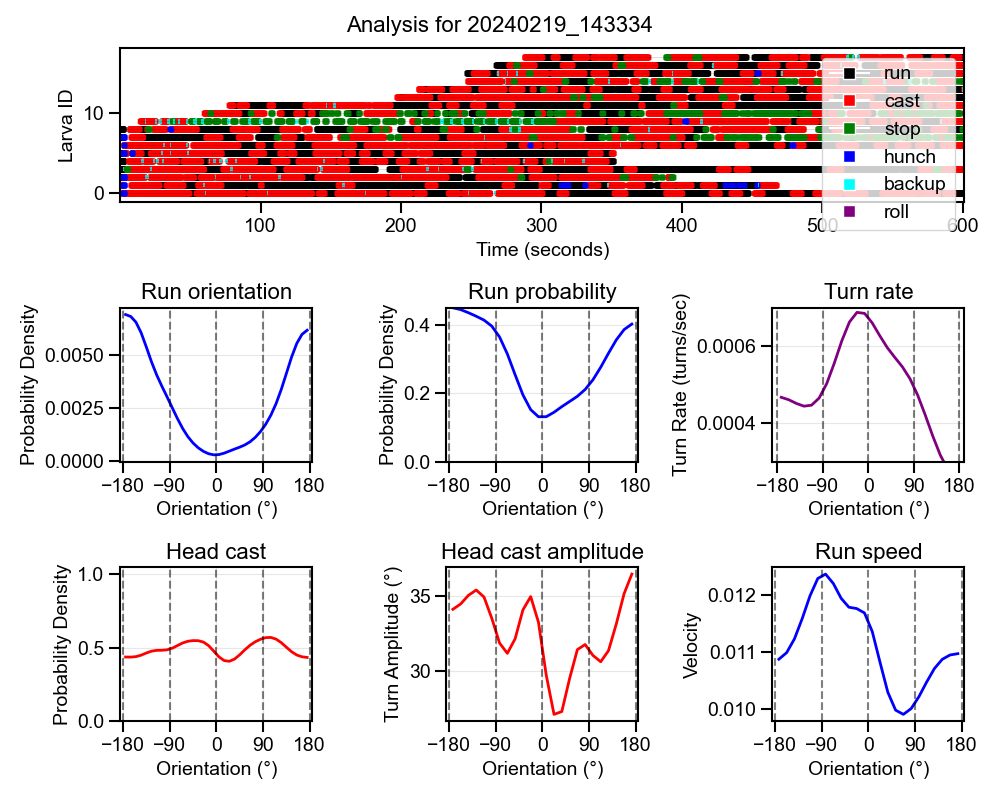

Analyzing 20240223_112627...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240223_112627/analysis_20240223_112627.png


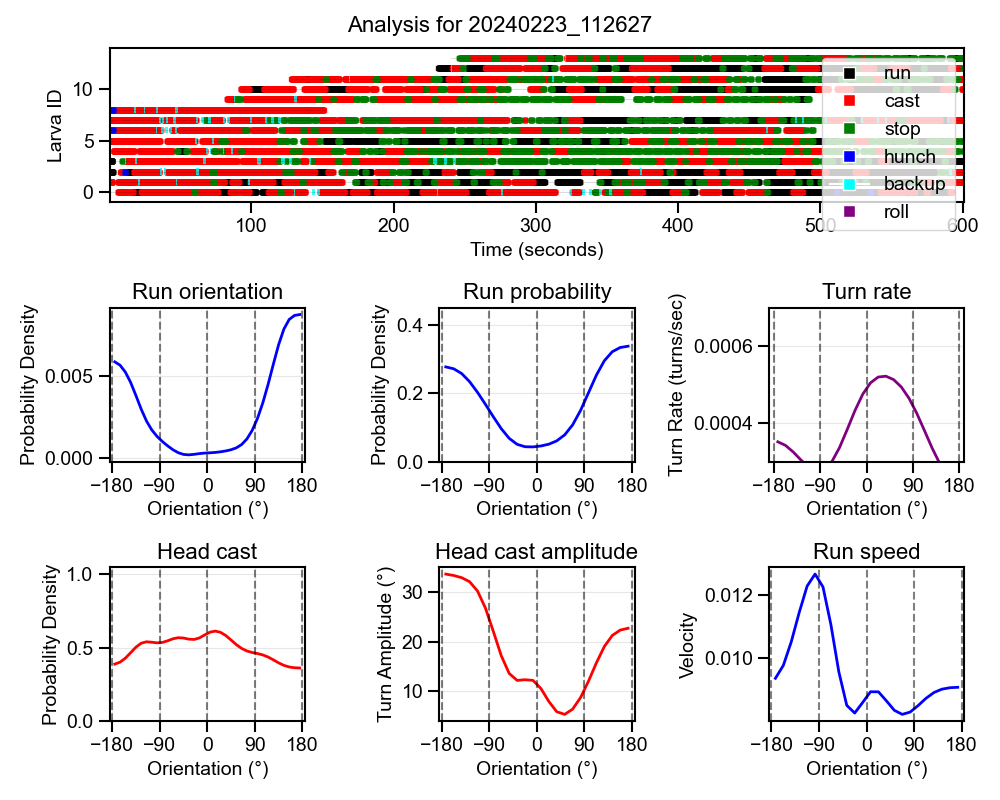

Analyzing 20240226_145653...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_145653/analysis_20240226_145653.png


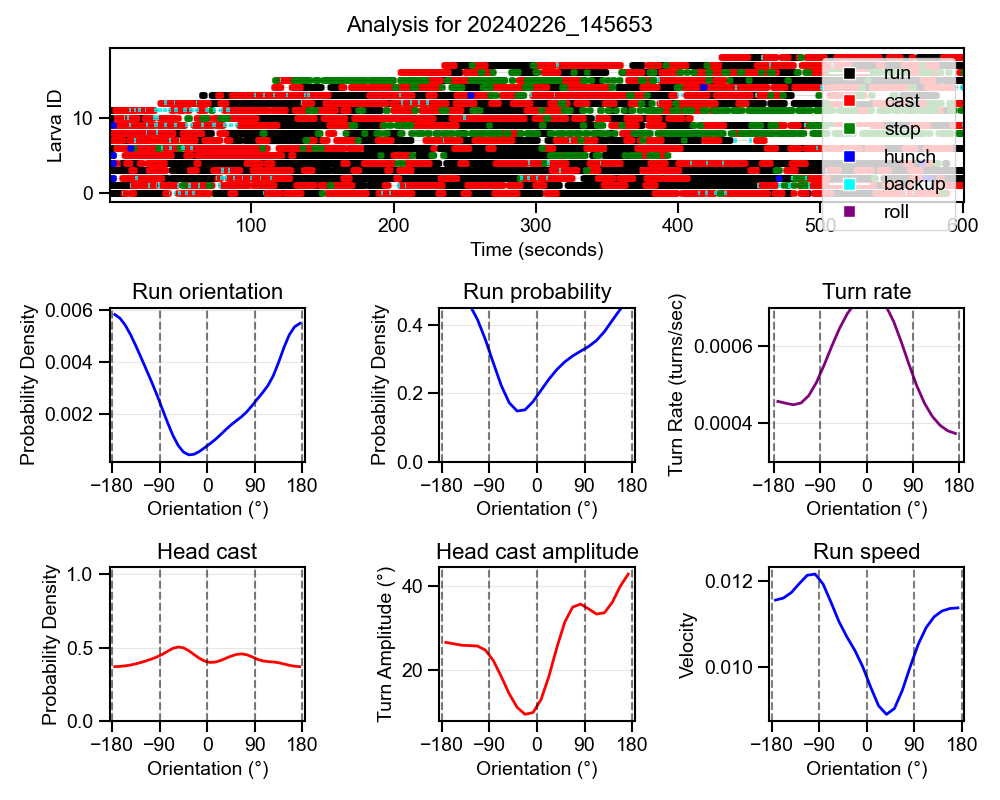

Analyzing 20240226_163646...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_163646/analysis_20240226_163646.png


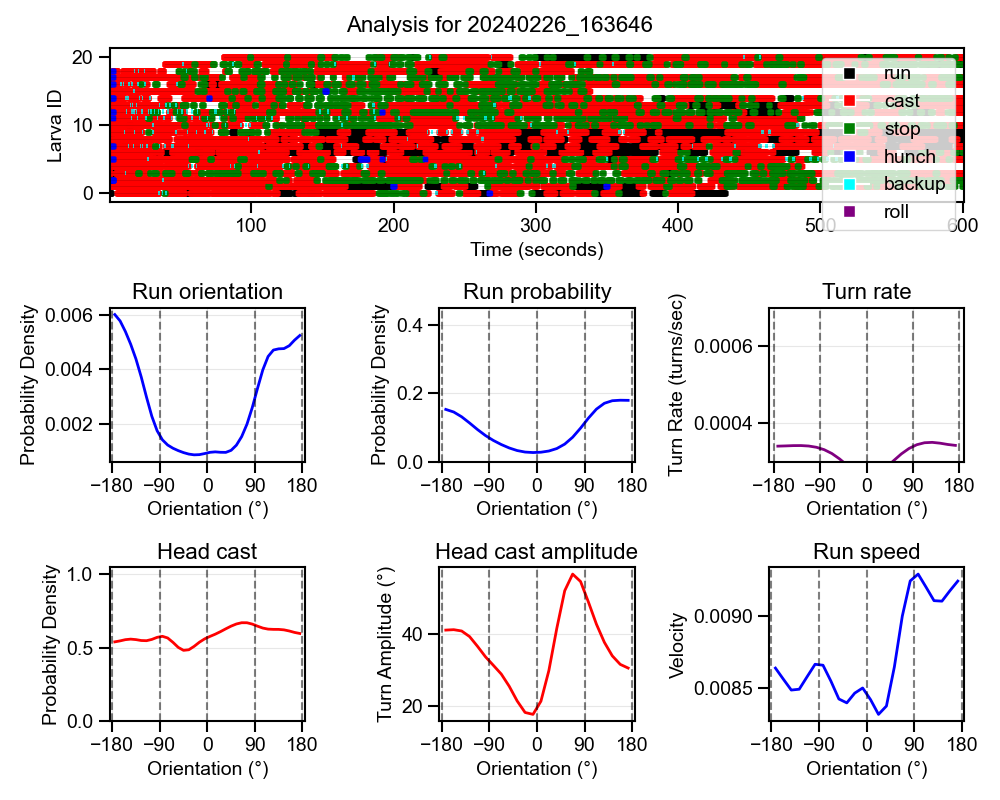

Analyzing 20240301_121446...


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_32053/2596328970.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10,8))


Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_121446/analysis_20240301_121446.png


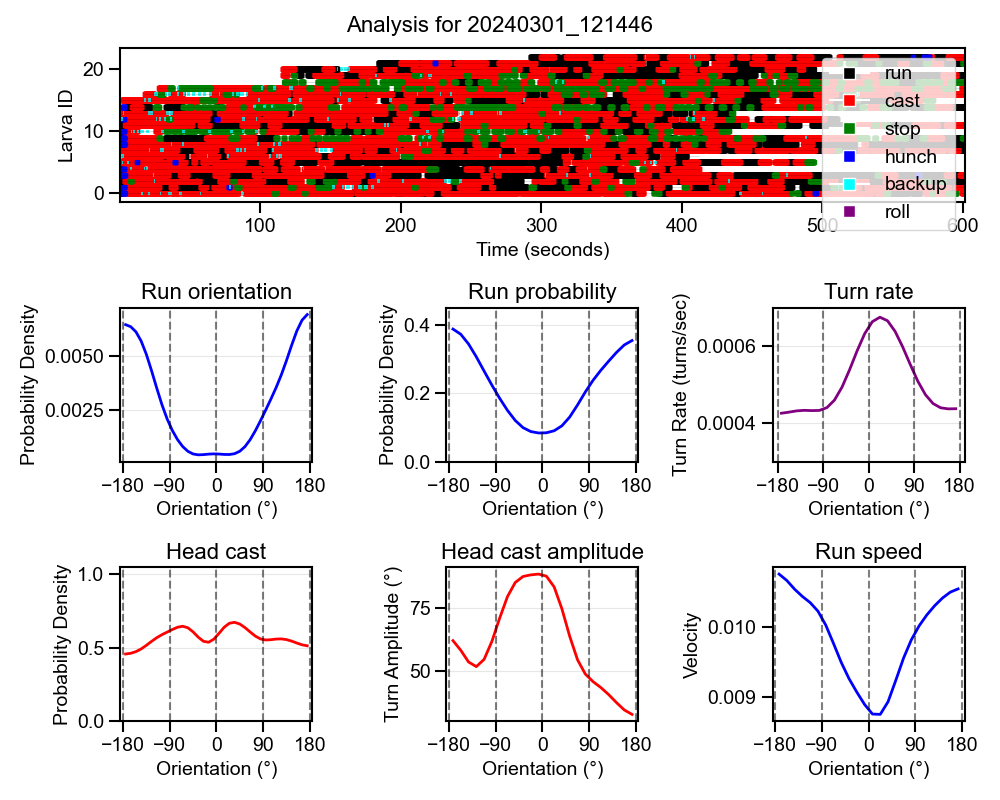

Analyzing 20240304_162010...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_162010/analysis_20240304_162010.png


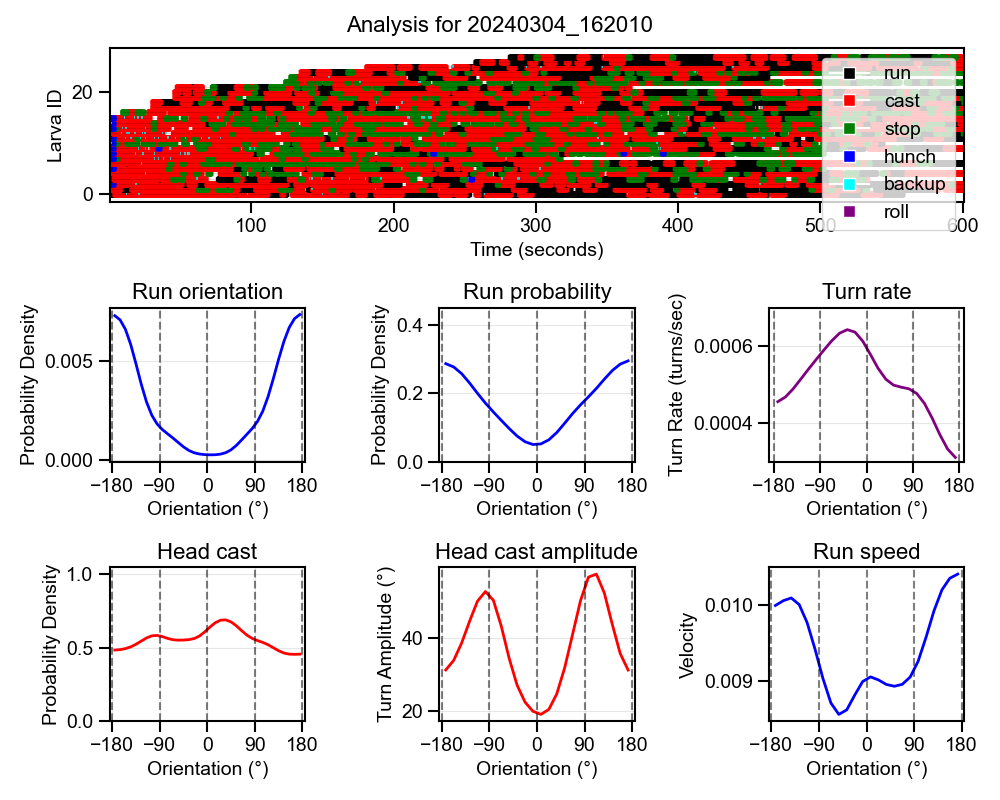

Analyzing 20250610_145557...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250610_145557/analysis_20250610_145557.png


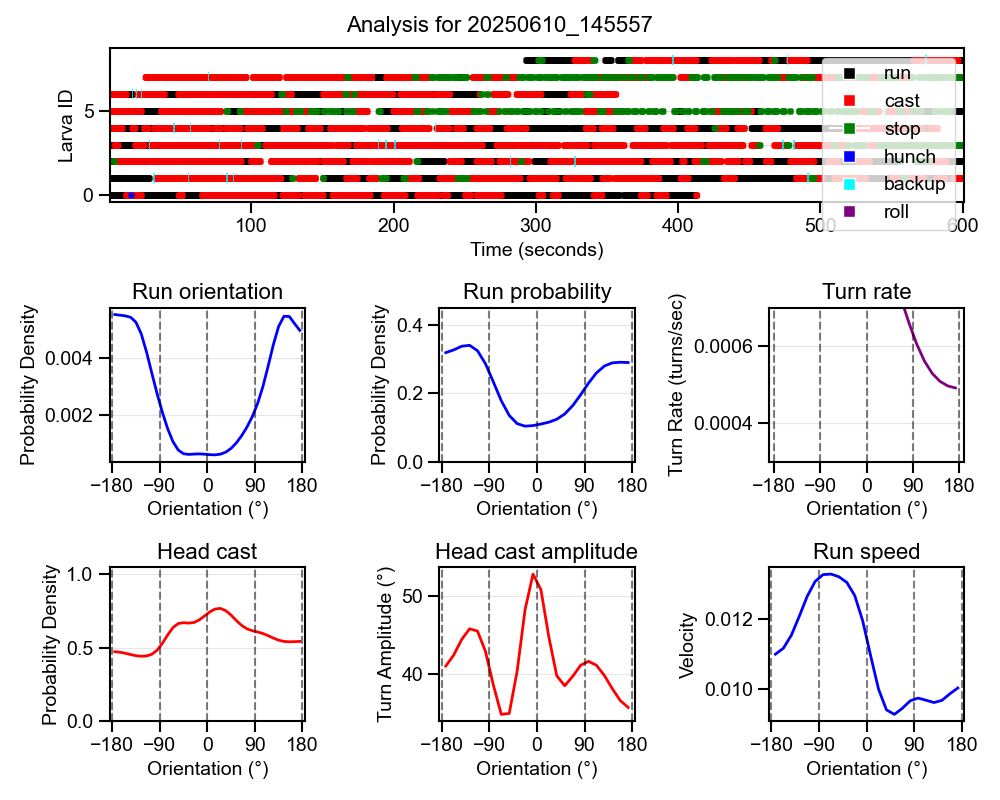

Analyzing 20250616_110409...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250616_110409/analysis_20250616_110409.png


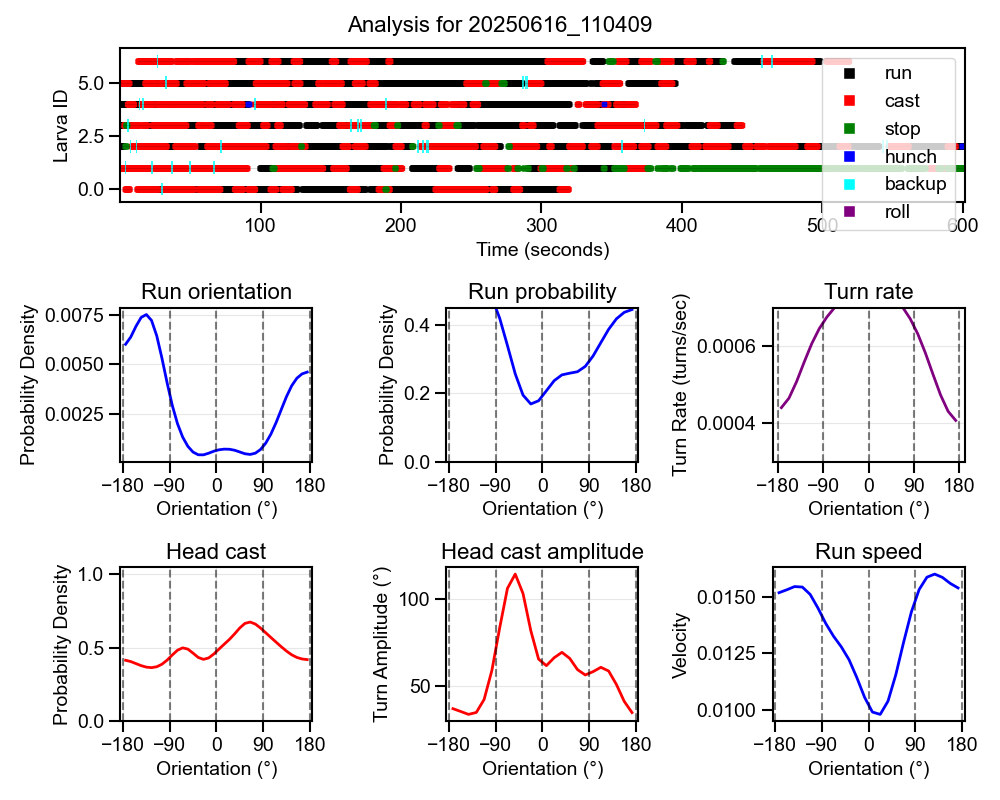

Analyzing 20250623_113205...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250623_113205/analysis_20250623_113205.png


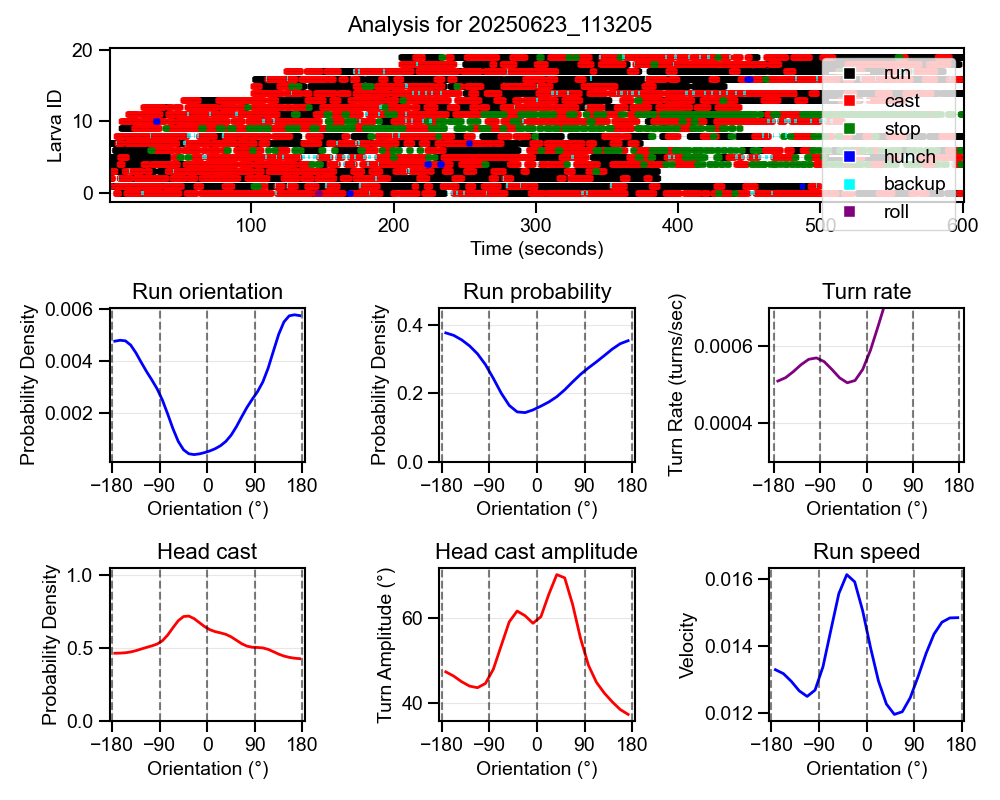

Analyzing 20250624_143316...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250624_143316/analysis_20250624_143316.png


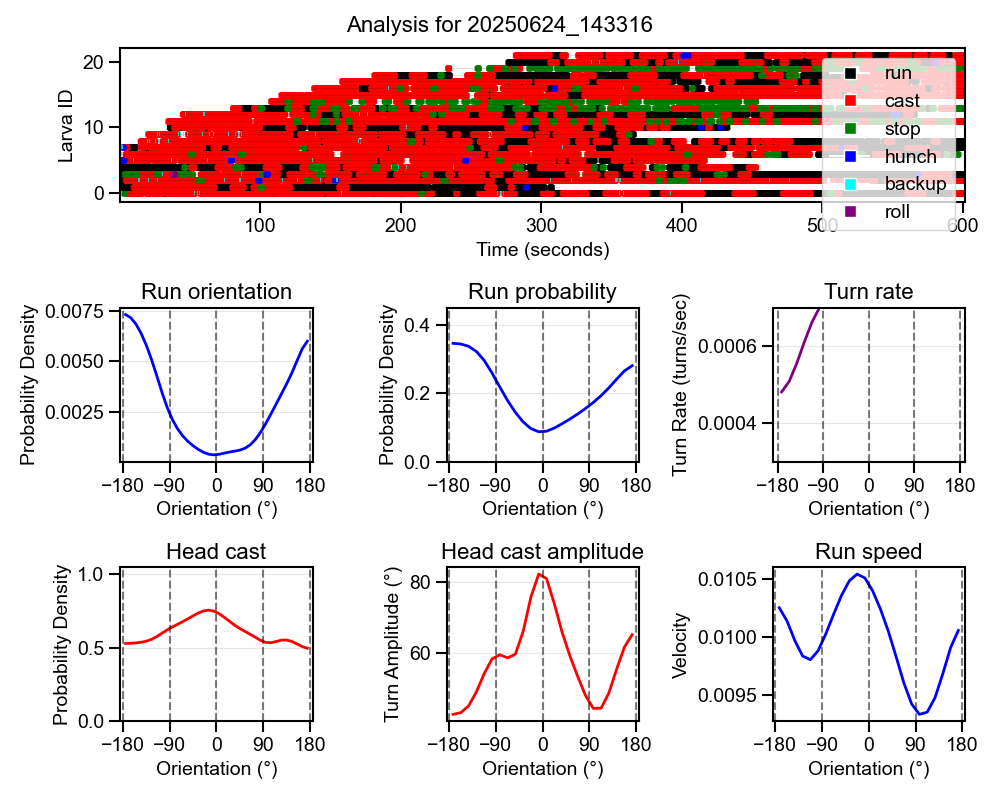

Analyzing 20250624_153628...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250624_153628/analysis_20250624_153628.png


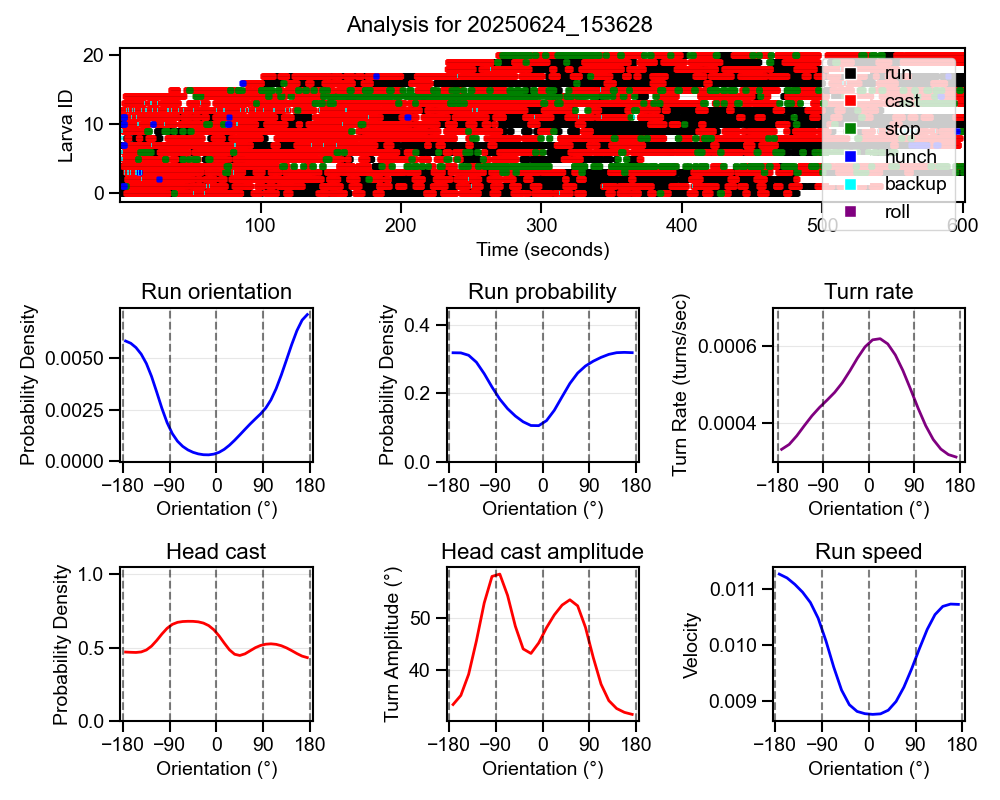

Analyzing 20250626_142647...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250626_142647/analysis_20250626_142647.png


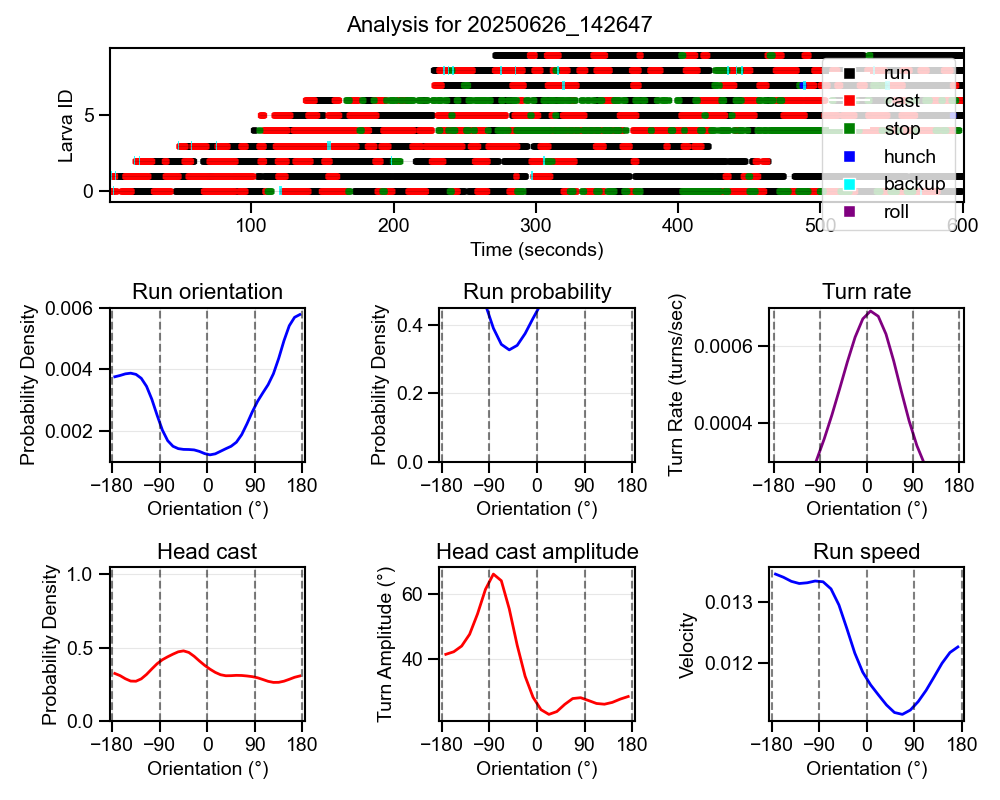

Analyzing 20250711_112928...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250711_112928/analysis_20250711_112928.png


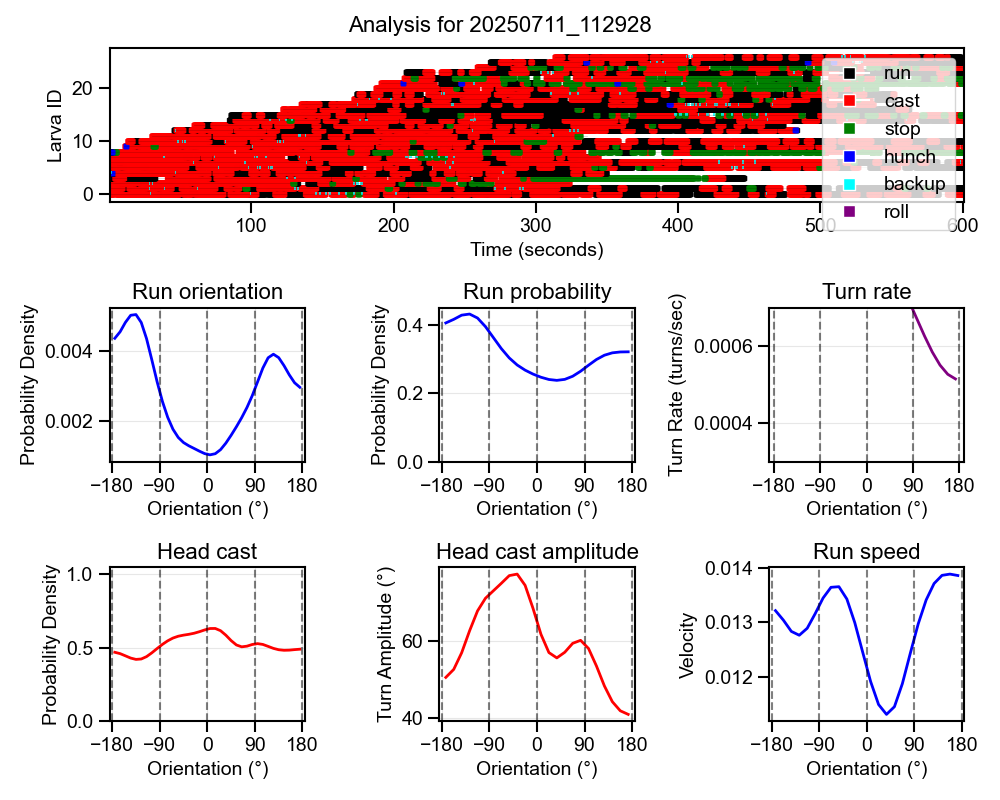

Analyzing 20250712_131147...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250712_131147/analysis_20250712_131147.png


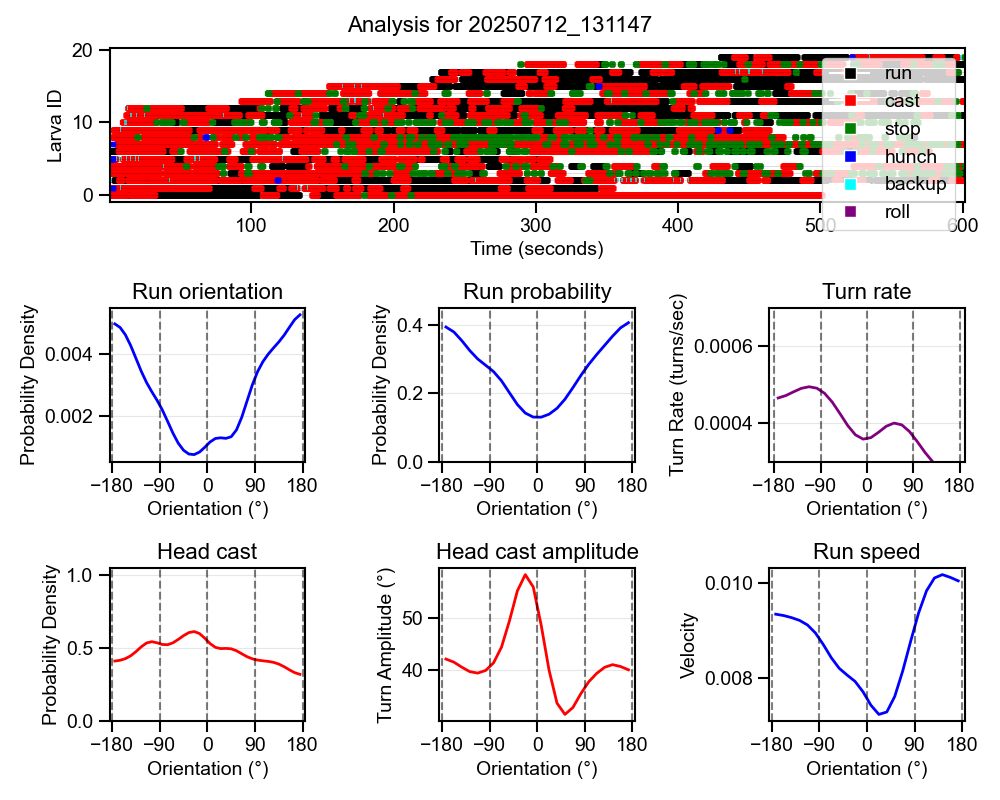

Analyzing 20250715_112915...
Saved figure to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250715_112915/analysis_20250715_112915.png


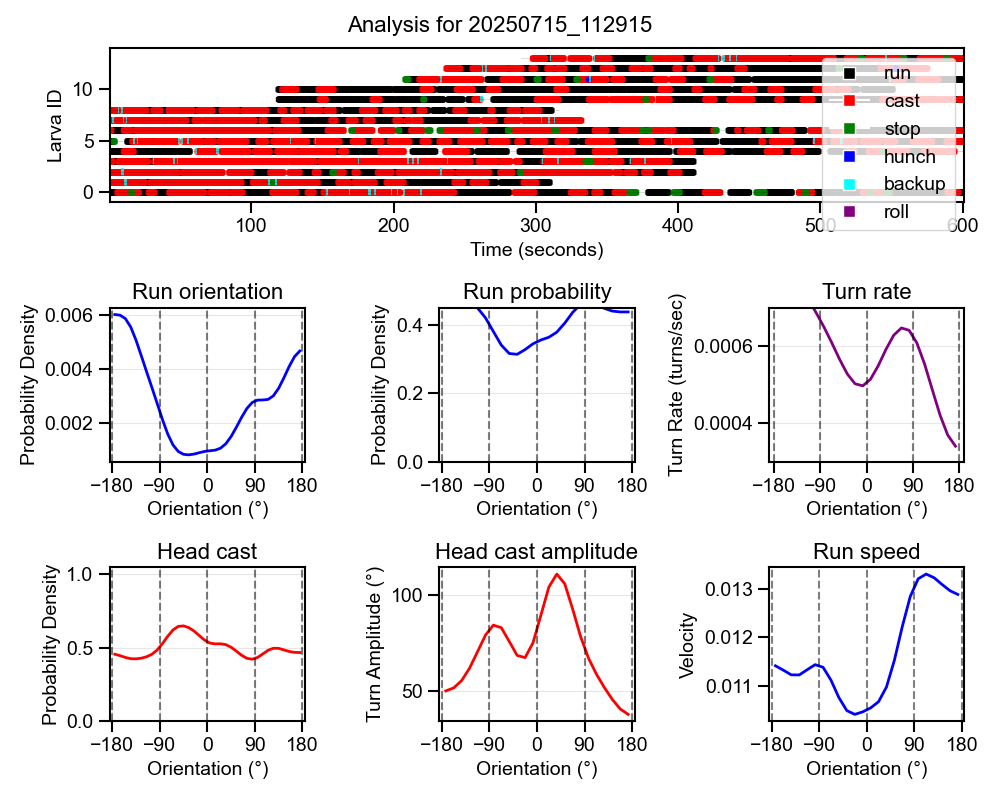

Saved combined analysis to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/analysis_all_combined.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/analysis_all_combined.pdf


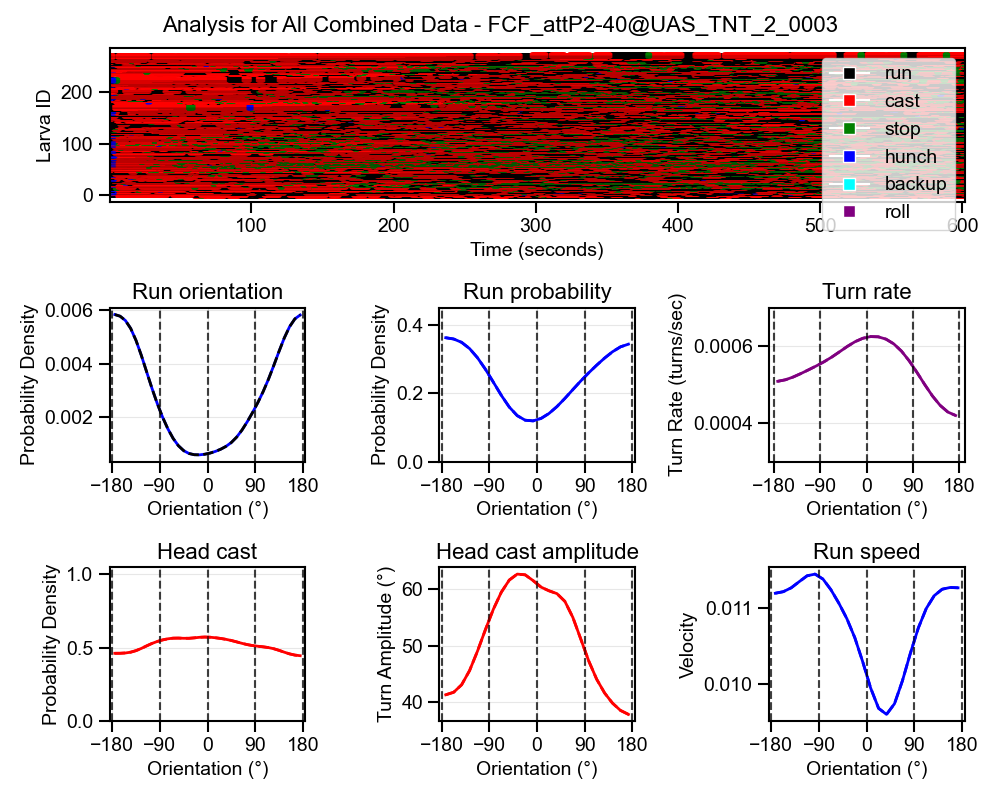

In [14]:
# Plot analysis for each date
for date_key, date_data in all_dates_data.items():
    if date_key != 'all_combined':
        analyze_date(date_data, output_dir)

# Now process the combined data and save it in the genotype root directory
if 'all_combined' in all_dates_data:
    combined_data = all_dates_data['all_combined']
    control_data = all_dates_data_control['all_combined']
    
    # Create the figure for combined data
    fig = plt.figure(figsize=(10,8))
    fig.suptitle(f"Analysis for All Combined Data - {genotype}", fontsize=16)
    gs = GridSpec(3, 3, figure=fig)
    
    # 1. Ethogram (spans the full first row)
    ax1 = fig.add_subplot(gs[0, :])
    plot_global_behavior_matrix(
        combined_data['merged_data'], show_separate_totals=False, show_plot=False, ax=ax1
    )
    
    # 2. Run orientation distribution
    ax2 = fig.add_subplot(gs[1, 0])
    analyze_run_orientations_all(
        combined_data['merged_data'], show_plot=False, ax=ax2
    )
    analyze_run_orientations_all(
        control_data['merged_data'], show_plot=False, ax=ax2, control=True
    )
    ax2.set_title("Run orientation")
    
    # 3. Run probability by orientation
    ax3 = fig.add_subplot(gs[1, 1])
    analyze_run_rate_by_orientation(
        combined_data['merged_data'], bin_width=15, show_plot=False, ax=ax3
    )
    analyze_run_rate_by_orientation(
        control_data['merged_data'], bin_width=15, show_plot=False, ax=ax3, control=True
    )
    ax3.set_title("Run probability")

    # 4. Turn rate by orientation
    ax4 = fig.add_subplot(gs[1, 2])
    analyze_turn_rate_by_orientation_true(
        combined_data['merged_data'], bin_width=15, show_plot=False, ax=ax4
    )
    analyze_turn_rate_by_orientation_true(
        control_data['merged_data'], bin_width=15, show_plot=False, ax=ax4, control = True
    )
    ax4.set_title("Turn rate")

    # 5. Cast orientation analysis
    ax5 = fig.add_subplot(gs[2, 0])
    analyze_cast_orientations_all_true(
        combined_data['merged_data'], show_plot=False, ax=ax5
    )
    analyze_cast_orientations_all_true(
        control_data['merged_data'], show_plot=False, ax=ax5, control=True
    )
    ax5.set_title("Head cast")

    # 6. Cast amplitudes by orientation
    ax6 = fig.add_subplot(gs[2, 1])
    analyze_turn_amplitudes_by_orientation(
        combined_data['merged_data'], bin_width=15, show_plot=False, ax=ax6
    )
    analyze_turn_amplitudes_by_orientation(
        control_data['merged_data'], bin_width=15, show_plot=False, ax=ax6, control=True
    )
    ax6.set_title("Head cast amplitude")
    
    # 7. Velocities by orientation
    ax7 = fig.add_subplot(gs[2, 2])
    analyze_velocity_by_orientation(
        combined_data['merged_data'], bin_width=15, show_plot=False, ax=ax7
    )
    analyze_velocity_by_orientation(
        control_data['merged_data'], bin_width=15, show_plot=False, ax=ax7, control=True
    )
    ax7.set_title("Run speed")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    
    # Save directly to genotype folder (not in date subfolder)
    save_path_png = os.path.join(output_dir, "analysis_all_combined.png")
    save_path_pdf = os.path.join(output_dir, "analysis_all_combined.pdf")
    plt.savefig(save_path_png)
    plt.savefig(save_path_pdf)
    print(f"Saved combined analysis to {save_path_png} and {save_path_pdf}")
     
    plt.show()

In [ ]:
# plot_over_time_for_genotype(all_dates_data, window = 60, step = 10, output_dir=output_dir)

## Individual across time

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_143334/fit_lines_over_time_20240219_143334.png


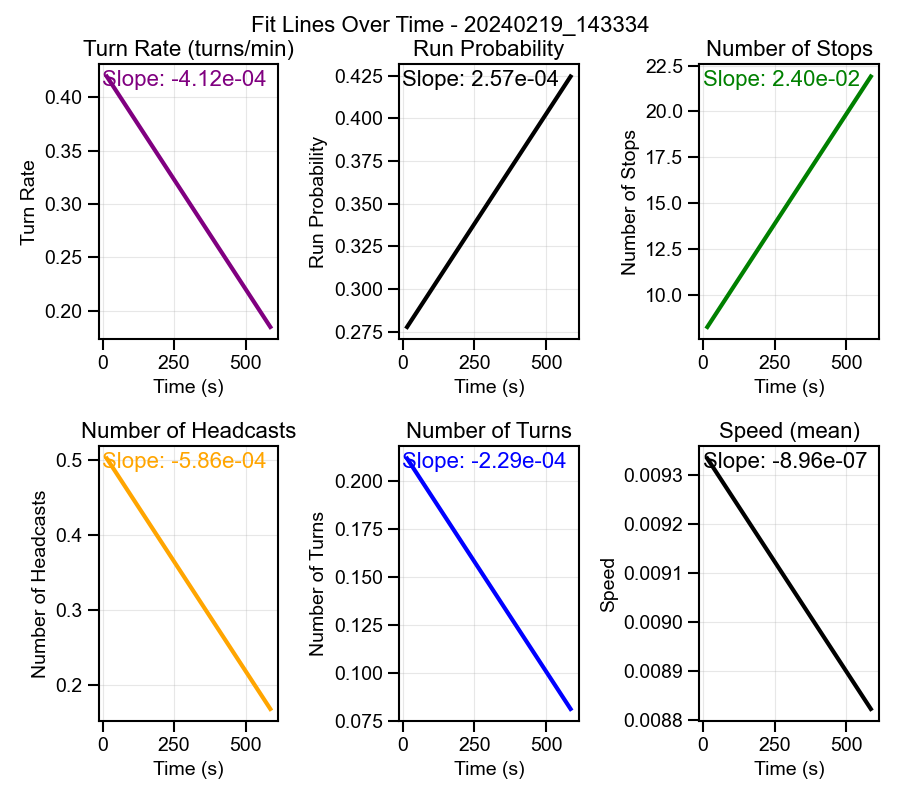

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_145653/fit_lines_over_time_20240226_145653.png


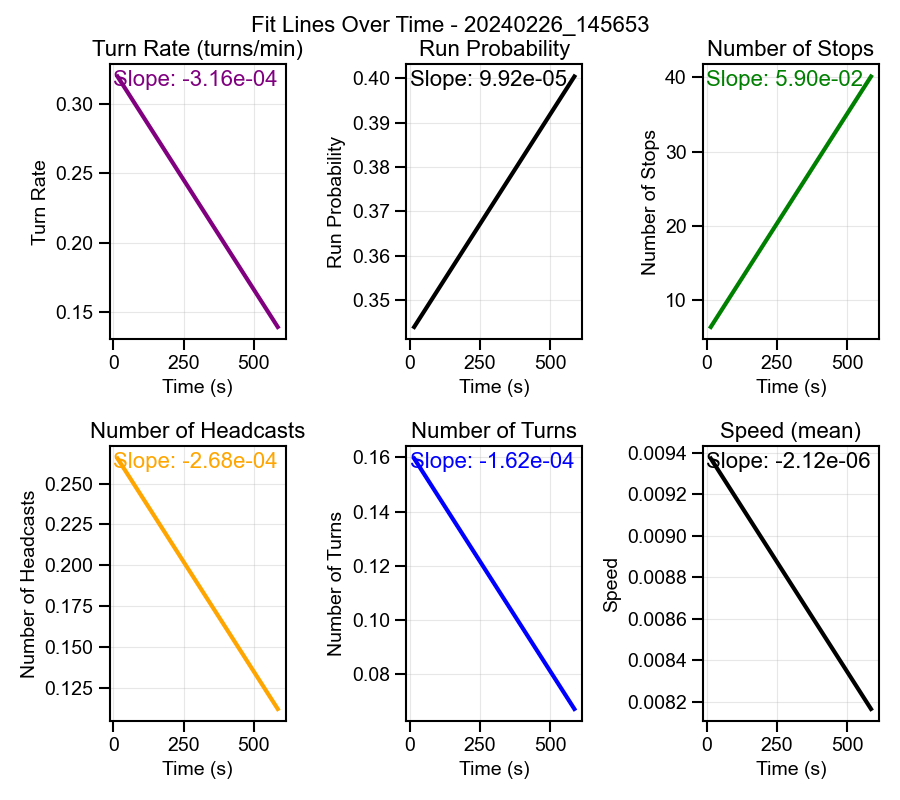

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_163646/fit_lines_over_time_20240226_163646.png


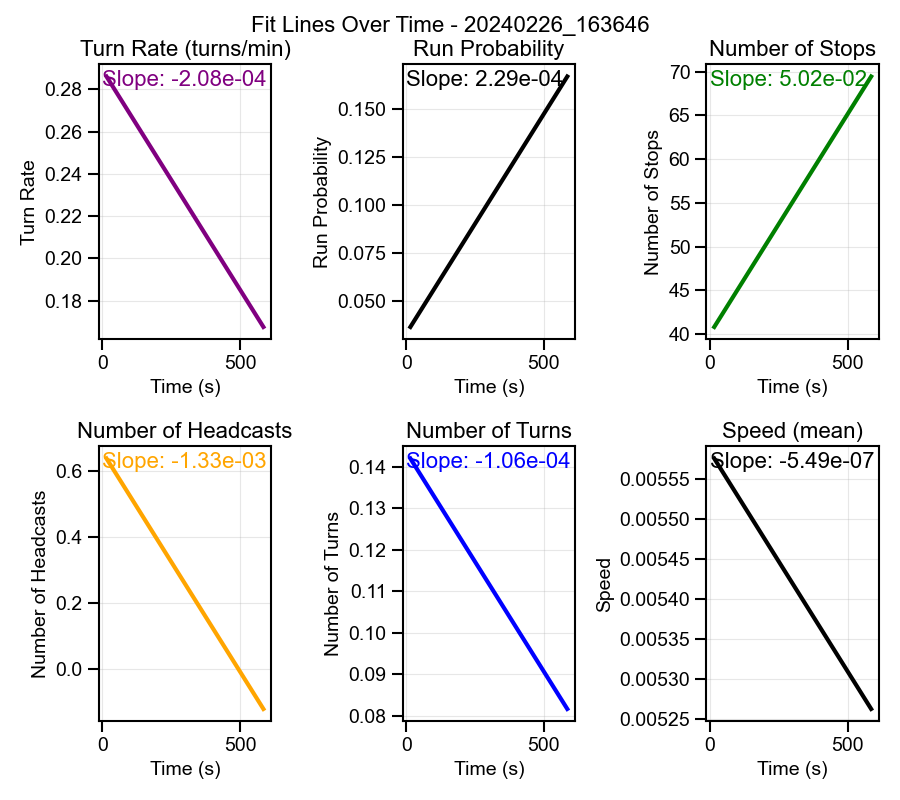

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_121446/fit_lines_over_time_20240301_121446.png


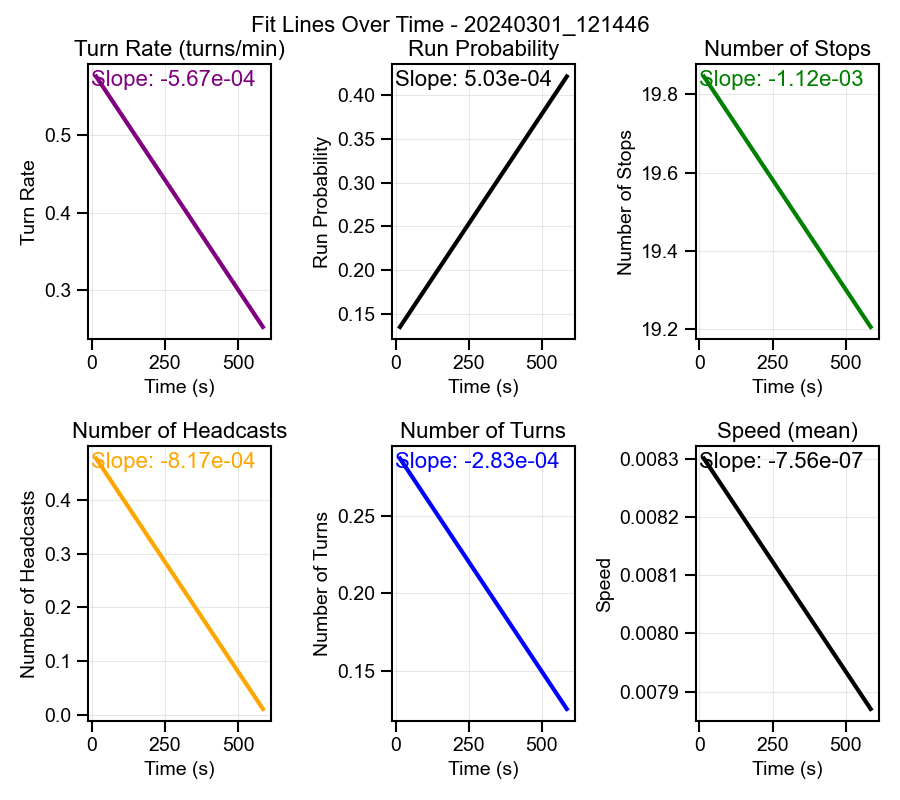

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_162010/fit_lines_over_time_20240304_162010.png


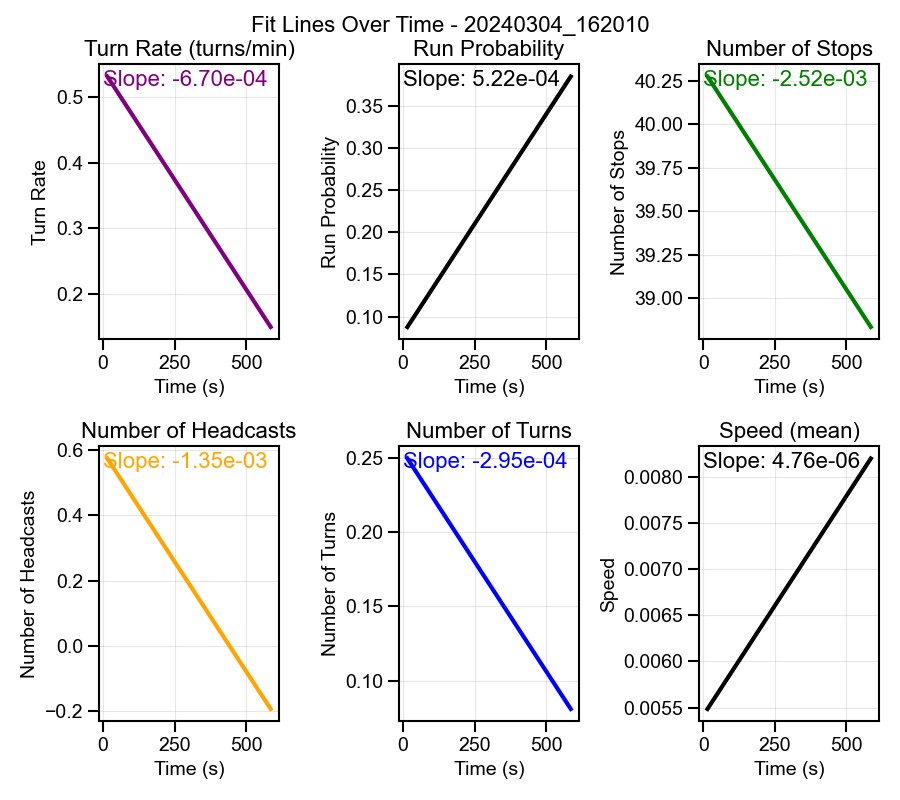

/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_28471/3404421063.py:285: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(9, 8))


Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250610_145557/fit_lines_over_time_20250610_145557.png


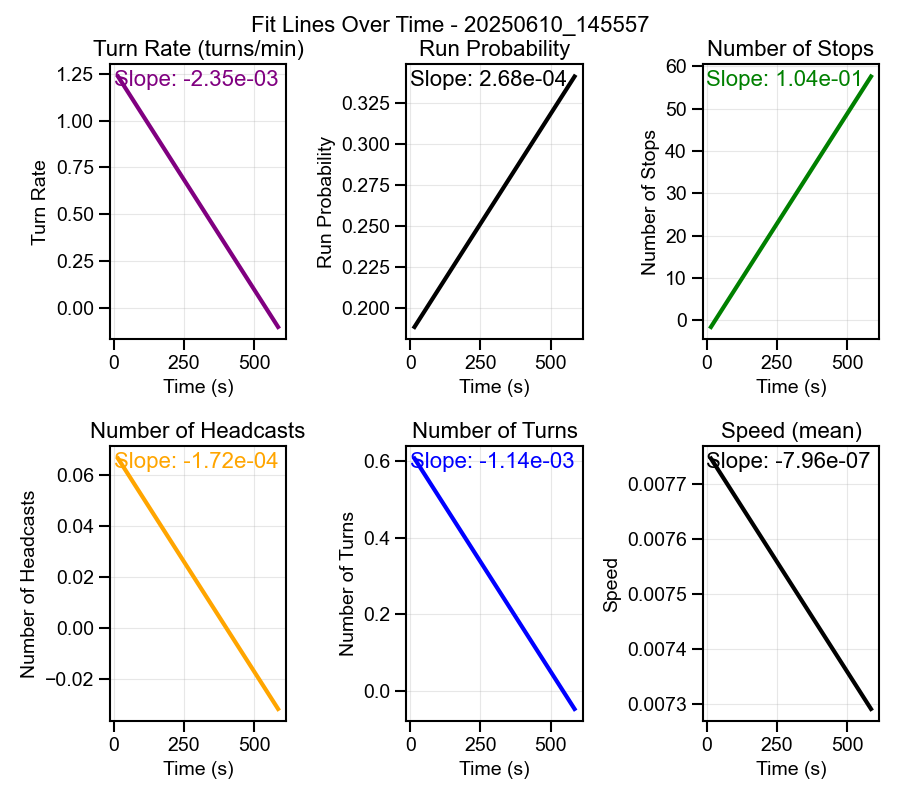

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250616_110409/fit_lines_over_time_20250616_110409.png


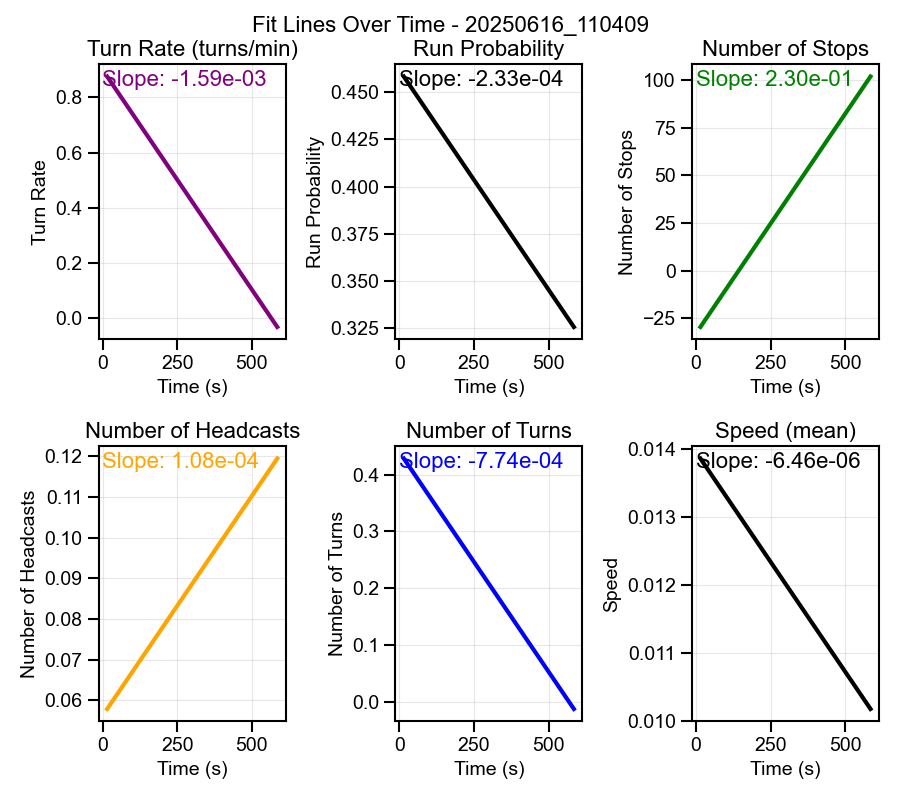

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250623_113205/fit_lines_over_time_20250623_113205.png


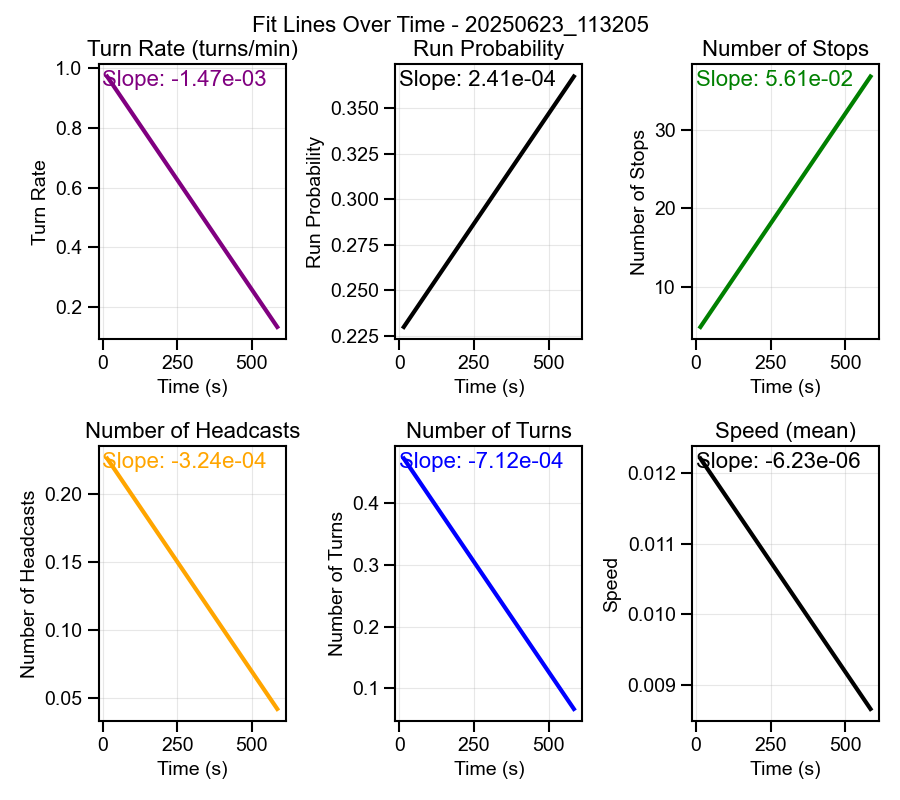

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250624_143316/fit_lines_over_time_20250624_143316.png


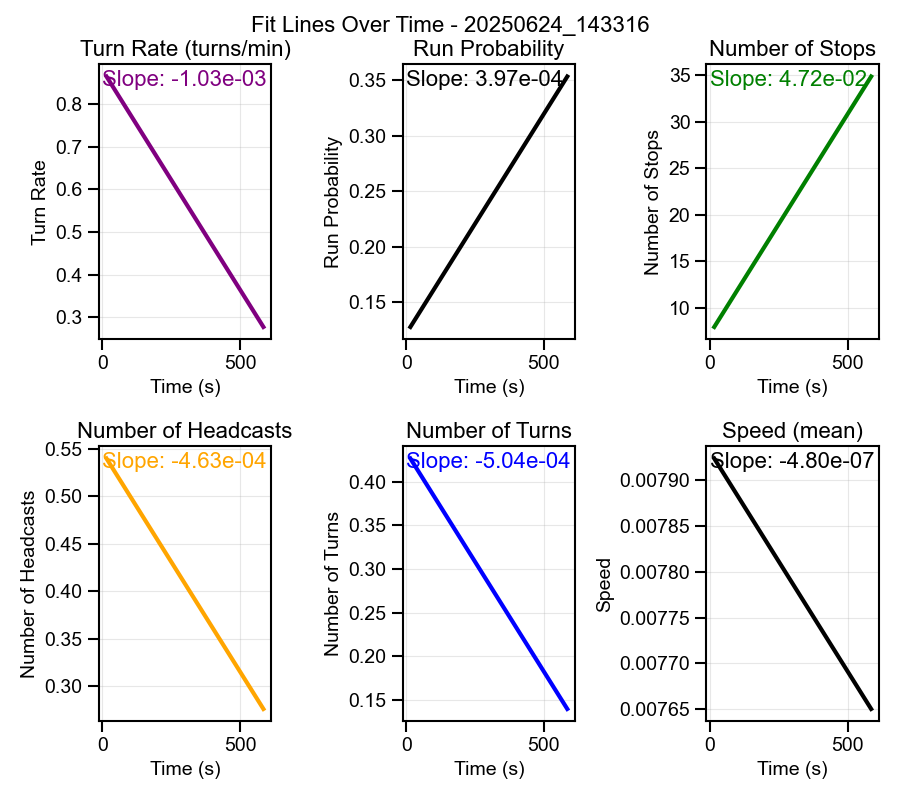

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250624_153628/fit_lines_over_time_20250624_153628.png


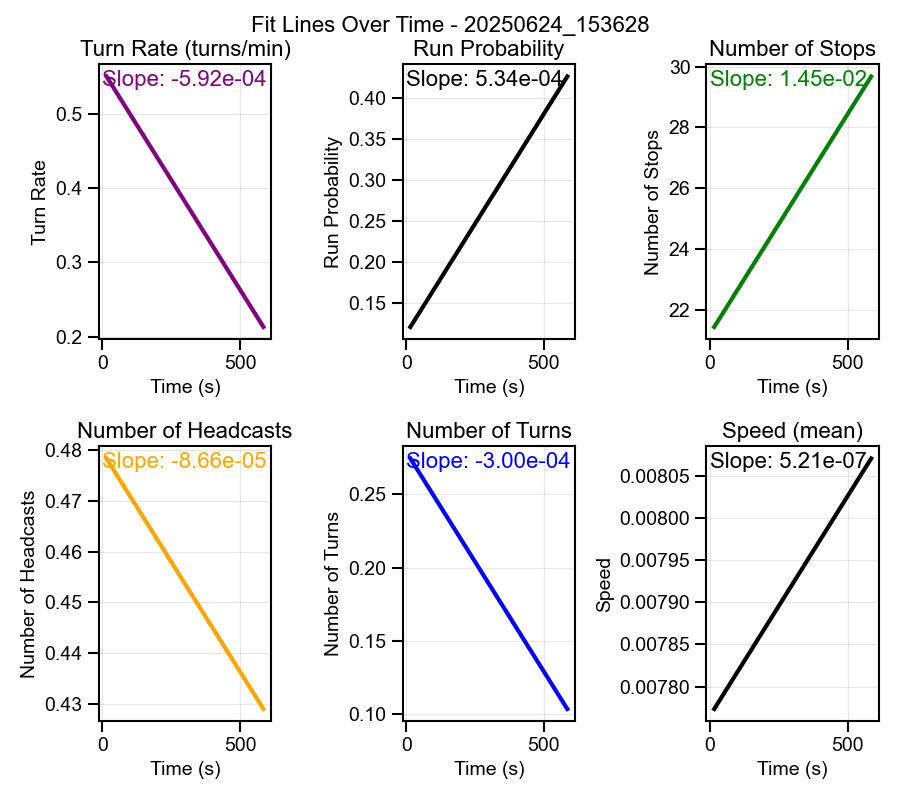

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250626_142647/fit_lines_over_time_20250626_142647.png


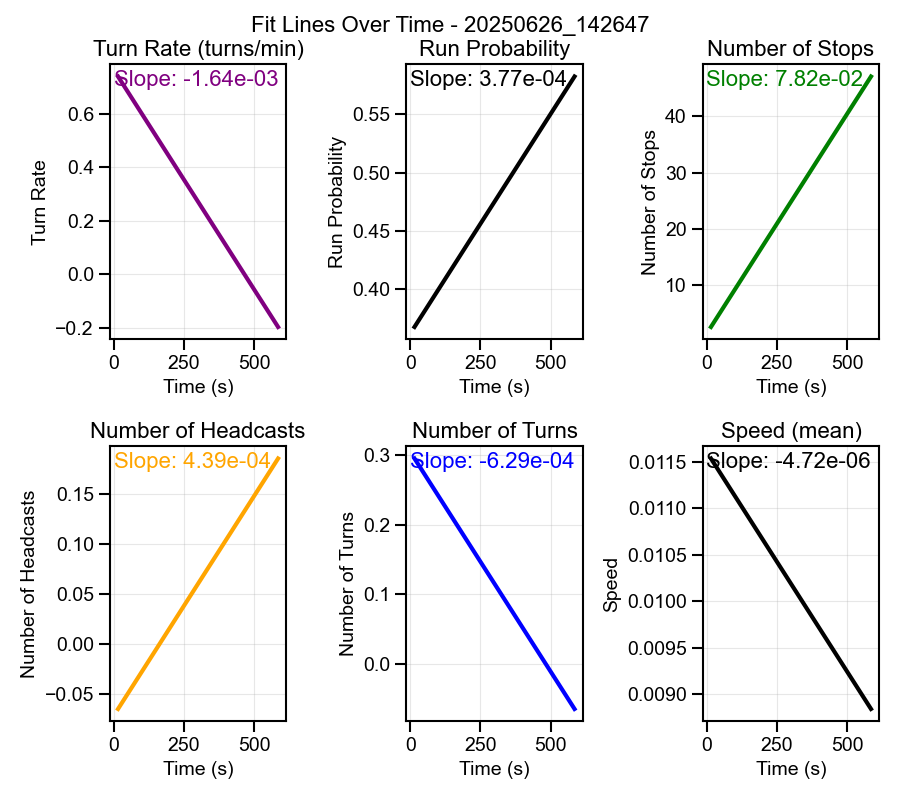

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250711_112928/fit_lines_over_time_20250711_112928.png


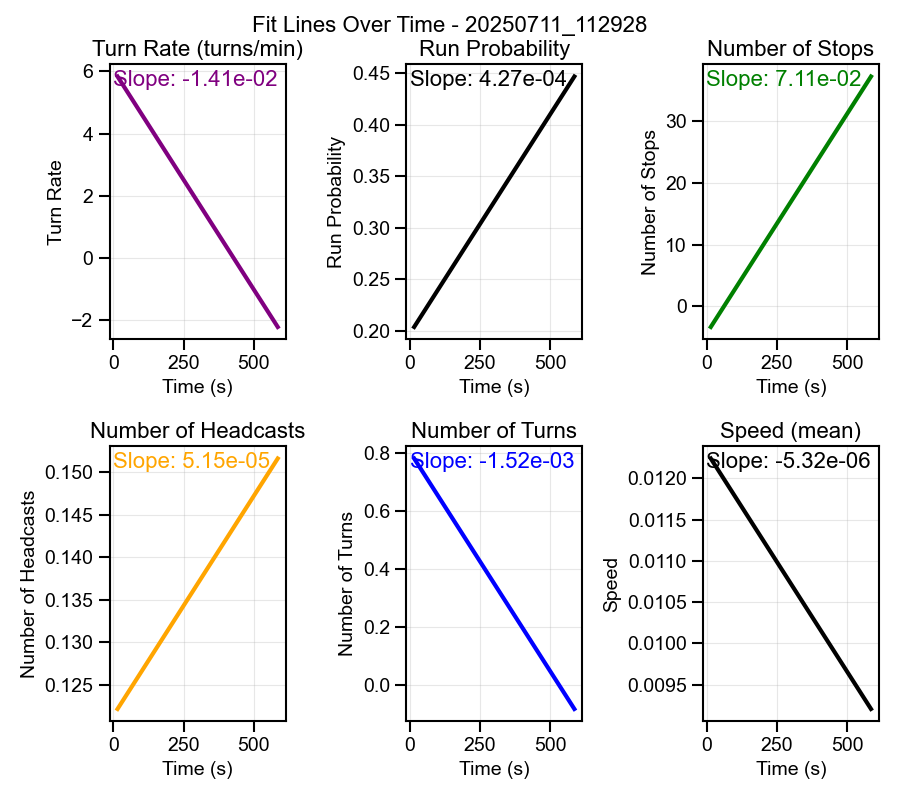

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250712_131147/fit_lines_over_time_20250712_131147.png


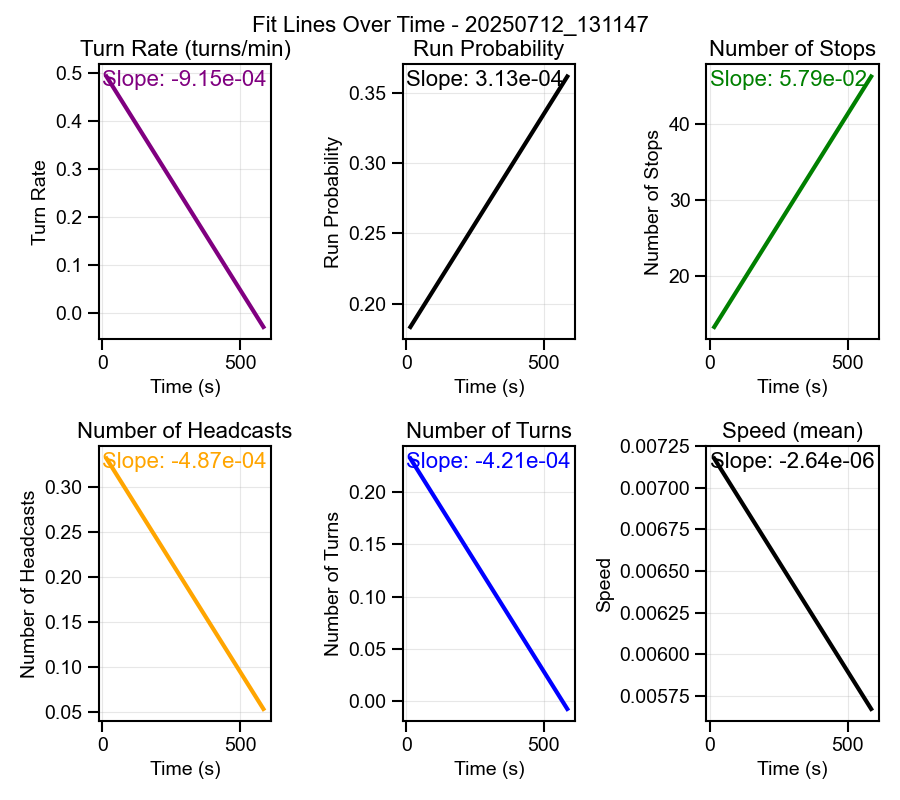

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250715_112915/fit_lines_over_time_20250715_112915.png


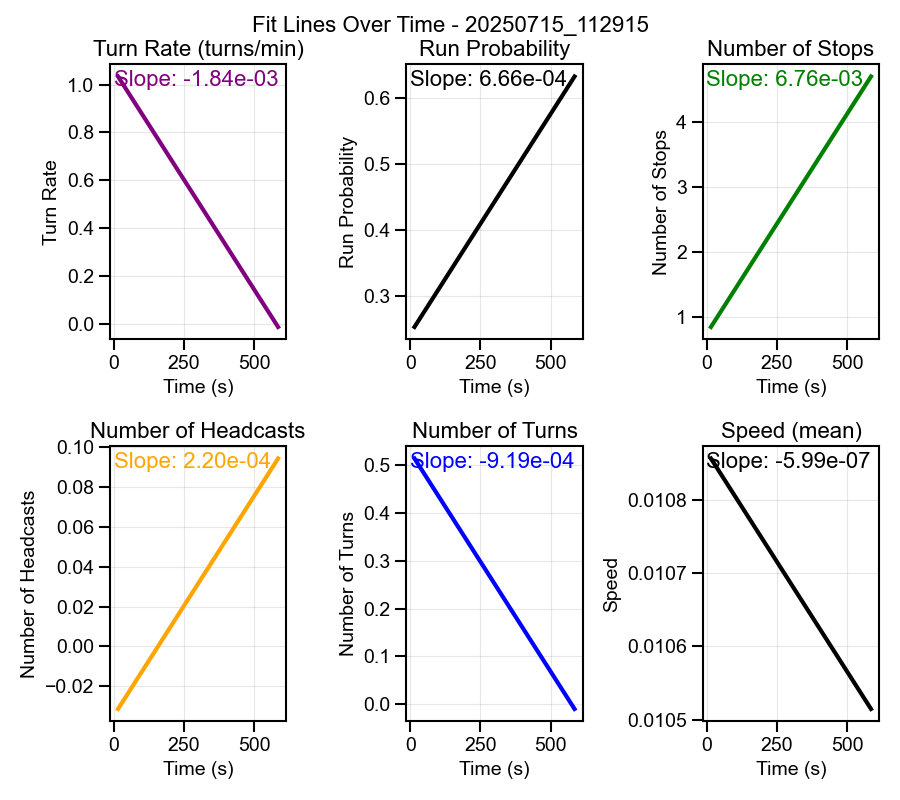

Saved fit-lines-over-time plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/All Combined/fit_lines_over_time_All Combined.png


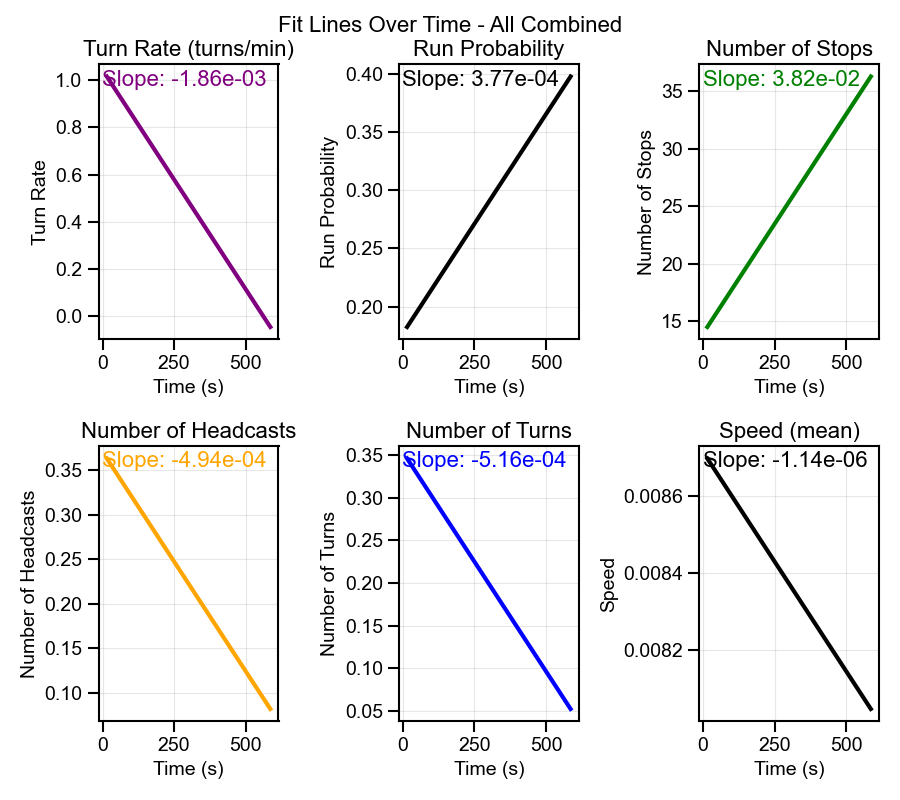

In [15]:
plot_individuals_over_time_absolute_genotype(all_dates_data_control, window = 30, step = 10, output_dir=output_dir, combined=False)

<Axes: title={'center': 'Hunch Probability Across Time (All Larvae)'}, xlabel='Time (s)', ylabel='Hunch Probability'>

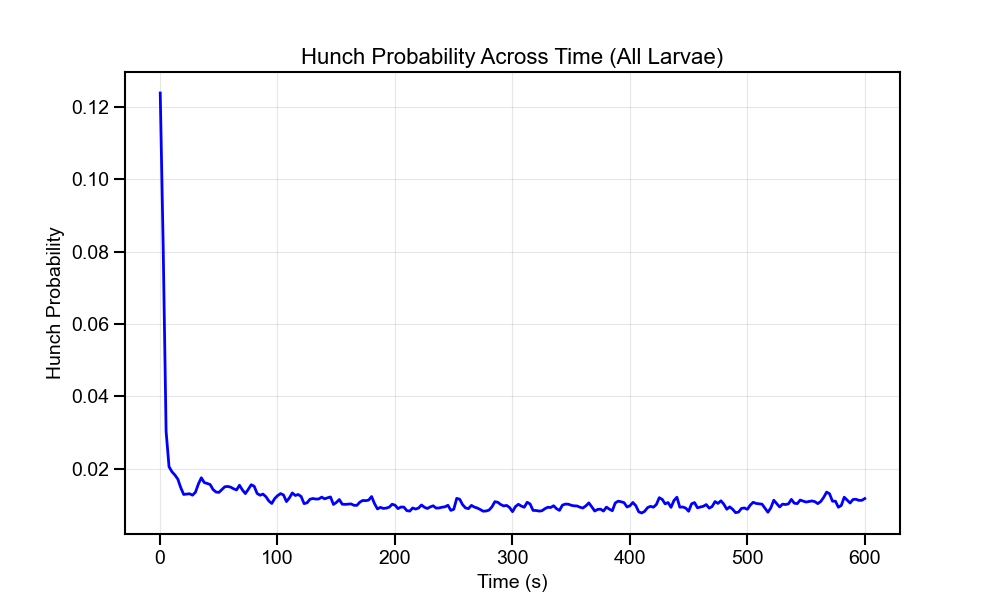

In [16]:
def plot_hunch_probability_all_larvae(trx_data, show_plot=True, ax=None, smooth_window=0.01):
    """
    Plot the hunch probability (P(Hunch)) for all larvae as individual traces across time,
    and overlay the mean hunch probability at each timepoint (nanmean across larvae), smoothed with a moving window.
    Uses the t vector for x-axis and proba_global_state[:, 3] for hunch probability.
    No interpolation; just plot all available data.
    smooth_window: window size in seconds for smoothing the mean trace.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    # Get larvae data
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    # Prepare figure
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(10, 6))

    all_hunch = []
    all_t = []

    # Plot each larva's hunch probability
    for larva_id, larva in data_to_process.items():
        if 't' not in larva or 'proba_global_state' not in larva:
            continue
        t = np.array(larva['t']).flatten()
        probs = np.array(larva['proba_global_state'])
        hunch = probs[3, :]
        # ax.plot(t, hunch, alpha=0.1, color='blue')
        all_hunch.append(hunch)
        all_t.append(t)

    # Plot smoothed mean hunch probability using a moving window
    if all_t and all_hunch:
        all_t_concat = np.concatenate(all_t)
        all_hunch_concat = np.concatenate(all_hunch)
        sort_idx = np.argsort(all_t_concat)
        t_sorted = all_t_concat[sort_idx]
        hunch_sorted = all_hunch_concat[sort_idx]

        # Moving window smoothing
        t_min, t_max = np.min(t_sorted), np.max(t_sorted)
        window_centers = np.arange(t_min, t_max, smooth_window/2)
        mean_hunch_smooth = []
        for center in window_centers:
            mask = (t_sorted >= center - smooth_window/2) & (t_sorted < center + smooth_window/2)
            if np.any(mask):
                mean_hunch_smooth.append(np.nanmean(hunch_sorted[mask]))
            else:
                mean_hunch_smooth.append(np.nan)
        ax.plot(window_centers, mean_hunch_smooth, color='blue', linewidth=2)

    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Hunch Probability')
    ax.set_title('Hunch Probability Across Time (All Larvae)')
    ax.grid(True, alpha=0.3)
    # No legend

    if show_plot and ax is None:
        plt.tight_layout()
        plt.show()

    return ax

# Usage:
plot_hunch_probability_all_larvae(all_dates_data['all_combined']['merged_data'], smooth_window=5)

In [17]:
# plot_time_in_run_and_cast_stacked(all_dates_data['all_combined']['merged_data'])

In [18]:
# # Create polar run analysis plots
# for date_key, date_data in all_dates_data.items():
#     plt.figure(figsize=(10, 8))
    
#     # Use the merged data for polar analysis
#     merged_data = date_data['merged_data']
    
#     # Create polar plot
#     results = processor.plot_polar_run_histograms(
#         merged_data, 
#         bin_width=5,
#         save_path=os.path.join(output_dir, f"polar_run_{date_key}.png")
#     )
    
#     plt.suptitle(f"Polar Run Analysis - {date_data['date_str']}", fontsize=14)
#     plt.show()

/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_28471/391594544.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


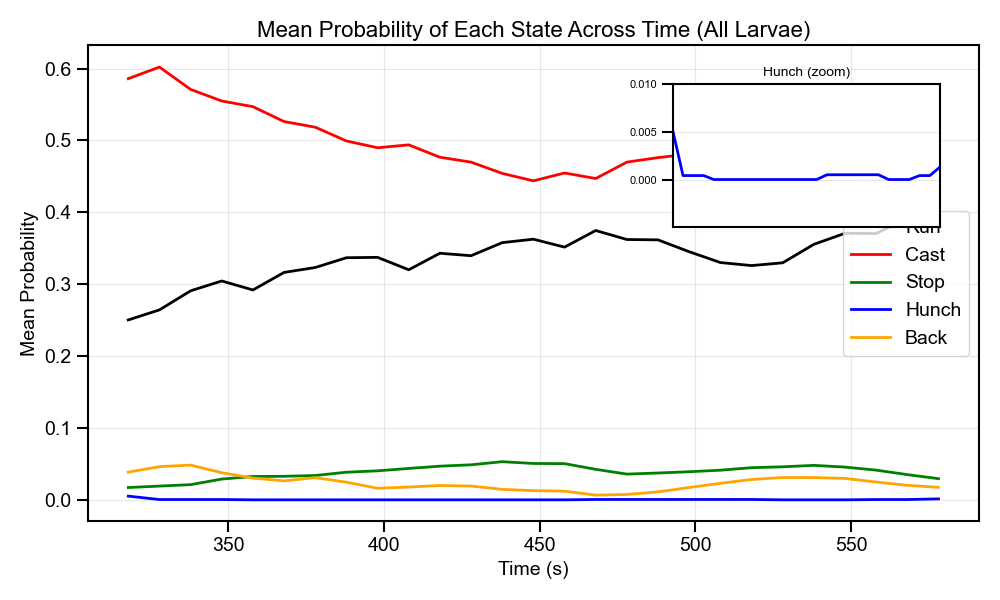

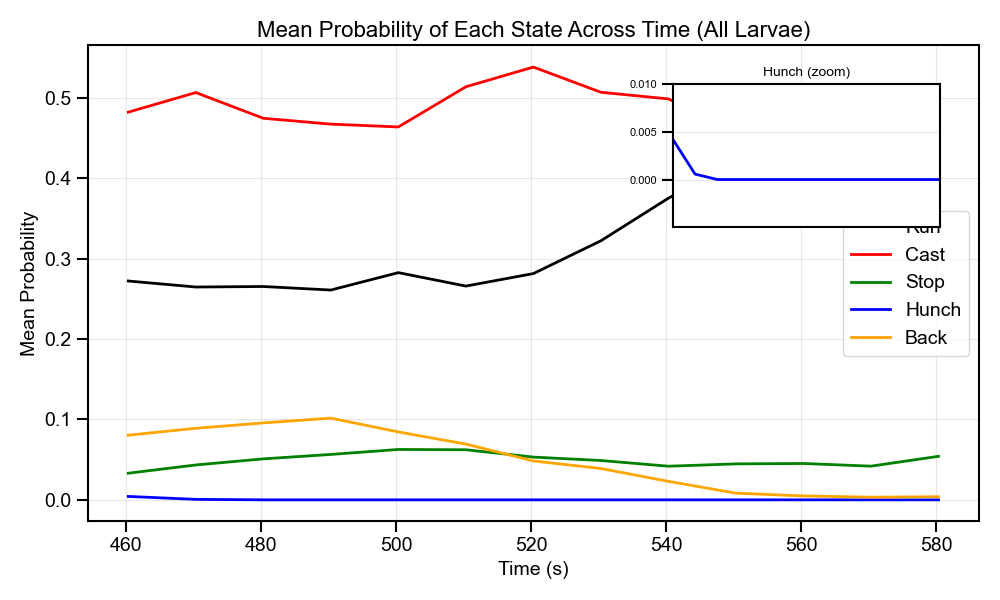

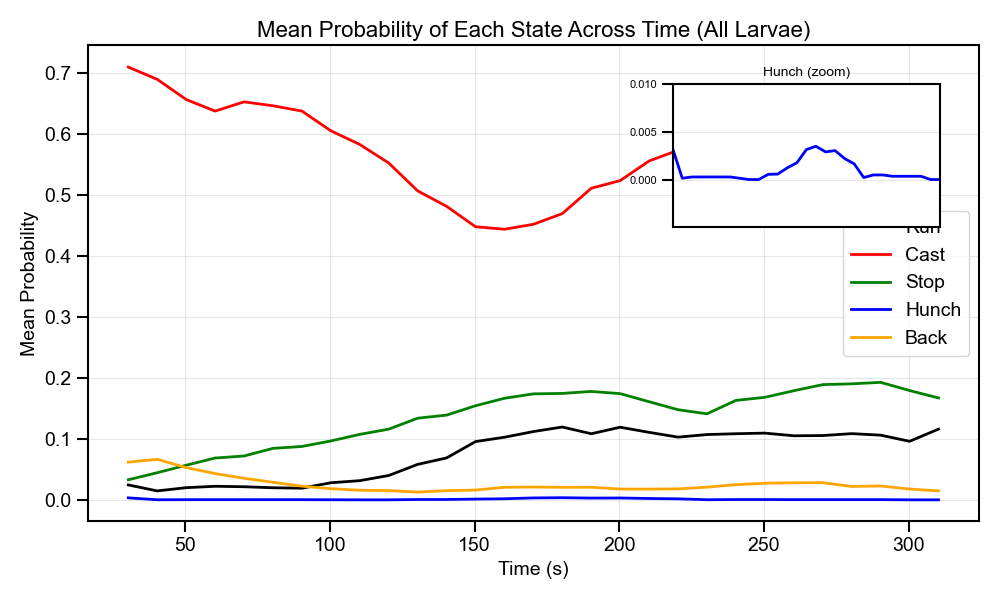

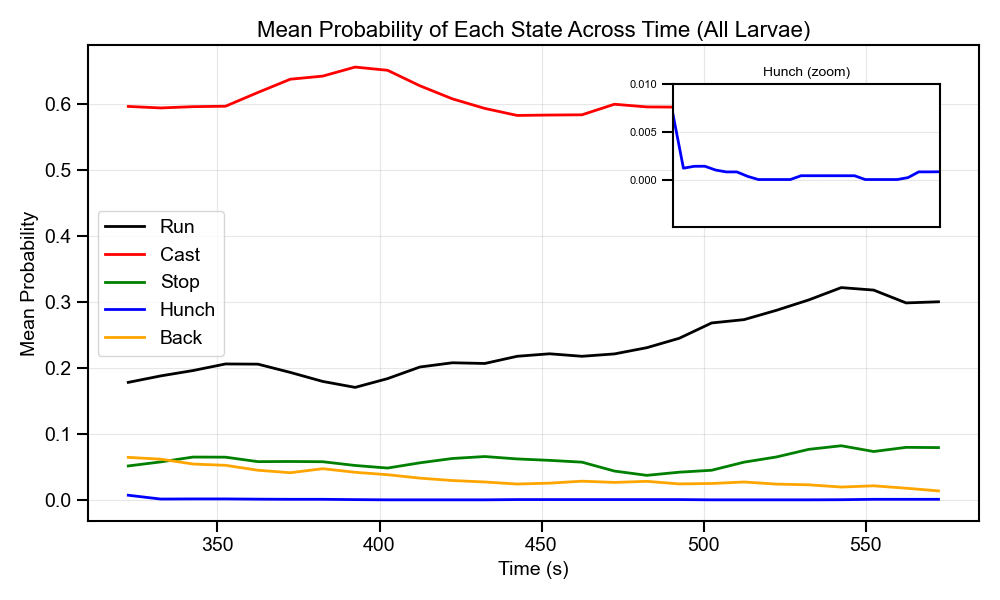

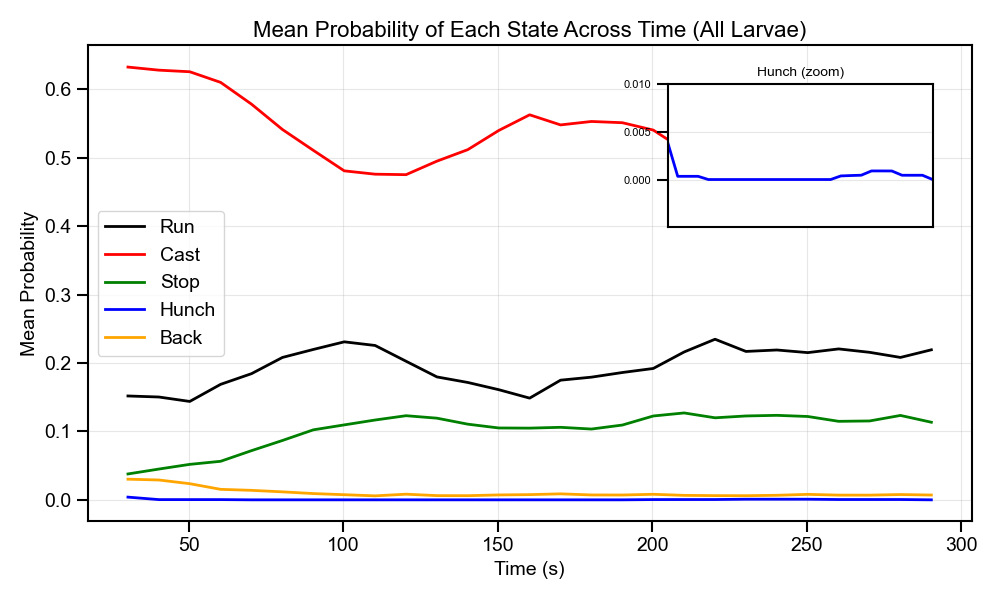

...

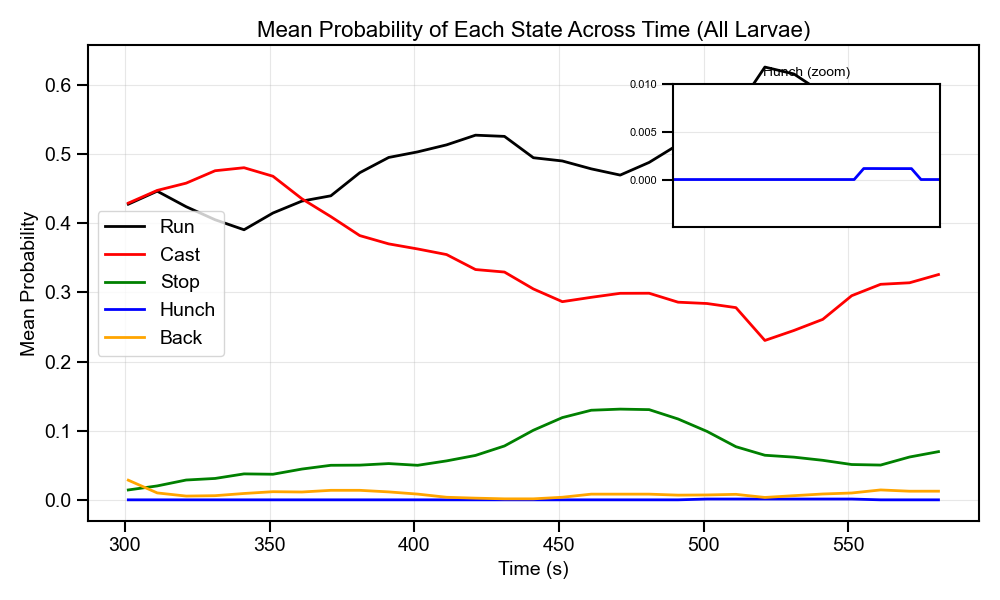

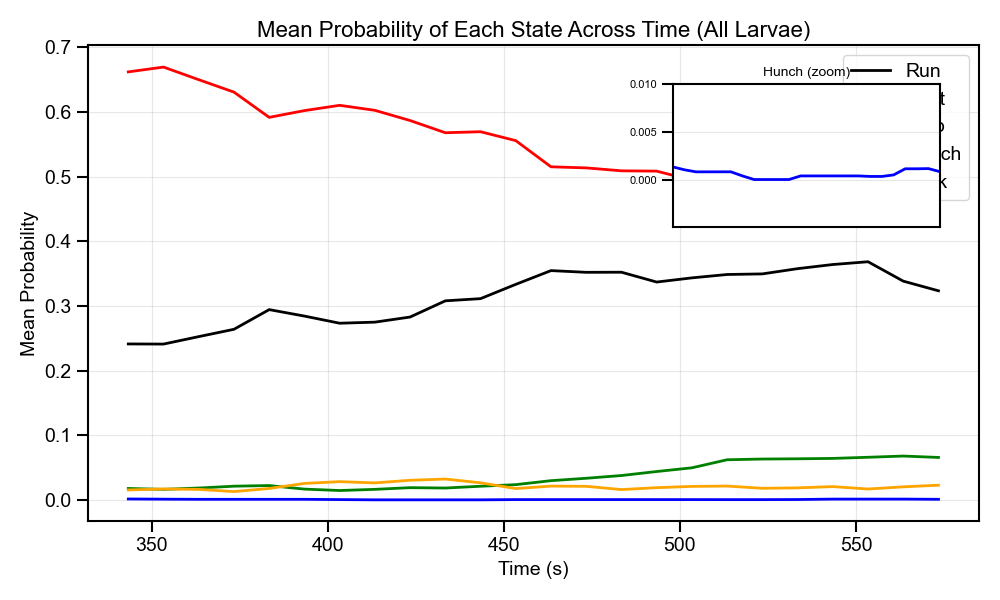

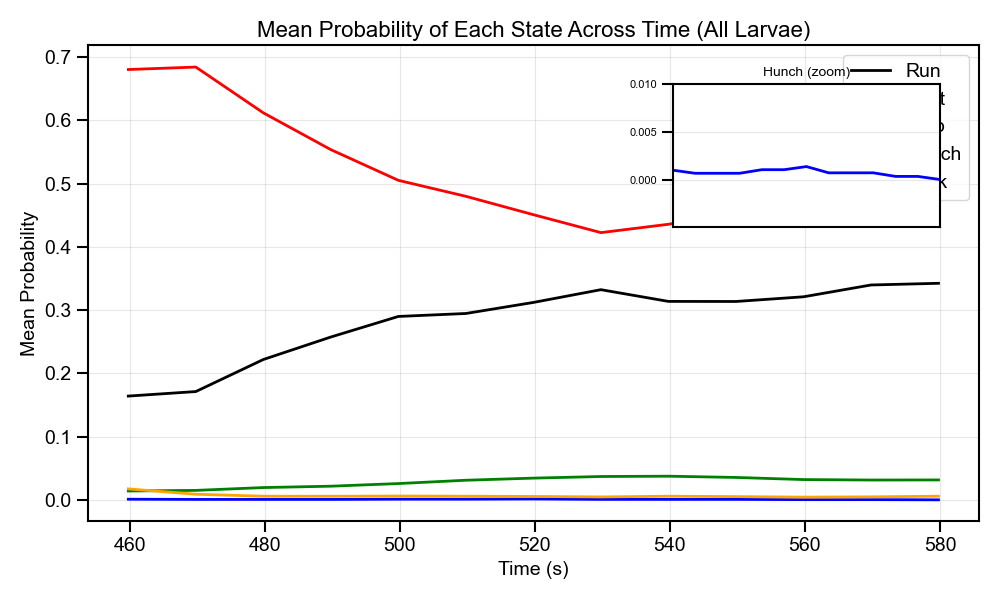

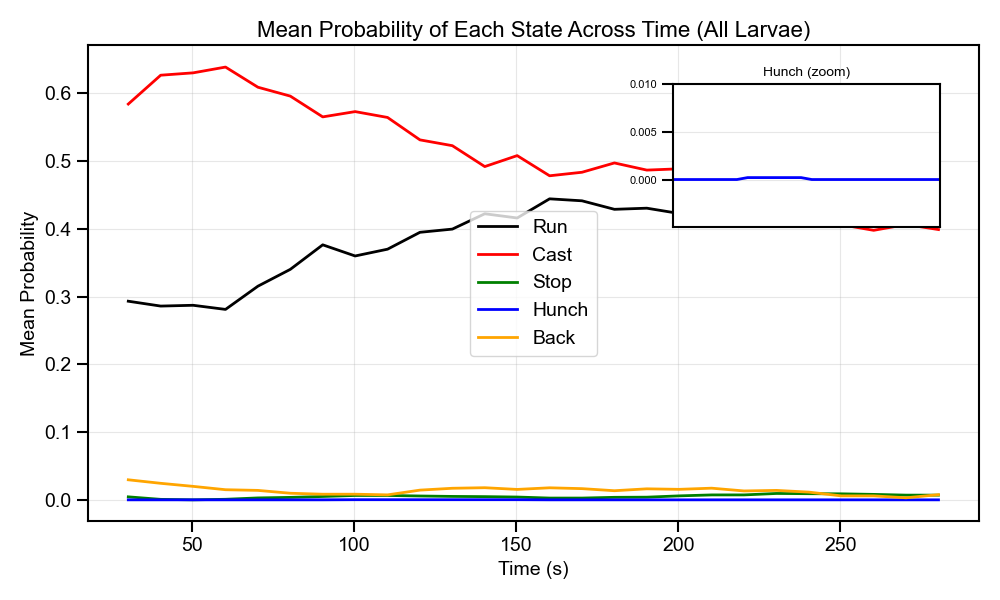

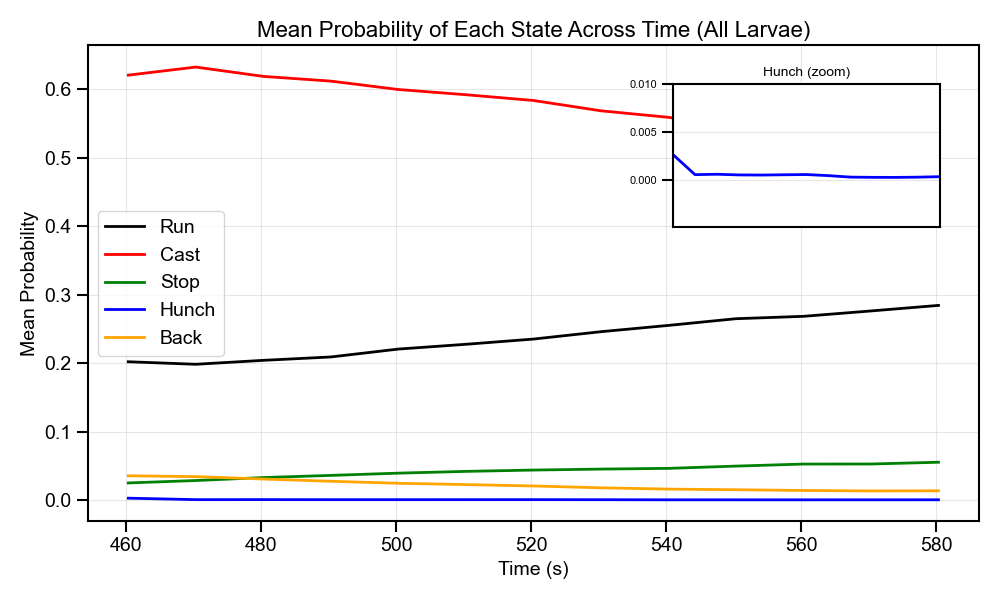

In [19]:
plot_global_state_over_time_genotype(all_dates_data, output_dir=None, show_plot=True, window=60, step=10)

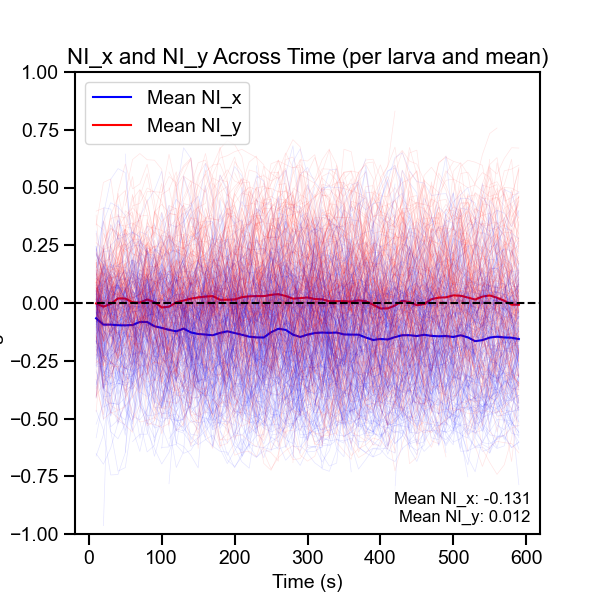

In [9]:
def compute_v_and_axis(trx_data):
    """
    Compute velocity along x and y axes for each larva and store normalized velocities.
    Adds: c_axis_x, c_axis_y, speed, c_axis_x_normalized, c_axis_y_normalized, speed_normalized to each larva.
    Works with {'data': ...} or plain dict.
    """
    import numpy as np

    # Accept both {'data': ...} and plain dict
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    for larva_id, larva in data_to_process.items():
        # Require t, x_center, y_center, larva_length_smooth_5
        if not all(k in larva for k in ['t', 'x_center', 'y_center', 'larva_length_smooth_5']):
            print(f"Skipping larva {larva_id} due to missing required fields.")
            continue
        t = np.array(larva['t']).flatten()
        x = np.array(larva['x_center']).flatten()
        y = np.array(larva['y_center']).flatten()
        length = np.array(larva['larva_length_smooth_5']).flatten()
        n = min(len(t), len(x), len(y), len(length))
        if n < 2:
            continue
        t = t[:n]
        x = x[:n]
        y = y[:n]
        length = length[:n]

        # Compute velocities (forward difference, last value is nan)
        dt = np.diff(t)
        dx = np.diff(x)
        dy = np.diff(y)
        c_axis_x = np.full(n, np.nan)
        c_axis_y = np.full(n, np.nan)
        speed = np.full(n, np.nan)
        valid = dt > 0
        c_axis_x[:-1][valid] = dx[valid] / dt[valid]
        c_axis_y[:-1][valid] = dy[valid] / dt[valid]
        speed[:-1][valid] = np.sqrt(c_axis_x[:-1][valid]**2 + c_axis_y[:-1][valid]**2)

        # Normalize by mean larva length (ignoring nans)
        mean_size = np.nanmean(length)
        c_axis_x_normalized = c_axis_x / mean_size
        c_axis_y_normalized = c_axis_y / mean_size
        speed_normalized = speed / mean_size

        larva['c_axis_x'] = c_axis_x
        larva['c_axis_y'] = c_axis_y
        larva['speed'] = speed
        larva['c_axis_x_normalized'] = c_axis_x_normalized
        larva['c_axis_y_normalized'] = c_axis_y_normalized
        larva['speed_normalized'] = speed_normalized

    return trx_data


def compute_NI_x_y_over_time(trx_data, window=60, step=10, t_max=600, show_plot=True, ax=None):
    """
    Compute and plot NI_x and NI_y (navigational index in x and y) across time for each larva.
    NI_x = <c_axis_x_normalized> / <speed_normalized> (mean over window)
    NI_y = <c_axis_y_normalized> / <speed_normalized>
    Returns a dict with time bins and NI_x, NI_y arrays (larva x time).
    """
    import numpy as np
    import matplotlib.pyplot as plt

    # Prepare data
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    larva_ids = list(data_to_process.keys())
    n_larvae = len(larva_ids)
    time_bins = np.arange(0, t_max - window + step, step) + window / 2
    NI_x_mat = np.full((n_larvae, len(time_bins)), np.nan)
    NI_y_mat = np.full((n_larvae, len(time_bins)), np.nan)

    for i, larva_id in enumerate(larva_ids):
        larva = data_to_process[larva_id]
        t = np.array(larva['t']).flatten()
        c_x = np.array(larva.get('c_axis_x_normalized', []))
        c_y = np.array(larva.get('c_axis_y_normalized', []))
        speed = np.array(larva.get('speed_normalized', []))
        if len(t) < 2 or len(c_x) != len(t):
            continue
        for j, t_center in enumerate(time_bins):
            t0 = t_center - window / 2
            t1 = t_center + window / 2
            mask = (t >= t0) & (t < t1)
            if np.sum(mask) < 2:
                continue
            mean_cx = np.nanmean(c_x[mask])
            mean_cy = np.nanmean(c_y[mask])
            mean_speed = np.nanmean(speed[mask])
            # Correct NI: mean projection divided by mean speed
            NI_x_mat[i, j] = mean_cx / mean_speed if mean_speed != 0 else np.nan
            NI_y_mat[i, j] = mean_cy / mean_speed if mean_speed != 0 else np.nan

    # Plot
    if show_plot:
        if ax is None:
            fig, ax = plt.subplots(figsize=(6,6))
        mean_NI_x = np.nanmean(NI_x_mat, axis=0)
        mean_NI_y = np.nanmean(NI_y_mat, axis=0)
        ax.plot(time_bins, mean_NI_x, color='blue', label='Mean NI_x')
        ax.plot(time_bins, mean_NI_y, color='red', label='Mean NI_y')
        for i in range(n_larvae):
            ax.plot(time_bins, NI_x_mat[i], color='blue', alpha=0.1, linewidth=0.5)
            ax.plot(time_bins, NI_y_mat[i], color='red', alpha=0.1, linewidth=0.5)
        ax.axhline(0, color='black', linestyle='--')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Navigational Index')
        ax.set_title('NI_x and NI_y Across Time (per larva and mean)')
        ax.set_ylim(-1, 1)
        ax.legend()
        mean_NI_x_val = np.nanmean(mean_NI_x)
        mean_NI_y_val = np.nanmean(mean_NI_y)
        ax.text(
            0.98, 0.02,
            f"Mean NI_x: {mean_NI_x_val:.3f}\nMean NI_y: {mean_NI_y_val:.3f}",
            ha='right', va='bottom', transform=ax.transAxes,
            fontsize=12, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
        )
        if ax is None:
            plt.tight_layout()
            plt.show()

    return {
        'time_bins': time_bins,
        'NI_x_mat': NI_x_mat,
        'NI_y_mat': NI_y_mat,
        'mean_NI_x': np.nanmean(NI_x_mat, axis=0),
        'mean_NI_y': np.nanmean(NI_y_mat, axis=0),
        'larva_ids': larva_ids
    }
# Example usage:

all_dates_data['all_combined']['merged_data'] = compute_v_and_axis(all_dates_data['all_combined']['merged_data'])
result = compute_NI_x_y_over_time(all_dates_data['all_combined']['merged_data'], window=20, step=10, t_max=600)

/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


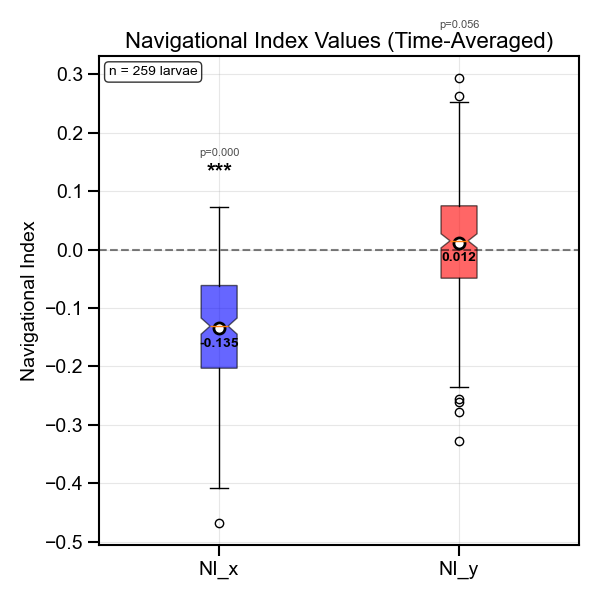

/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/all_combined/NI_boxplot_all_combined.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/all_combined/NI_boxplot_all_combined.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_143334/NI_boxplot_20240219_143334.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_143334/NI_boxplot_20240219_143334.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_145653/NI_boxplot_20240226_145653.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_145653/NI_boxplot_20240226_145653.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_163646/NI_boxplot_20240226_163646.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_163646/NI_boxplot_20240226_163646.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_121446/NI_boxplot_20240301_121446.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_121446/NI_boxplot_20240301_121446.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)
/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_162010/NI_boxplot_20240304_162010.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_162010/NI_boxplot_20240304_162010.pdf
Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250610_145557/NI_boxplot_20250610_145557.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250610_145557/NI_boxplot_20250610_145557.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250616_110409/NI_boxplot_20250616_110409.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250616_110409/NI_boxplot_20250616_110409.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250623_113205/NI_boxplot_20250623_113205.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250623_113205/NI_boxplot_20250623_113205.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250624_143316/NI_boxplot_20250624_143316.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250624_143316/NI_boxplot_20250624_143316.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)
/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250624_153628/NI_boxplot_20250624_153628.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250624_153628/NI_boxplot_20250624_153628.pdf
Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250626_142647/NI_boxplot_20250626_142647.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250626_142647/NI_boxplot_20250626_142647.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250711_112928/NI_boxplot_20250711_112928.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250711_112928/NI_boxplot_20250711_112928.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250712_131147/NI_boxplot_20250712_131147.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250712_131147/NI_boxplot_20250712_131147.pdf
Saved NI boxplot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250715_112915/NI_boxplot_20250715_112915.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20250715_112915/NI_boxplot_20250715_112915.pdf


/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)


In [10]:
def compute_NI_x_y_single_values(trx_data, window=60, step=10, t_max=600):
    """
    Compute single NI_x and NI_y values per larva by averaging across time.
    Returns a dict with larva-wise NI values.
    """
    import numpy as np
    
    # Get the time-series NI data first
    result = compute_NI_x_y_over_time(trx_data, window=window, step=step, t_max=t_max, show_plot=False)
    
    NI_x_mat = result['NI_x_mat']
    NI_y_mat = result['NI_y_mat']
    larva_ids = result['larva_ids']
    
    # Average across time for each larva
    NI_x_single = np.nanmean(NI_x_mat, axis=1)
    NI_y_single = np.nanmean(NI_y_mat, axis=1)
    
    # Combine into single NI_x_y metric (vector magnitude)
    NI_x_y_single = np.sqrt(NI_x_single**2 + NI_y_single**2)
    
    return {
        'larva_ids': larva_ids,
        'NI_x_single': NI_x_single,
        'NI_y_single': NI_y_single,
        'NI_x_y_single': NI_x_y_single
    }
def plot_NI_x_y_boxplot_with_significance(trx_data, window=60, step=10, t_max=600, show_plot=True, ax=None):
    """
    Plot box plots for NI_x and NI_y values with significance testing.
    Tests if each distribution is significantly different from 0.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy import stats
    
    # Compute single values
    result = compute_NI_x_y_single_values(trx_data, window=window, step=step, t_max=t_max)
    
    NI_x_values = result['NI_x_single']
    NI_y_values = result['NI_y_single'] 
    larva_ids = result['larva_ids']
    
    # Remove NaN values for statistical testing
    NI_x_clean = NI_x_values[~np.isnan(NI_x_values)]
    NI_y_clean = NI_y_values[~np.isnan(NI_y_values)]
    
    # Perform one-sample t-tests against 0
    def test_significance(values, test_value=0):
        if len(values) < 3:
            return np.nan, "insufficient data"
        t_stat, p_value = stats.ttest_1samp(values, test_value)
        if p_value < 0.001:
            return p_value, "***"
        elif p_value < 0.01:
            return p_value, "**"
        elif p_value < 0.05:
            return p_value, "*"
        else:
            return p_value, "ns"
    
    p_NI_x, sig_NI_x = test_significance(NI_x_clean)
    p_NI_y, sig_NI_y = test_significance(NI_y_clean)
    
    # Create plot
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(6, 6))
        created_fig = True
    else:
        created_fig = False
    
    # Prepare data for box plot (only NI_x and NI_y)
    data_to_plot = [NI_x_clean, NI_y_clean]
    labels = ['NI_x', 'NI_y']
    colors = ['blue', 'red']
    significances = [sig_NI_x, sig_NI_y]
    p_values = [p_NI_x, p_NI_y]
    
    # Create box plot
    bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)
    
    # Color the boxes
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.6)
    
    # Add horizontal line at y=0
    ax.axhline(y=0, color='black', linestyle='--', alpha=0.5)
    
    # Add significance markers and p-values
    for i, (sig, p_val) in enumerate(zip(significances, p_values)):
        # Get the position for the significance marker
        y_pos = np.max(data_to_plot[i]) if len(data_to_plot[i]) > 0 else 0
        y_offset = (ax.get_ylim()[1] - ax.get_ylim()[0]) * 0.05
        
        if sig != "ns" and sig != "insufficient data":
            ax.text(i + 1, y_pos + y_offset, sig, 
                   ha='center', va='bottom', fontsize=16, fontweight='bold')
        
        # Add p-value as smaller text
        if not np.isnan(p_val):
            ax.text(i + 1, y_pos + 2*y_offset, f'p={p_val:.3f}', 
                   ha='center', va='bottom', fontsize=8, alpha=0.7)
    
    # Calculate and display means
    means = [np.nanmean(data) for data in data_to_plot]
    for i, mean_val in enumerate(means):
        ax.plot(i + 1, mean_val, 'ko', markersize=8, markerfacecolor='white', 
               markeredgewidth=2, markeredgecolor='black')
        ax.text(i + 1, mean_val - (ax.get_ylim()[1] - ax.get_ylim()[0]) * 0.02, 
               f'{mean_val:.3f}', ha='center', va='top', fontsize=10, fontweight='bold')
    
    ax.set_ylabel('Navigational Index')
    ax.set_title('Navigational Index Values (Time-Averaged)')
    ax.grid(True, alpha=0.3)
    
    # Add sample size information
    n_larvae = len([x for x in NI_x_clean if not np.isnan(x)])
    ax.text(0.02, 0.98, f'n = {n_larvae} larvae', transform=ax.transAxes, 
           fontsize=10, va='top', ha='left', 
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    return {
        'data': data_to_plot,
        'labels': labels,
        'means': means,
        'p_values': p_values,
        'significances': significances,
        'n_larvae': n_larvae
    }

def save_NI_boxplot(trx_data, output_dir, date_str, window=20, step=10, t_max=600):
    """
    Compute and save NI box plot for a given trx_data, saving to output_dir/date_str/.
    """
    import os
    import matplotlib.pyplot as plt
    
    # Ensure velocity fields are present
    trx_data = compute_v_and_axis(trx_data)
    
    # Create and save box plot
    fig, ax = plt.subplots(figsize=(8, 6))
    plot_NI_x_y_boxplot_with_significance(trx_data, window=window, step=step, t_max=t_max, 
                                        show_plot=True, ax=ax)
    
    # Save
    date_dir = os.path.join(output_dir, date_str)
    os.makedirs(date_dir, exist_ok=True)
    save_path_png = os.path.join(date_dir, f"NI_boxplot_{date_str}.png")
    save_path_pdf = os.path.join(date_dir, f"NI_boxplot_{date_str}.pdf")
    plt.savefig(save_path_png, dpi=300, bbox_inches='tight')
    plt.savefig(save_path_pdf, bbox_inches='tight')
    plt.close(fig)
    print(f"Saved NI boxplot to {save_path_png} and {save_path_pdf}")

# Example usage:
all_dates_data['all_combined']['merged_data'] = compute_v_and_axis(all_dates_data['all_combined']['merged_data'])

# Create the box plot
result_boxplot = plot_NI_x_y_boxplot_with_significance(
    all_dates_data['all_combined']['merged_data'], 
    window=20, step=10, t_max=600
)

# Save for all_combined
if 'all_combined' in all_dates_data:
    save_NI_boxplot(
        all_dates_data['all_combined']['merged_data'],
        output_dir,
        'all_combined',
        window=20, step=10, t_max=600
    )

# Save for each individual date
for date_key, date_data in all_dates_data.items():
    if date_key == 'all_combined':
        continue
    save_NI_boxplot(
        date_data['merged_data'],
        output_dir,
        date_data['date_str'],
        window=20, step=10, t_max=600
    )

/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)
/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)
/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_62904/1820994831.py:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, notch=True)
/var/folde

Saved comparison plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/NI_boxplots_all_dates_comparison.png


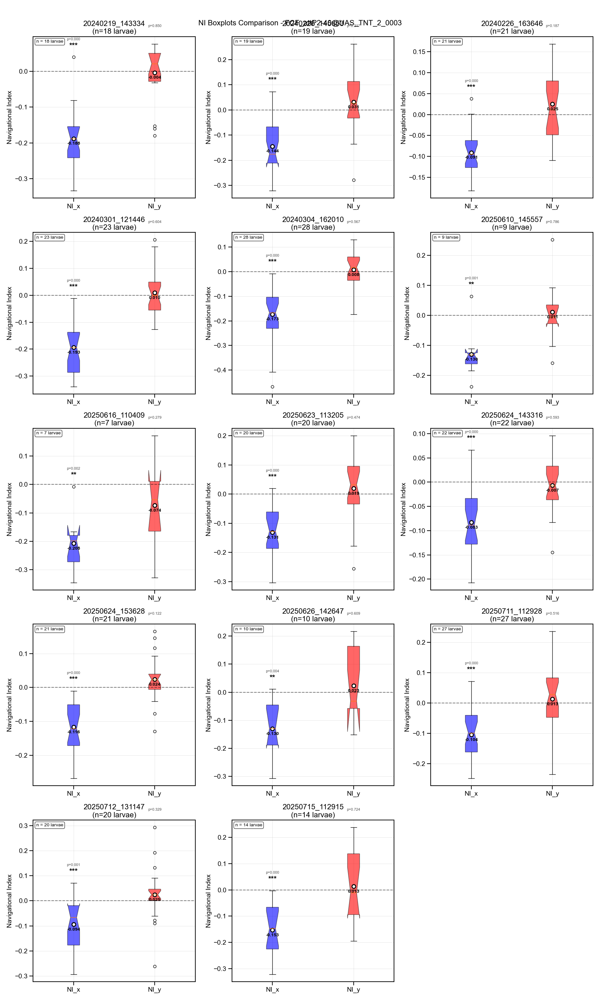

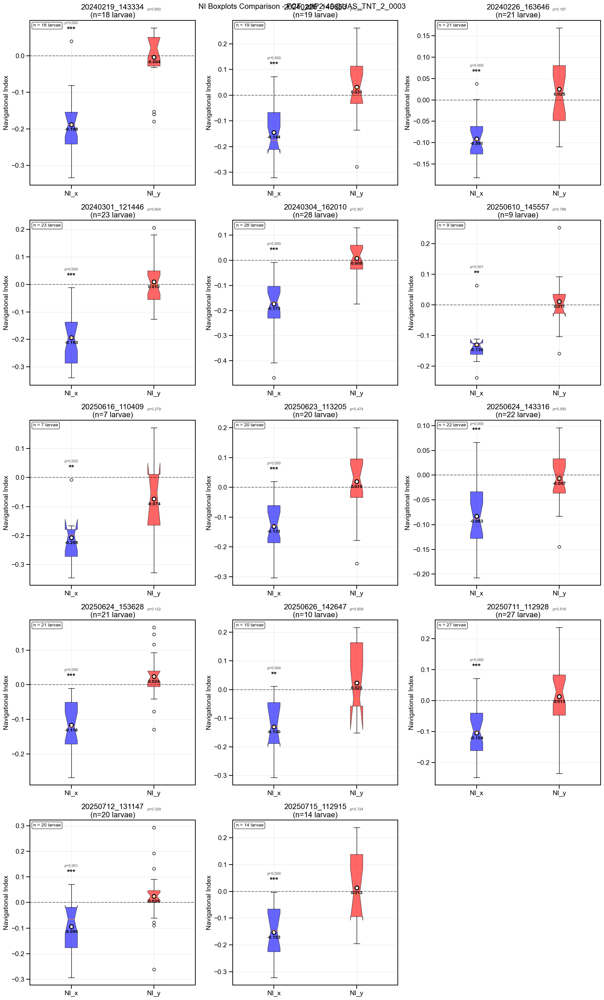

In [11]:
def plot_all_dates_NI_comparison(all_dates_data, window=20, step=10, t_max=600, output_dir=None):
    """
    Plot NI boxplots for all individual dates in a single figure for comparison.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Get individual dates (exclude 'all_combined')
    individual_dates = {k: v for k, v in all_dates_data.items() if k != 'all_combined'}
    n_dates = len(individual_dates)
    
    if n_dates == 0:
        print("No individual date data found")
        return
    
    # Calculate subplot grid dimensions
    n_cols = min(3, n_dates)  # Max 3 columns
    n_rows = (n_dates + n_cols - 1) // n_cols  # Ceiling division
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 6*n_rows))
    if n_dates == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes if isinstance(axes, np.ndarray) else [axes]
    else:
        axes = axes.flatten()
    
    for i, (date_key, date_data) in enumerate(individual_dates.items()):
        ax = axes[i] if i < len(axes) else None
        if ax is None:
            continue
            
        # Ensure velocity data is computed
        date_data['merged_data'] = compute_v_and_axis(date_data['merged_data'])
        
        # Create boxplot for this date
        result = plot_NI_x_y_boxplot_with_significance(
            date_data['merged_data'],
            window=window, step=step, t_max=t_max,
            show_plot=False, ax=ax
        )
        
        ax.set_title(f"{date_data['date_str']}\n(n={result['n_larvae']} larvae)")
    
    # Hide empty subplots
    for i in range(n_dates, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(f"NI Boxplots Comparison - {os.path.basename(genotype_base_path)}", fontsize=16)
    plt.tight_layout()
    
    if output_dir:
        save_path = os.path.join(output_dir, "NI_boxplots_all_dates_comparison.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved comparison plot to {save_path}")
    
    plt.show()
    return fig

# Use the function to create comparison plot
plot_all_dates_NI_comparison(all_dates_data, window=20, step=10, t_max=600, output_dir=output_dir)

In [ ]:
def save_NI_x_y_plot(trx_data, output_dir, date_str, window=20, step=10, t_max=600):
    """
    Compute and save NI_x and NI_y plot for a given trx_data (merged_data), saving to output_dir/date_str/.
    """
    import os
    import matplotlib.pyplot as plt

    # Ensure velocity fields are present
    trx_data = compute_v_and_axis(trx_data)
    # Compute NI_x and NI_y and plot
    fig, ax = plt.subplots(figsize=(6, 6))
    compute_NI_x_y_over_time(trx_data, window=window, step=step, t_max=t_max, show_plot=True, ax=ax)
    # Save
    date_dir = os.path.join(output_dir, date_str)
    os.makedirs(date_dir, exist_ok=True)
    save_path_png = os.path.join(date_dir, f"NI_x_y_over_time_{date_str}.png")
    save_path_pdf = os.path.join(date_dir, f"NI_x_y_over_time_{date_str}.pdf")
    plt.savefig(save_path_png)
    plt.savefig(save_path_pdf)
    plt.close(fig)
    print(f"Saved NI_x/NI_y plot to {save_path_png} and {save_path_pdf}")

# Save for all_combined
if 'all_combined' in all_dates_data:
    save_NI_x_y_plot(
        all_dates_data['all_combined']['merged_data'],
        output_dir,
        'all_combined',
        window=20, step=10, t_max=600
    )


# Save for each individual date
for date_key, date_data in all_dates_data.items():
    if date_key == 'all_combined':
        continue
    save_NI_x_y_plot(
        date_data['merged_data'],
        output_dir,
        date_data['date_str'],
        window=20, step=10, t_max=600
    )
    analyze_velocity_by_orientation

def compute_dispersion(trx_data, center_type='vertical', center_value=None):
    """
    Compute the dispersion (spread) of larvae away from a central reference.
    - center_type: 'vertical' (default) or 'point'
        - 'vertical': computes distance from a vertical line x=center_value (default: mean of all starting x)
        - 'point': computes distance from a point (center_value: (x0, y0), default: mean of all starting positions)
    Returns:
        dispersion_dict: {larva_id: {'dispersion': value, 'distances': array, 'center': ...}}
    """
    import numpy as np

    # Accept both {'data': ...} and plain dict
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    # Gather all starting positions
    start_xs = []
    start_ys = []
    for larva in data_to_process.values():
        if 'x_center' in larva and 'y_center' in larva:
            x = np.array(larva['x_center']).flatten()
            y = np.array(larva['y_center']).flatten()
            if len(x) > 0 and len(y) > 0:
                start_xs.append(x[0])
                start_ys.append(y[0])

    # Default center
    if center_type == 'vertical':
        if center_value is None:
            center_value = np.mean(start_xs) if start_xs else 0.0
        center = center_value
    elif center_type == 'point':
        if center_value is None:
            center_value = (np.mean(start_xs), np.mean(start_ys)) if start_xs and start_ys else (0.0, 0.0)
        center = center_value
    else:
        raise ValueError("center_type must be 'vertical' or 'point'")

    dispersion_dict = {}
    for larva_id, larva in data_to_process.items():
        if 'x_center' not in larva or 'y_center' not in larva:
            continue
        x = np.array(larva['x_center']).flatten()
        y = np.array(larva['y_center']).flatten()
        if len(x) == 0 or len(y) == 0:
            continue

        if center_type == 'vertical':
            distances = np.abs(x - center)
        elif center_type == 'point':
            distances = np.sqrt((x - center[0])**2 + (y - center[1])**2)

        dispersion = np.std(distances)
        dispersion_dict[larva_id] = {
            'dispersion': dispersion,
            'distances': distances,
            'center': center
        }
    return dispersion_dict
    

Saved NI_x/NI_y plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/all_combined/NI_x_y_over_time_all_combined.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/all_combined/NI_x_y_over_time_all_combined.pdf
Saved NI_x/NI_y plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_143334/NI_x_y_over_time_20240219_143334.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_143334/NI_x_y_over_time_20240219_143334.pdf
Saved NI_x/NI_y plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_145653/NI_x_y_over_time_20240226_145653.png and ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_145653/NI_x_y_over_time_20240226_145653.pdf
Saved NI_x/NI_y plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_163646/NI_x_y_over_time_2024022

Saved single subplot comparison to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/NI_boxplots_all_dates_single_subplot.png


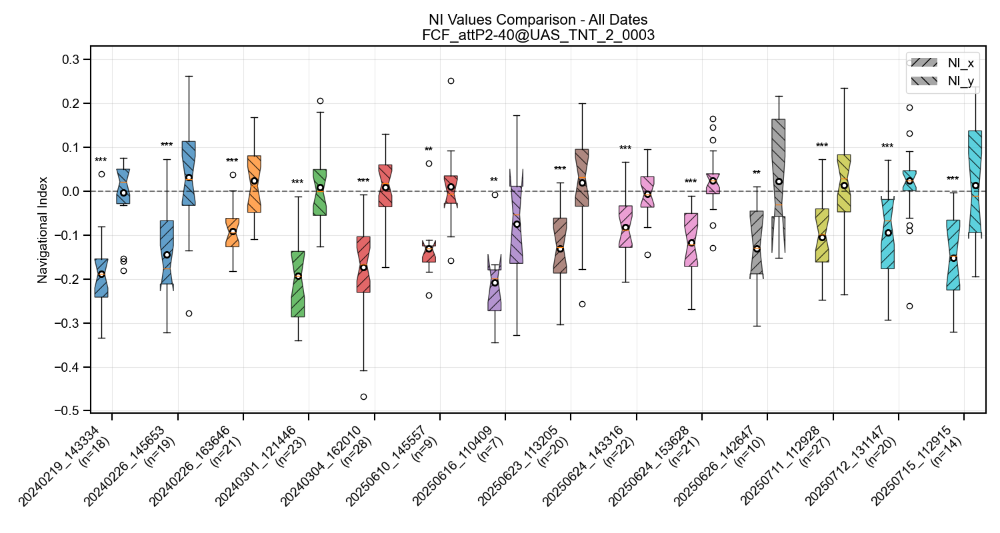

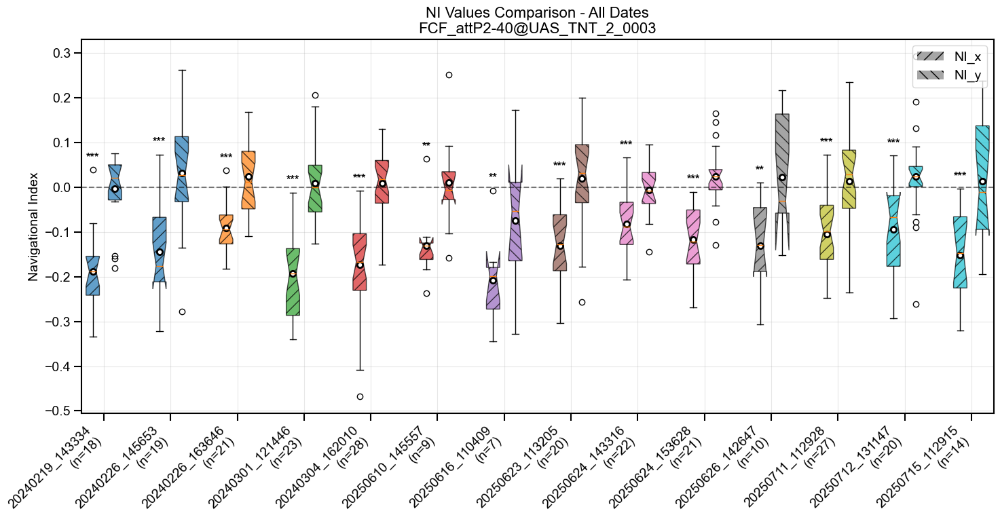

In [14]:
def plot_all_dates_NI_boxplots_single_subplot(all_dates_data, window=20, step=10, t_max=600, output_dir=None):
    """
    Plot NI_x and NI_y boxplots for all individual dates on a single subplot for comparison.
    Each date gets its own pair of boxplots (NI_x and NI_y) with different colors.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from scipy import stats
    
    # Get individual dates (exclude 'all_combined')
    individual_dates = {k: v for k, v in all_dates_data.items() if k != 'all_combined'}
    n_dates = len(individual_dates)
    
    if n_dates == 0:
        print("No individual date data found")
        return
    
    fig, ax = plt.subplots(figsize=(15, 8))
    
    # Prepare data for all dates
    all_NI_x_data = []
    all_NI_y_data = []
    date_labels = []
    colors = plt.cm.tab10(np.linspace(0, 1, n_dates))
    
    positions = []
    pos_counter = 0
    
    for i, (date_key, date_data) in enumerate(individual_dates.items()):
        # Ensure velocity data is computed
        date_data['merged_data'] = compute_v_and_axis(date_data['merged_data'])
        
        # Compute single NI values for this date
        result = compute_NI_x_y_single_values(
            date_data['merged_data'],
            window=window, step=step, t_max=t_max
        )
        
        NI_x_clean = result['NI_x_single'][~np.isnan(result['NI_x_single'])]
        NI_y_clean = result['NI_y_single'][~np.isnan(result['NI_y_single'])]
        
        if len(NI_x_clean) == 0 or len(NI_y_clean) == 0:
            continue
            
        all_NI_x_data.append(NI_x_clean)
        all_NI_y_data.append(NI_y_clean)
        date_labels.append(f"{date_data['date_str']}\n(n={len(NI_x_clean)})")
        
        # Positions for this date's boxplots
        positions.extend([pos_counter, pos_counter + 1])
        pos_counter += 3  # Leave gap between dates
    
    if not all_NI_x_data:
        print("No valid NI data found for any dates")
        return
    
    # Interleave NI_x and NI_y data for plotting
    all_data = []
    box_colors = []
    box_labels = []
    
    for i in range(len(all_NI_x_data)):
        all_data.extend([all_NI_x_data[i], all_NI_y_data[i]])
        box_colors.extend([colors[i], colors[i]])
        box_labels.extend(['NI_x', 'NI_y'])
    
    # Create boxplots
    bp = ax.boxplot(all_data, positions=positions, patch_artist=True, 
                    notch=True, widths=0.6)
    
    # Color the boxes
    for i, (patch, color) in enumerate(zip(bp['boxes'], box_colors)):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
        # Different patterns for NI_x vs NI_y
        if i % 2 == 0:  # NI_x
            patch.set_hatch('//')
        else:  # NI_y
            patch.set_hatch('\\\\')
    
    # Add horizontal line at y=0
    ax.axhline(y=0, color='black', linestyle='--', alpha=0.5)
    
    # Add significance testing and means for each boxplot
    for i, data in enumerate(all_data):
        if len(data) >= 3:
            t_stat, p_value = stats.ttest_1samp(data, 0)
            
            # Significance markers
            if p_value < 0.001:
                sig = "***"
            elif p_value < 0.01:
                sig = "**"
            elif p_value < 0.05:
                sig = "*"
            else:
                sig = "ns"
            
            # Plot significance and mean
            pos = positions[i]
            y_max = np.max(data)
            y_offset = (ax.get_ylim()[1] - ax.get_ylim()[0]) * 0.02
            
            if sig != "ns":
                ax.text(pos, y_max + y_offset, sig, 
                       ha='center', va='bottom', fontsize=12, fontweight='bold')
            
            # Add mean as a point
            mean_val = np.mean(data)
            ax.plot(pos, mean_val, 'ko', markersize=6, markerfacecolor='white', 
                   markeredgewidth=2, markeredgecolor='black')
    
    # Set x-axis labels
    group_positions = [(positions[i*2] + positions[i*2+1]) / 2 for i in range(len(date_labels))]
    ax.set_xticks(group_positions)
    ax.set_xticklabels(date_labels, rotation=45, ha='right')
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='gray', alpha=0.7, hatch='//', label='NI_x'),
        Patch(facecolor='gray', alpha=0.7, hatch='\\\\', label='NI_y')
    ]
    ax.legend(handles=legend_elements, loc='upper right')
    
    ax.set_ylabel('Navigational Index')
    ax.set_title(f'NI Values Comparison - All Dates\n{os.path.basename(genotype_base_path)}')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if output_dir:
        save_path = os.path.join(output_dir, "NI_boxplots_all_dates_single_subplot.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved single subplot comparison to {save_path}")
    
    plt.show()
    
    return fig

# Use the function
plot_all_dates_NI_boxplots_single_subplot(all_dates_data, window=20, step=10, t_max=600, output_dir=output_dir)

/var/folders/qs/_71td1zx7kjd4t5xhw9wndn00000gp/T/ipykernel_28471/396633409.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved dispersion plot to ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/dispersion_over_time_all_combined.png


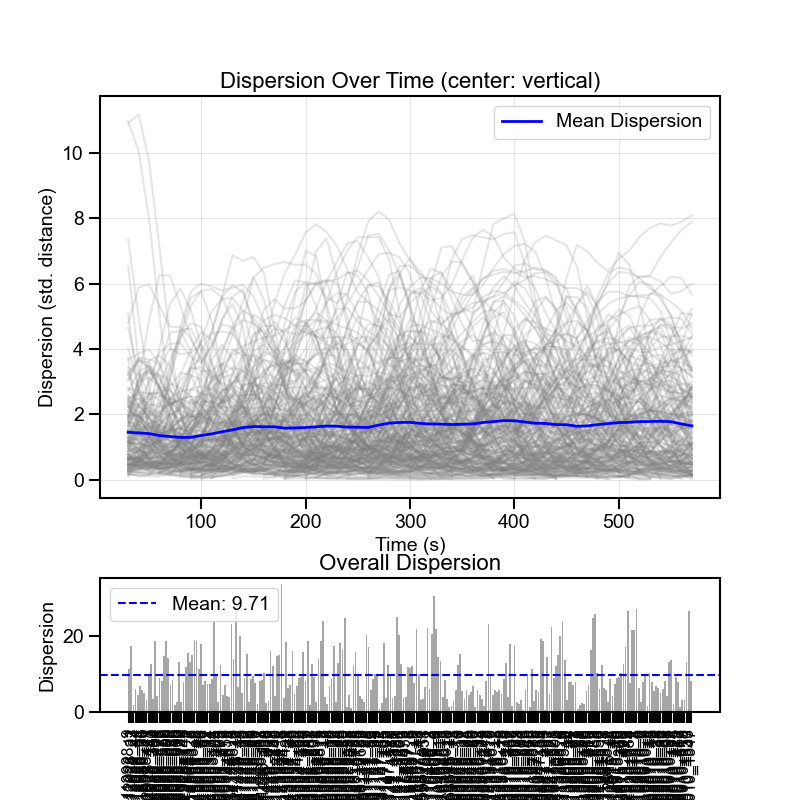

In [22]:
def compute_dispersion_over_time(trx_data, window=60, step=10, t_max=600, center_type='vertical', center_value=None):
    """
    Compute dispersion over time for each larva.
    Returns:
        {
            'time_bins': array,
            'dispersion_mat': (n_larvae, n_time_bins) array,
            'larva_ids': list,
            'center': value
        }
    """
    import numpy as np

    # Accept both {'data': ...} and plain dict
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data

    # Gather all starting positions for default center
    start_xs, start_ys = [], []
    for larva in data_to_process.values():
        if 'x_center' in larva and 'y_center' in larva:
            x = np.array(larva['x_center']).flatten()
            y = np.array(larva['y_center']).flatten()
            if len(x) > 0 and len(y) > 0:
                start_xs.append(x[0])
                start_ys.append(y[0])
    # Default center
    if center_type == 'vertical':
        if center_value is None:
            center_value = np.mean(start_xs) if start_xs else 0.0
        center = center_value
    elif center_type == 'point':
        if center_value is None:
            center_value = (np.mean(start_xs), np.mean(start_ys)) if start_xs and start_ys else (0.0, 0.0)
        center = center_value
    else:
        raise ValueError("center_type must be 'vertical' or 'point'")

    larva_ids = list(data_to_process.keys())
    n_larvae = len(larva_ids)
    time_bins = np.arange(0, t_max - window + step, step) + window / 2
    dispersion_mat = np.full((n_larvae, len(time_bins)), np.nan)

    for i, larva_id in enumerate(larva_ids):
        larva = data_to_process[larva_id]
        if 't' not in larva or 'x_center' not in larva or 'y_center' not in larva:
            continue
        t = np.array(larva['t']).flatten()
        x = np.array(larva['x_center']).flatten()
        y = np.array(larva['y_center']).flatten()
        n = min(len(t), len(x), len(y))
        if n < 2:
            continue
        t, x, y = t[:n], x[:n], y[:n]
        for j, t_center in enumerate(time_bins):
            t0 = t_center - window / 2
            t1 = t_center + window / 2
            mask = (t >= t0) & (t < t1)
            if np.sum(mask) < 2:
                continue
            if center_type == 'vertical':
                distances = np.abs(x[mask] - center)
            elif center_type == 'point':
                distances = np.sqrt((x[mask] - center[0])**2 + (y[mask] - center[1])**2)
            dispersion_mat[i, j] = np.std(distances)
    return {
        'time_bins': time_bins,
        'dispersion_mat': dispersion_mat,
        'larva_ids': larva_ids,
        'center': center
    }

def plot_dispersion_over_time_with_overall(
    trx_data, window=60, step=10, t_max=600, center_type='vertical', center_value=None, show_plot=True, save_path=None
):
    """
    Plot dispersion over time for all larvae and mean, with overall dispersion as a small subplot below.
    If save_path is given, saves the figure there.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec

    # Compute over-time dispersion
    result = compute_dispersion_over_time(trx_data, window, step, t_max, center_type, center_value)
    time_bins = result['time_bins']
    disp_mat = result['dispersion_mat']
    larva_ids = result['larva_ids']

    # Compute overall dispersion
    disp_dict = compute_dispersion(trx_data, center_type=center_type, center_value=center_value)
    dispersions = [disp_dict[lid]['dispersion'] for lid in larva_ids]
    mean_disp = np.mean(dispersions)

    # Create figure with two subplots (main + small below)
    fig = plt.figure(figsize=(8, 8))
    gs = GridSpec(2, 1, height_ratios=[3, 1], hspace=0.3)
    ax_main = fig.add_subplot(gs[0])
    ax_overall = fig.add_subplot(gs[1])

    # Main plot: dispersion over time
    for i in range(len(larva_ids)):
        ax_main.plot(time_bins, disp_mat[i], alpha=0.2, color='gray')
    mean_disp_time = np.nanmean(disp_mat, axis=0)
    ax_main.plot(time_bins, mean_disp_time, color='blue', linewidth=2, label='Mean Dispersion')
    ax_main.set_xlabel('Time (s)')
    ax_main.set_ylabel('Dispersion (std. distance)')
    ax_main.set_title(f'Dispersion Over Time (center: {center_type})')
    ax_main.grid(True, alpha=0.3)
    ax_main.legend()

    # Small subplot: overall dispersion bar plot
    ax_overall.bar(larva_ids, dispersions, color='gray', alpha=0.7)
    ax_overall.axhline(mean_disp, color='blue', linestyle='--', label=f'Mean: {mean_disp:.2f}')
    ax_overall.set_ylabel('Dispersion')
    ax_overall.set_xlabel('Larva ID')
    ax_overall.set_title('Overall Dispersion')
    ax_overall.legend()
    ax_overall.set_xticks(range(len(larva_ids)))
    ax_overall.set_xticklabels(larva_ids, rotation=90, fontsize='small')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved dispersion plot to {save_path}")
    if show_plot:
        plt.show()
    return fig

# Example usage:
# Save in the same folder as NI_x_y plot
if 'all_combined' in all_dates_data:
    save_path = os.path.join(output_dir, "dispersion_over_time_all_combined.png")
    plot_dispersion_over_time_with_overall(
        all_dates_data['all_combined']['merged_data'],
        window=60, step=10, t_max=600,
        center_type='vertical',
        show_plot=True,
        save_path=save_path
    )

# --- Explanation ---
# Dispersion is calculated as follows:
# - For each larva, at each time window, compute the distance from the larva's position to a central reference
#   (either a vertical line or a point).
# - The standard deviation of these distances within the window is the dispersion for that larva and window.
# - "Dispersion over time" shows how this spread evolves.
# - "Overall dispersion" is the standard deviation of all distances for each larva over the whole experiment.


MULTI-PROTOCOL ANALYSIS RESULTS

ANALYZING PROTOCOL: p_5gradient2_2s1x600s0s#n#n#n
Output directory: ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n
Combined data larvae count: 259
Saved comprehensive analysis to:
  - ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/comprehensive_analysis.png
  - ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/comprehensive_analysis.pdf


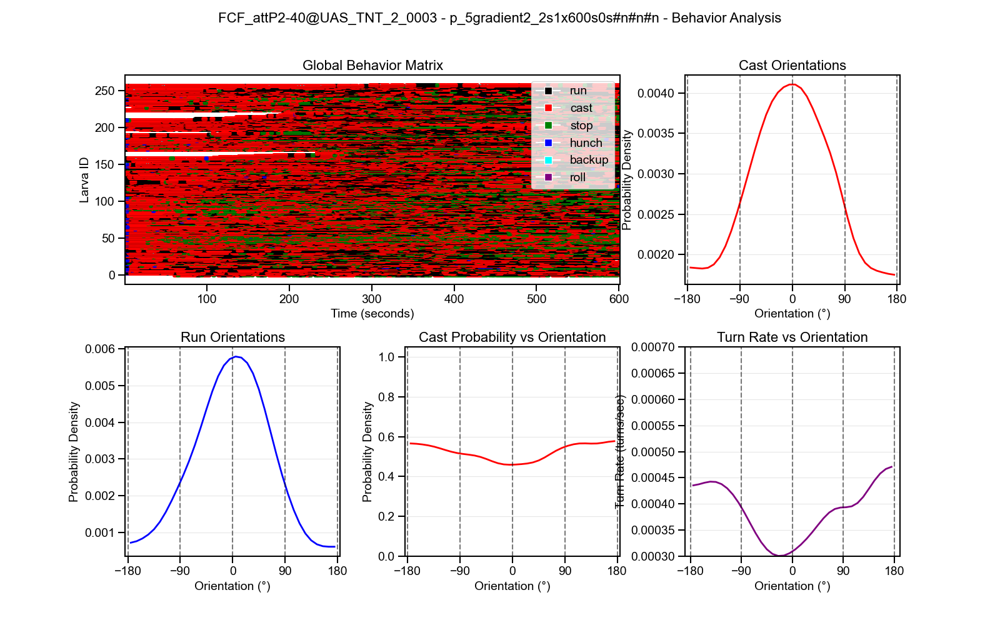

✓ Completed analysis for protocol: p_5gradient2_2s1x600s0s#n#n#n

ALL PROTOCOLS ANALYZED SUCCESSFULLY!
Results saved in separate folders for each protocol:
  - ../results/analysis/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/


In [23]:
# Multi-protocol analysis and plotting
print(f"\n{'='*80}")
print(f"MULTI-PROTOCOL ANALYSIS RESULTS")
print(f"{'='*80}")

for protocol in protocol_dirs:
    print(f"\n{'='*60}")
    print(f"ANALYZING PROTOCOL: {protocol}")
    print(f"{'='*60}")
    
    # Get the data for this protocol
    all_dates_data = all_protocols_data[protocol]
    combined_data = all_dates_data['all_combined']
    
    # Set output directory for this protocol
    output_dir = f"../results/analysis/{genotype}/{protocol}"
    
    print(f"Output directory: {output_dir}")
    print(f"Combined data larvae count: {len(combined_data['merged_data']['data'])}")
    
    # Create a comprehensive behavior matrix plot for this protocol
    fig = plt.figure(figsize=(16, 10))
    fig.suptitle(f"{genotype} - {protocol} - Behavior Analysis", fontsize=16)
    
    # Create grid layout for subplots  
    gs = fig.add_gridspec(2, 3, hspace=0.3, wspace=0.3)
    
    # 1. Behavior Matrix (top left, spans 2 columns)
    ax1 = fig.add_subplot(gs[0, :2])
    plot_global_behavior_matrix(
        combined_data['merged_data'], 
        show_separate_totals=False, 
        show_plot=False, 
        ax=ax1
    )
    ax1.set_title("Global Behavior Matrix")
    
    # 2. Cast Orientations (top right)
    ax2 = fig.add_subplot(gs[0, 2])
    analyze_cast_orientations_all_new(combined_data['merged_data'], show_plot=False, ax=ax2)
    ax2.set_title("Cast Orientations")
    
    # 3. Run Orientations (bottom left)
    ax3 = fig.add_subplot(gs[1, 0])
    analyze_run_orientations_all(combined_data['merged_data'], show_plot=False, ax=ax3)
    ax3.set_title("Run Orientations")
    
    # 4. Cast Probability vs Orientation (bottom center)
    ax4 = fig.add_subplot(gs[1, 1])
    analyze_cast_orientations_all_true(combined_data['merged_data'], show_plot=False, ax=ax4)
    ax4.set_title("Cast Probability vs Orientation")
    
    # 5. Turn Rate vs Orientation (bottom right)
    ax5 = fig.add_subplot(gs[1, 2])
    analyze_turn_rate_by_orientation_true(combined_data['merged_data'], show_plot=False, ax=ax5)
    ax5.set_title("Turn Rate vs Orientation")
    
    # Save the comprehensive analysis figure
    save_path_png = os.path.join(output_dir, "comprehensive_analysis.png")
    save_path_pdf = os.path.join(output_dir, "comprehensive_analysis.pdf")
    
    plt.savefig(save_path_png, dpi=300, bbox_inches='tight')
    plt.savefig(save_path_pdf, bbox_inches='tight')
    
    print(f"Saved comprehensive analysis to:")
    print(f"  - {save_path_png}")
    print(f"  - {save_path_pdf}")
    
    plt.show()
    
    print(f"✓ Completed analysis for protocol: {protocol}")

print(f"\n{'='*80}")
print(f"ALL PROTOCOLS ANALYZED SUCCESSFULLY!")
print(f"Results saved in separate folders for each protocol:")
for protocol in protocol_dirs:
    print(f"  - ../results/analysis/{genotype}/{protocol}/")
print(f"{'='*80}")